In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [3]:
data = pd.read_csv("/content/DataScientistTask_Dataset(Sheet1).csv")
df=data
df.head()


,WellID,BVHH,FormationAlias,NioGOR,CodGOR,LateralLength,ProppantPerFoot,FluidPerFoot,LeftDistance,LeftNeighbourType,RightDistance,RightNeighbourType,TVD,NormalizedOilEUR,NormalizedGasEUR
0,500109742,1.105028,NIOBRARA,1687.414535,NaN,8084.0,1256.308758,1234.370856,NaN,NoNeighbour,NaN,NoNeighbour,7501.0,15.234785,37.674048
1,500109753,0.644480,NIOBRARA,2267.667384,NaN,3912.0,742.842536,784.000000,NaN,NoNeighbour,1330.0,Codeveloped,7551.0,5.327198,11.627301
2,500109754,0.620268,NIOBRARA,2368.236087,NaN,4137.0,912.738700,1127.047136,1330.0,Codeveloped,NaN,NoNeighbour,7594.0,5.629925,14.544356
3,500109760,0.649670,NIOBRARA,333.876618,NaN,4161.0,914.683970,691.026676,NaN,NoNeighbour,NaN,NoNeighbour,7391.0,8.240087,7.012257
4,500109772,1.423475,NIOBRARA,3608.065949,3199.96293,4418.0,747.271843,928.239928,NaN,NoNeighbour,NaN,NoNeighbour,7838.0,15.374830,51.169534


## understand the data


In [4]:
df.describe()

,WellID,BVHH,NioGOR,CodGOR,LateralLength,ProppantPerFoot,FluidPerFoot,LeftDistance,RightDistance,TVD,NormalizedOilEUR,NormalizedGasEUR
count,9.206000e+03,7565.000000,8709.000000,7538.000000,9206.000000,8974.000000,8942.000000,6758.000000,6778.000000,8893.000000,9206.000000,9206.000000
mean,7.183554e+08,1.031013,4699.704950,4219.441933,6970.061820,1013.557032,1035.336411,864.819473,877.969608,7013.938041,19.033831,105.802192
std,9.295257e+08,0.370794,12584.166286,3306.948828,2673.528748,529.759630,629.271011,925.304147,947.646937,616.775613,8.187220,66.225371
min,5.001097e+08,-0.125405,85.752059,336.475960,1749.000000,0.000000,0.001171,14.000000,14.000000,2610.000000,0.000000,0.000000
25%,5.123379e+08,0.750481,2189.721498,2314.007323,4349.250000,725.260473,703.318099,343.000000,344.000000,6680.000000,13.646120,51.336490
50%,5.123416e+08,1.020468,3448.129246,3406.380480,6668.500000,923.412724,862.066743,590.000000,591.000000,7061.000000,17.722519,97.304146
75%,5.123458e+08,1.310162,4900.703302,5001.128167,9596.000000,1153.233928,1207.024954,901.750000,903.000000,7347.000000,23.020425,151.120432
max,4.902129e+09,2.260032,357894.183700,26193.592720,16676.000000,10217.314930,20117.640690,5275.000000,5276.000000,9793.000000,96.959244,465.849396


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9206 entries, 0 to 9205
Data columns (total 15 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   WellID              9206 non-null   int64  
 1   BVHH                7565 non-null   float64
 2   FormationAlias      9206 non-null   object 
 3   NioGOR              8709 non-null   float64
 4   CodGOR              7538 non-null   float64
 5   LateralLength       9206 non-null   float64
 6   ProppantPerFoot     8974 non-null   float64
 7   FluidPerFoot        8942 non-null   float64
 8   LeftDistance        6758 non-null   float64
 9   LeftNeighbourType   9206 non-null   object 
 10  RightDistance       6778 non-null   float64
 11  RightNeighbourType  9206 non-null   object 
 12  TVD                 8893 non-null   float64
 13  NormalizedOilEUR    9206 non-null   float64
 14  NormalizedGasEUR    9206 non-null   float64
dtypes: float64(11), int64(1), object(3)
memory usage: 1.1+ 

In [6]:
print("Shape:", df.shape)

# Check for missing values
print("\nMissing values:\n", df.isnull().sum())


Shape: (9206, 15)

Missing values:
 WellID                   0
BVHH                  1641
FormationAlias           0
NioGOR                 497
CodGOR                1668
LateralLength            0
ProppantPerFoot        232
FluidPerFoot           264
LeftDistance          2448
LeftNeighbourType        0
RightDistance         2428
RightNeighbourType       0
TVD                    313
NormalizedOilEUR         0
NormalizedGasEUR         0
dtype: int64


In [7]:
#get the precentage
missing_percent = df.isnull().mean() * 100
print("precentage of the numm values in each column ")
print(missing_percent[missing_percent > 0].sort_values(ascending=True))



precentage of the numm values in each column 
ProppantPerFoot     2.520096
FluidPerFoot        2.867695
TVD                 3.399957
NioGOR              5.398653
BVHH               17.825331
CodGOR             18.118618
RightDistance      26.374104
LeftDistance       26.591353
dtype: float64


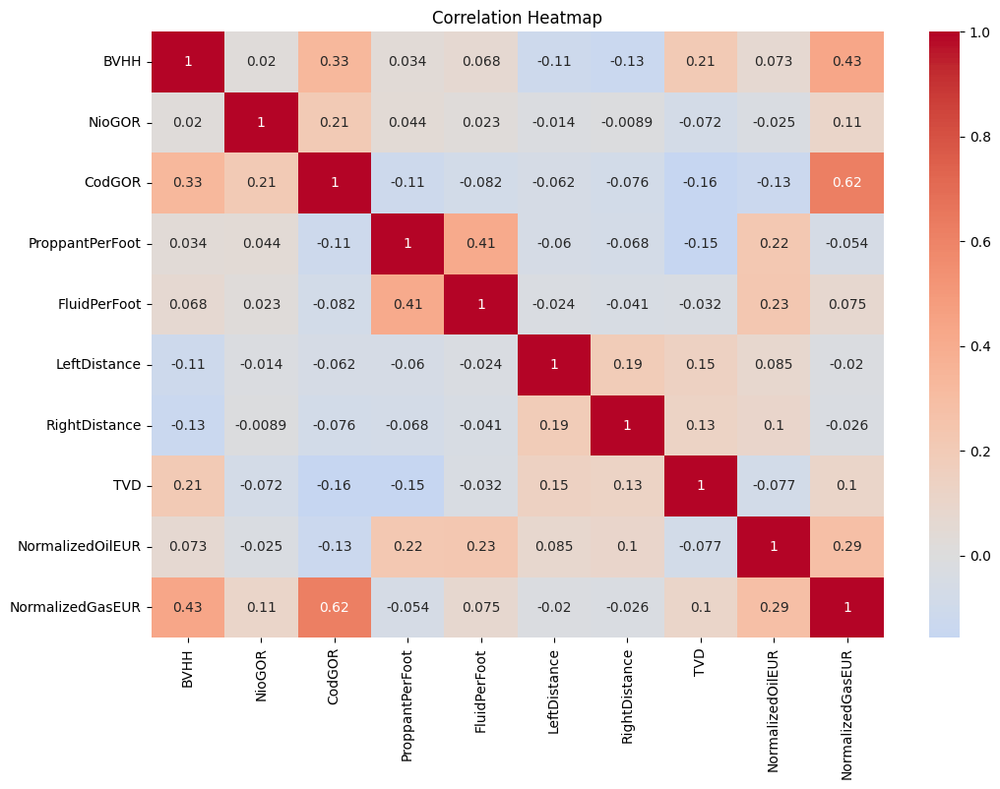

In [8]:


# Only include numeric features + targets
numerical_cols = ['BVHH', 'NioGOR', 'CodGOR', 'ProppantPerFoot', 'FluidPerFoot', 'LeftDistance', 'RightDistance', 'TVD', 'NormalizedOilEUR', 'NormalizedGasEUR']

# Compute correlation matrix
corr = df[numerical_cols].corr()

# Plot
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap')
plt.show()



In [9]:
print("\nHighest positive correlations with NormalizedOilEUR:")
print(corr['NormalizedOilEUR'].sort_values(ascending=False).drop('NormalizedOilEUR').head())

print("\nHighest negative correlations with NormalizedOilEUR:")
print(corr['NormalizedOilEUR'].sort_values(ascending=True).drop('NormalizedOilEUR').head())

print("\nHighest positive correlations with NormalizedGasEUR:")
print(corr['NormalizedGasEUR'].sort_values(ascending=False).drop('NormalizedGasEUR').head())

print("\nHighest negative correlations with NormalizedGasEUR:")
print(corr['NormalizedGasEUR'].sort_values(ascending=True).drop('NormalizedGasEUR').head())


Highest positive correlations with NormalizedOilEUR:
NormalizedGasEUR    0.290420
FluidPerFoot        0.228955
ProppantPerFoot     0.222627
RightDistance       0.100550
LeftDistance        0.084655
Name: NormalizedOilEUR, dtype: float64

Highest negative correlations with NormalizedOilEUR:
CodGOR         -0.128475
TVD            -0.076767
NioGOR         -0.025234
BVHH            0.073222
LeftDistance    0.084655
Name: NormalizedOilEUR, dtype: float64

Highest positive correlations with NormalizedGasEUR:
CodGOR              0.617170
BVHH                0.433283
NormalizedOilEUR    0.290420
NioGOR              0.107971
TVD                 0.104880
Name: NormalizedGasEUR, dtype: float64

Highest negative correlations with NormalizedGasEUR:
ProppantPerFoot   -0.054080
RightDistance     -0.025718
LeftDistance      -0.019613
FluidPerFoot       0.075338
TVD                0.104880
Name: NormalizedGasEUR, dtype: float64


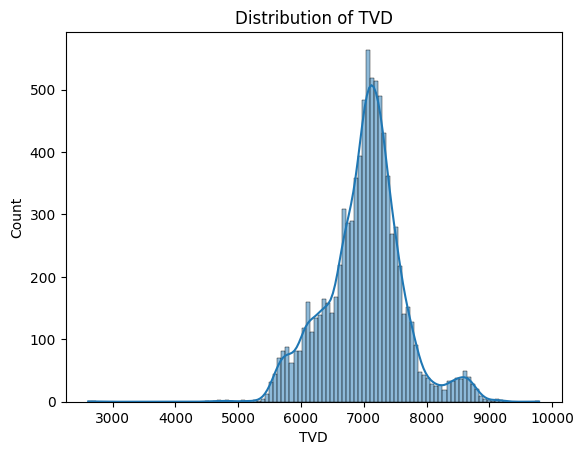

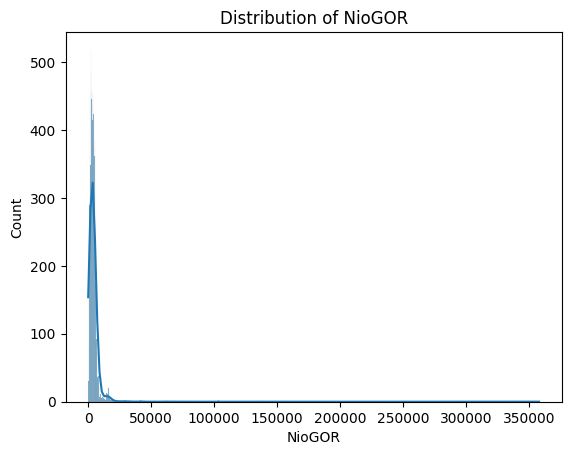

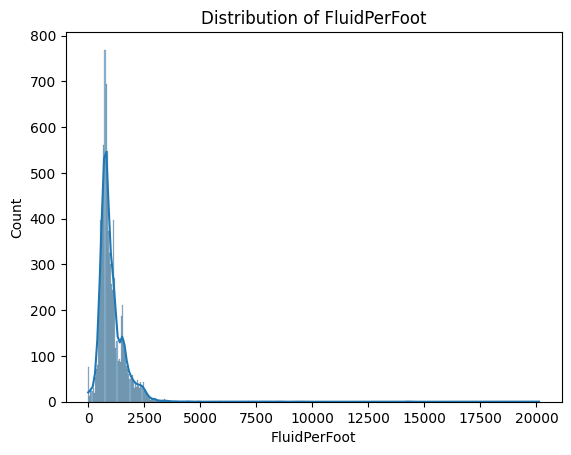

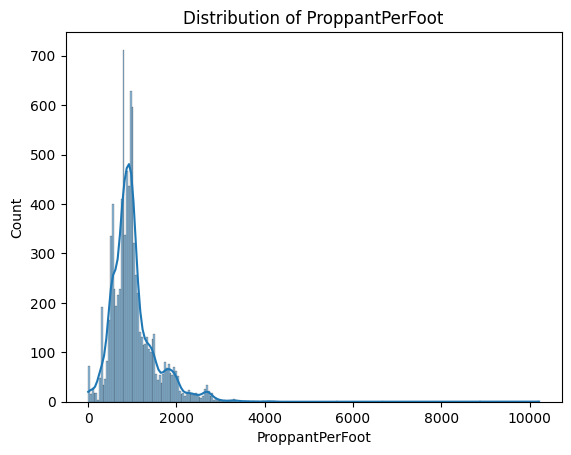

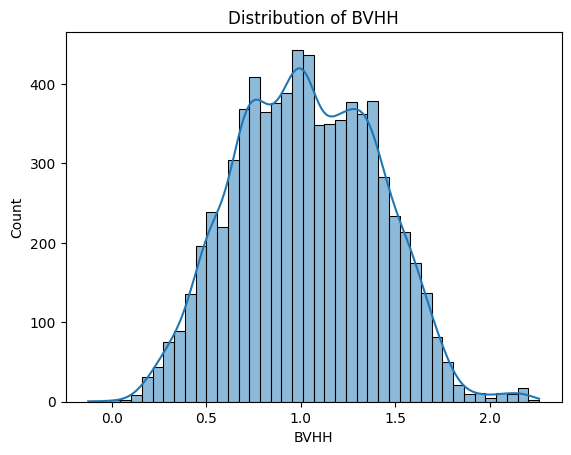

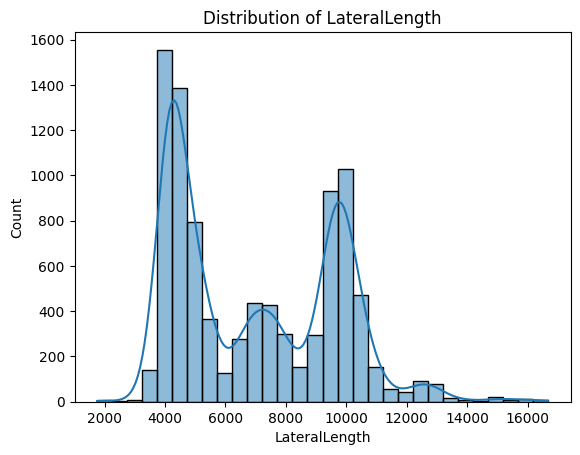

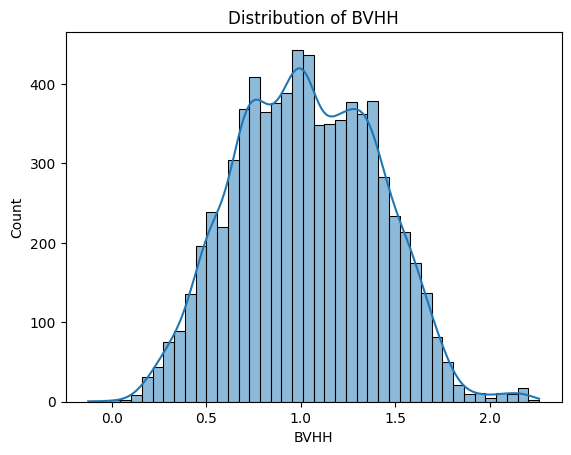

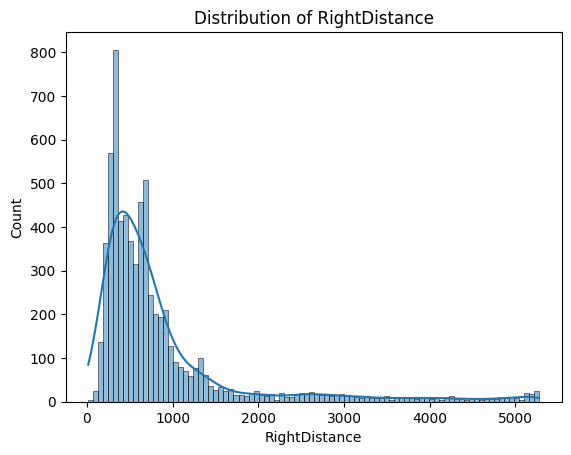

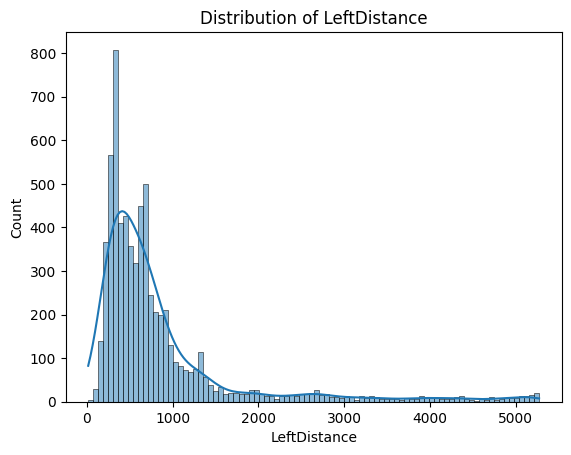

In [10]:
for col in ['TVD', 'NioGOR', 'FluidPerFoot', 'ProppantPerFoot', 'BVHH' , 'LateralLength' , 'BVHH' , 'RightDistance' , 'LeftDistance']:
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()

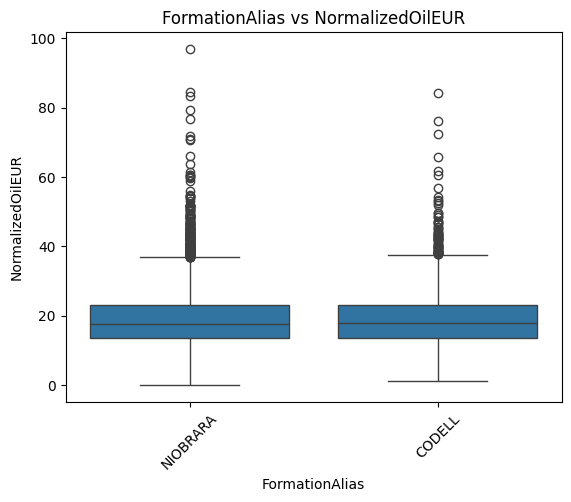

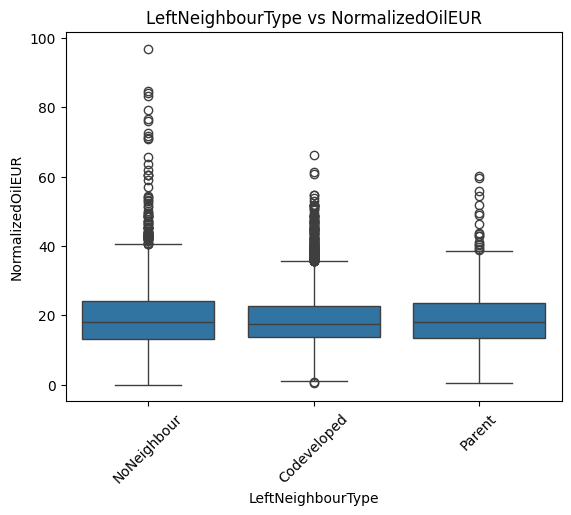

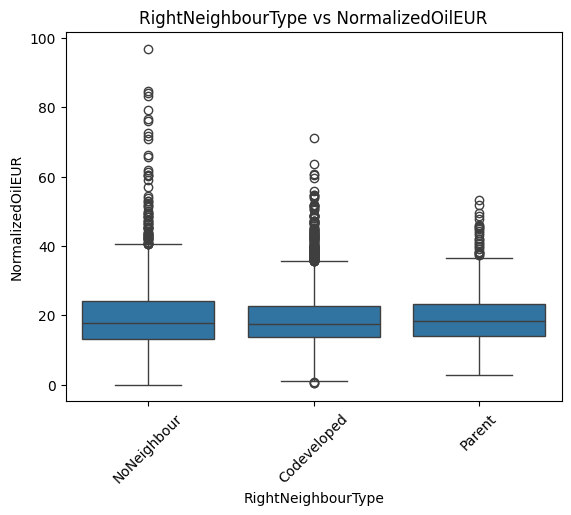

In [11]:
cat_cols = ['FormationAlias', 'LeftNeighbourType', 'RightNeighbourType']
for col in cat_cols:
    sns.boxplot(data=df, x=col, y='NormalizedOilEUR')
    plt.title(f'{col} vs NormalizedOilEUR')
    plt.xticks(rotation=45)
    plt.show()

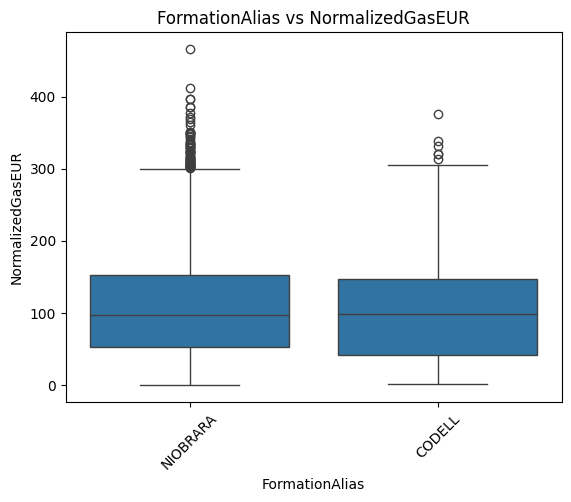

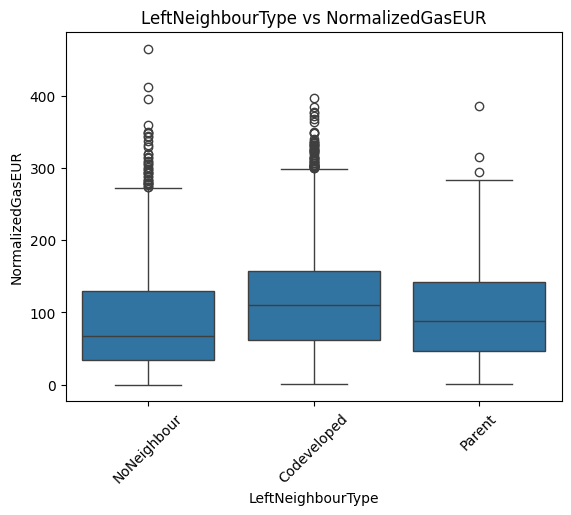

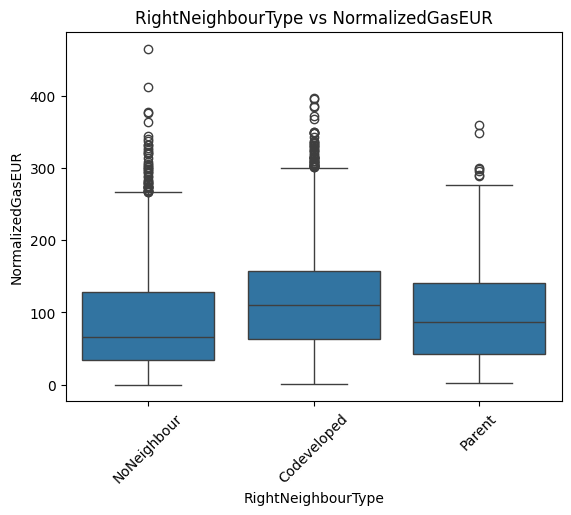

In [12]:
cat_cols = ['FormationAlias', 'LeftNeighbourType', 'RightNeighbourType']
for col in cat_cols:
    sns.boxplot(data=df, x=col, y='NormalizedGasEUR')
    plt.title(f'{col} vs NormalizedGasEUR')
    plt.xticks(rotation=45)
    plt.show()

In [13]:
# random forest
# knowing the importance of each feature initially
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

target = 'NormalizedOilEUR'
features = ['BVHH', 'NioGOR', 'CodGOR', 'ProppantPerFoot', 'FluidPerFoot', 'LeftDistance', 'RightDistance', 'TVD']
df_model = df[features + [target]].dropna(subset=[target])

# Fill remaining missing values with median temporary
imputer = SimpleImputer(strategy='median')
X = imputer.fit_transform(df_model[features])
y = df_model[target]

# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42) # 30%

# Train model
model_oil = RandomForestRegressor(random_state=42)
model_oil.fit(X_train, y_train)

y_pred_oil = model_oil.predict(X_test)

# evaluation metrics
r2_oil = r2_score(y_test, y_pred_oil)
mse_oil = mean_squared_error(y_test, y_pred_oil)
rmse_oil = np.sqrt(mse_oil)
mae_oil = mean_absolute_error(y_test, y_pred_oil)

print("--- Evaluation for NormalizedOilEUR ---")
print(f"R-squared (R²): {r2_oil:.4f}")
print(f"Mean Squared Error (MSE): {mse_oil:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_oil:.4f}")
print(f"Mean Absolute Error (MAE): {mae_oil:.4f}")


#feature importance

importances_oil = model_oil.feature_importances_
importance_df_oil = pd.DataFrame({'Feature': features, 'Importance': importances_oil})
importance_df_oil = importance_df_oil.sort_values(by='Importance', ascending=False)
print("\nImportance due to randomforest for normalized oil:")
print(importance_df_oil)


# ----------------for normalized gas

target2 = 'NormalizedGasEUR'
features = ['BVHH', 'NioGOR', 'CodGOR', 'ProppantPerFoot', 'FluidPerFoot', 'LeftDistance', 'RightDistance', 'TVD']
df_model = df[features + [target2]].dropna(subset=[target2])

imputer = SimpleImputer(strategy='median')
X = imputer.fit_transform(df_model[features])
y = df_model[target2]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42) # 30%

model_gas = RandomForestRegressor(random_state=42)
model_gas.fit(X_train, y_train)

y_pred_gas = model_gas.predict(X_test)

r2_gas = r2_score(y_test, y_pred_gas)
mse_gas = mean_squared_error(y_test, y_pred_gas)
rmse_gas = np.sqrt(mse_gas)
mae_gas = mean_absolute_error(y_test, y_pred_gas)

print("\n--- Evaluation for NormalizedGasEUR ---")
print(f"R-squared (R²): {r2_gas:.4f}")
print(f"Mean Squared Error (MSE): {mse_gas:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse_gas:.4f}")
print(f"Mean Absolute Error (MAE): {mae_gas:.4f}")


importances_gas = model_gas.feature_importances_
importance_df_gas = pd.DataFrame({'Feature': features, 'Importance': importances_gas})
importance_df_gas = importance_df_gas.sort_values(by='Importance', ascending=False)
print("\nImportance due to randomforest for normalized gas:")
print(importance_df_gas)


--- Evaluation for NormalizedOilEUR ---
R-squared (R²): 0.5238
Mean Squared Error (MSE): 31.9321
Root Mean Squared Error (RMSE): 5.6509
Mean Absolute Error (MAE): 3.9620

Importance due to randomforest for normalized oil:
           Feature  Importance
3  ProppantPerFoot    0.171785
1           NioGOR    0.158648
7              TVD    0.157524
4     FluidPerFoot    0.146570
0             BVHH    0.126405
2           CodGOR    0.098821
6    RightDistance    0.072374
5     LeftDistance    0.067872

--- Evaluation for NormalizedGasEUR ---
R-squared (R²): 0.7590
Mean Squared Error (MSE): 1082.5031
Root Mean Squared Error (RMSE): 32.9014
Mean Absolute Error (MAE): 23.2231

Importance due to randomforest for normalized gas:
           Feature  Importance
1           NioGOR    0.524799
2           CodGOR    0.145760
3  ProppantPerFoot    0.074313
4     FluidPerFoot    0.073270
7              TVD    0.064956
0             BVHH    0.055548
6    RightDistance    0.031020
5     LeftDistance    0.

## deal with zeros in prppant per foot

count     8974.000000
mean      1013.557032
std        529.759630
min          0.000000
25%        725.260473
50%        923.412724
75%       1153.233928
max      10217.314930
Name: ProppantPerFoot, dtype: float64
count     8942.000000
mean      1035.336411
std        629.271011
min          0.001171
25%        703.318099
50%        862.066743
75%       1207.024954
max      20117.640690
Name: FluidPerFoot, dtype: float64


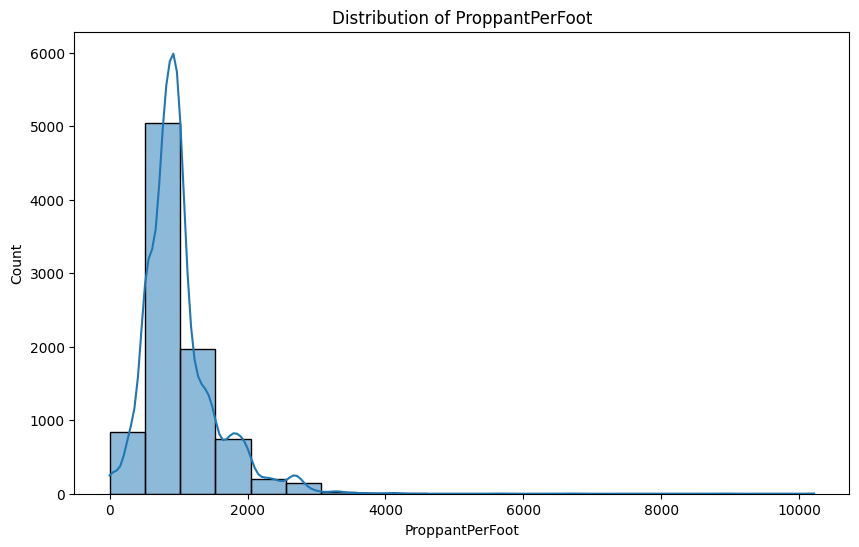

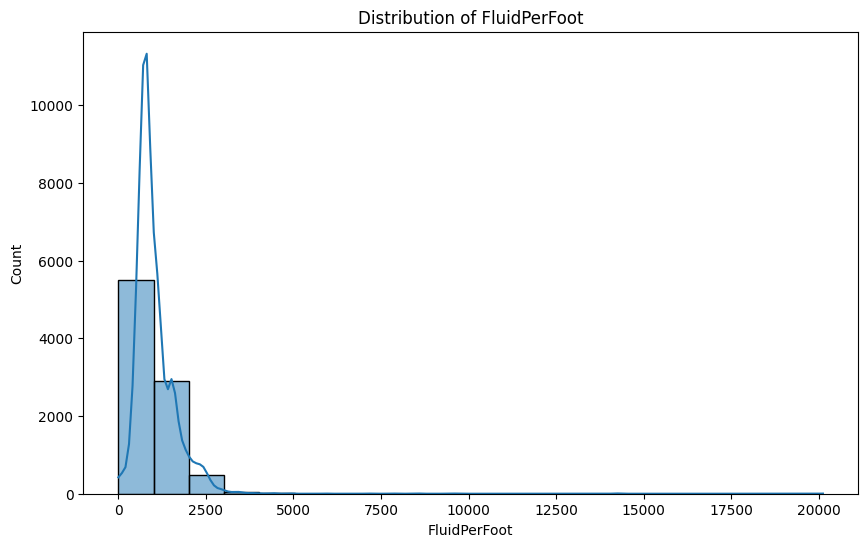

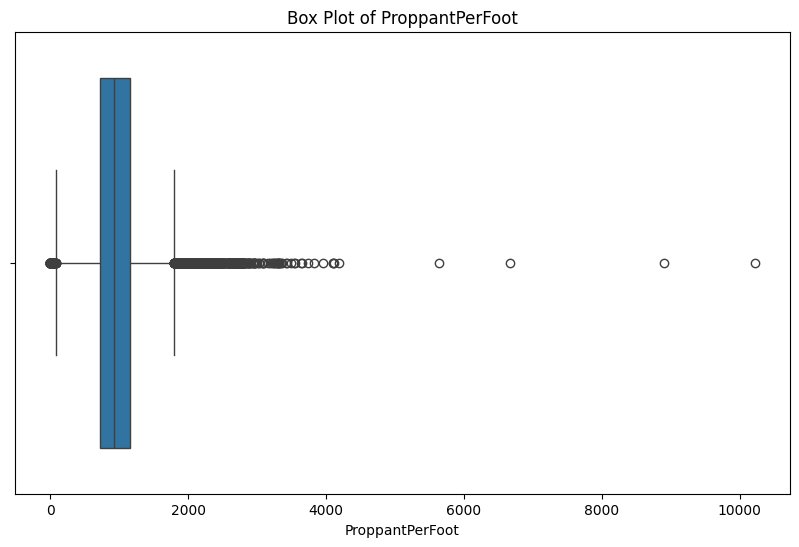

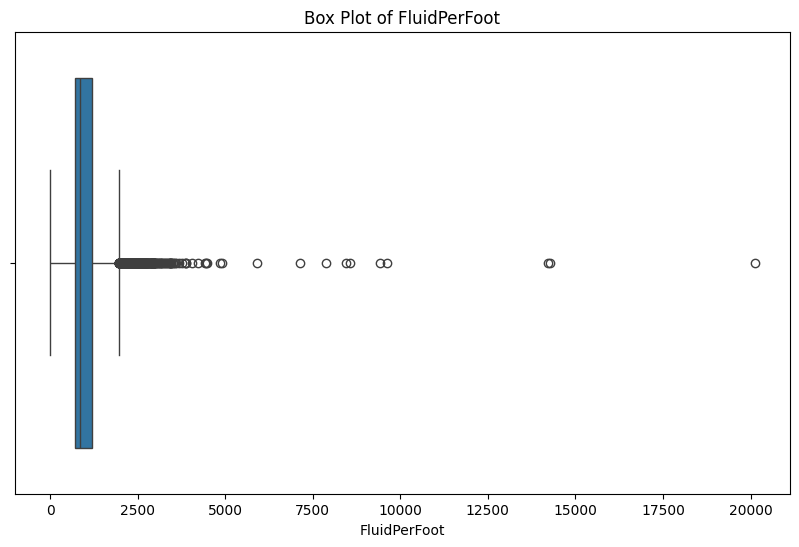

In [14]:

print(df['ProppantPerFoot'].describe())
print(df['FluidPerFoot'].describe())

# plots
plt.figure(figsize=(10, 6))
sns.histplot(df['ProppantPerFoot'], bins=20, kde=True)
plt.title('Distribution of ProppantPerFoot')
plt.xlabel('ProppantPerFoot')
plt.show()

plt.figure(figsize=(10, 6))
sns.histplot(df['FluidPerFoot'], bins=20, kde=True)
plt.title('Distribution of FluidPerFoot')
plt.xlabel('FluidPerFoot')
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(x=df['ProppantPerFoot'])
plt.title('Box Plot of ProppantPerFoot')
plt.xlabel('ProppantPerFoot')
plt.show()

# Box plot for FluidPerFoot
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['FluidPerFoot'])
plt.title('Box Plot of FluidPerFoot')
plt.xlabel('FluidPerFoot')
plt.show()



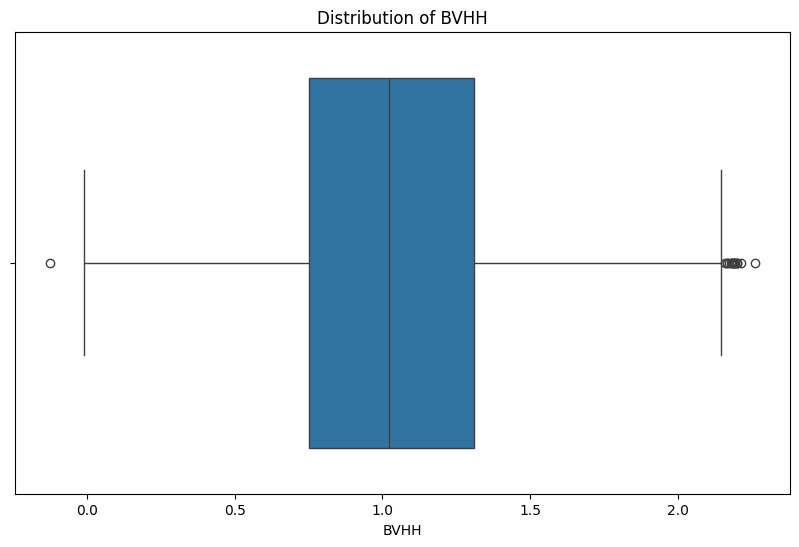

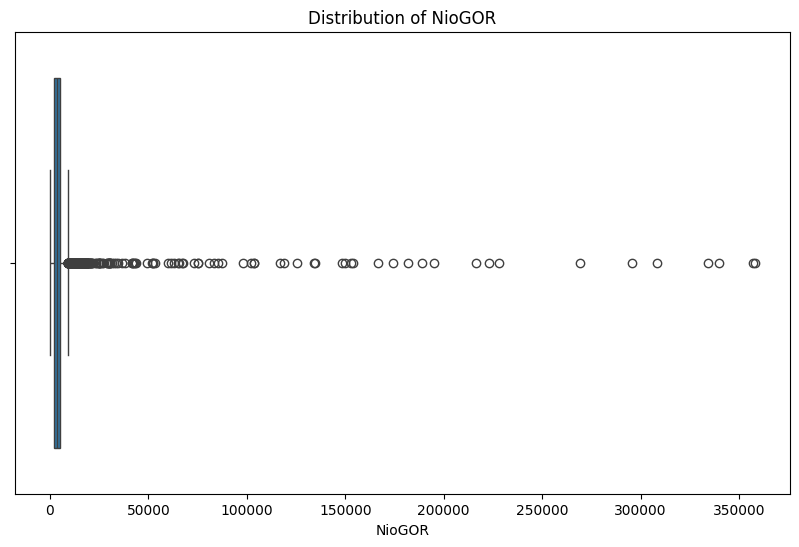

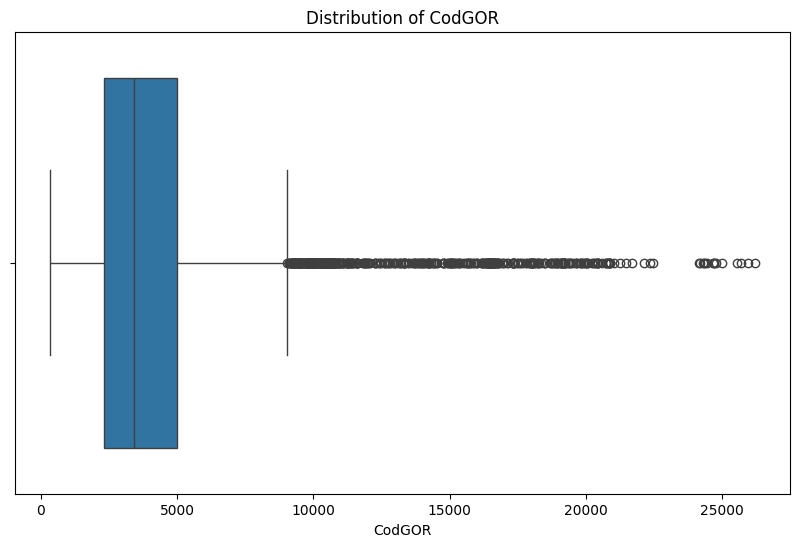

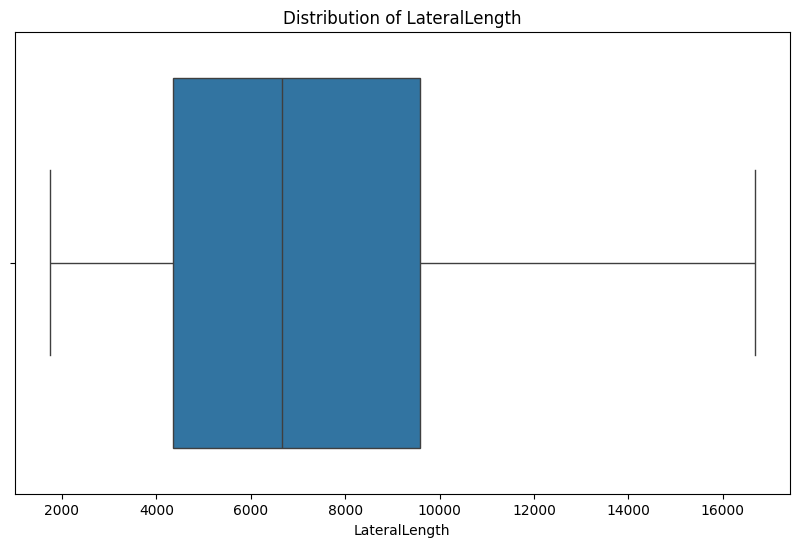

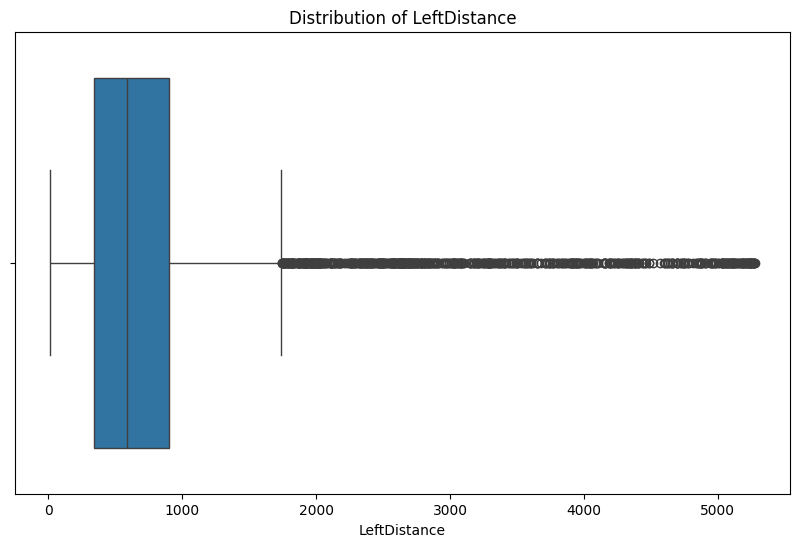

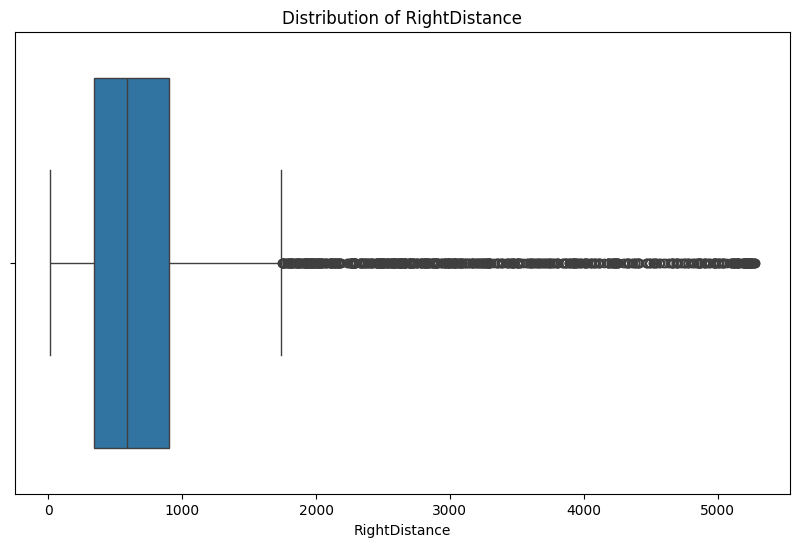

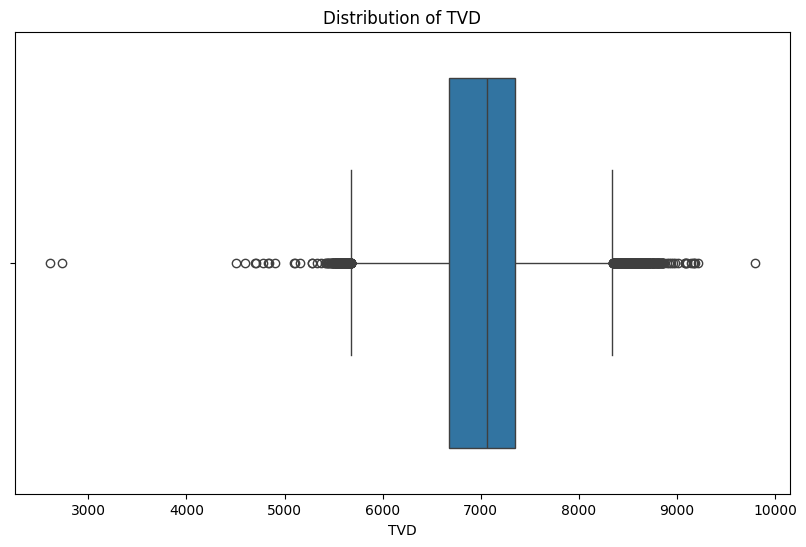

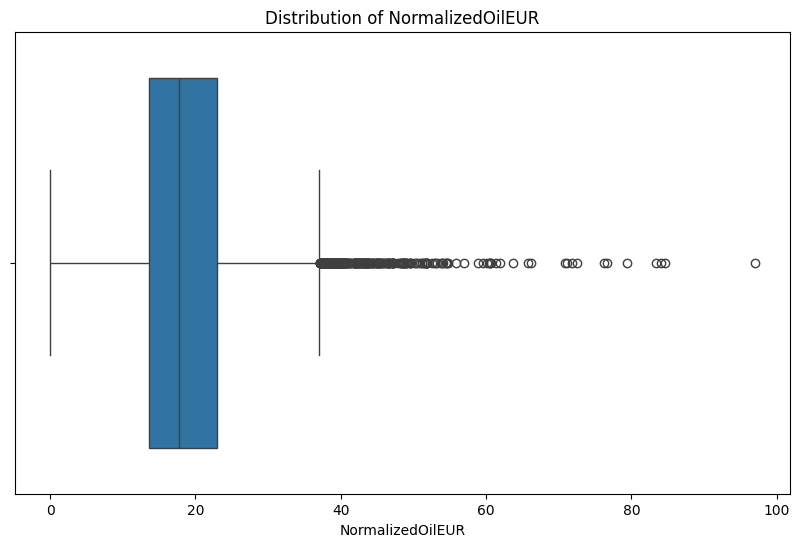

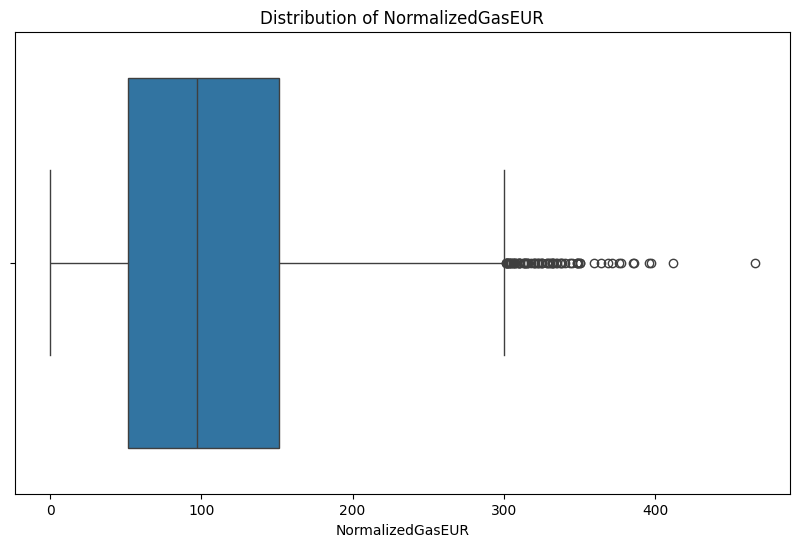

In [15]:
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

cols_to_exclude = ['ProppantPerFoot', 'FluidPerFoot', 'ProppantPerFoot_clibbed', 'FluidPerFoot_clibbed', 'WellID']
numerical_cols = [col for col in numerical_cols if col not in cols_to_exclude]


for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=df[col])
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    # plt.ylabel('Frequency')
    plt.show()


# outliers in BVHH , TVD  , normalized oil , normalized gas , proppant per foot , fluid per foot

In [16]:
# Flag for missing values
# df['is_missing_proppant'] = df['ProppantPerFoot'].isna().astype(int)
# df['is_missing_fluid'] = df['FluidPerFoot'].isna().astype(int)

# Flag for zero values
df['is_zero_proppant'] = (df['ProppantPerFoot'] == 0.0).astype(int)
# df['is_zero_fluid'] = (df['FluidPerFoot'] == 0.0).astype(int)


# Count zeros and missing values
proppant_zeros = (df['ProppantPerFoot'] == 0.0).sum()
fluid_zeros = (df['FluidPerFoot'] == 0.0).sum()

print(proppant_zeros)
print(fluid_zeros)

42
0


In [17]:
df[df['ProppantPerFoot'] == 0.0]


,WellID,BVHH,FormationAlias,NioGOR,CodGOR,LateralLength,ProppantPerFoot,FluidPerFoot,LeftDistance,LeftNeighbourType,RightDistance,RightNeighbourType,TVD,NormalizedOilEUR,NormalizedGasEUR,is_zero_proppant
478,512332910,0.620725,NIOBRARA,3177.215621,1437.084643,3575.0,0.0,497.244755,NaN,NoNeighbour,NaN,NoNeighbour,6412.0,9.055944,26.368671,1
540,512333433,0.747648,NIOBRARA,3077.142521,2843.281884,3866.0,0.0,505.531816,NaN,NoNeighbour,NaN,NoNeighbour,6396.0,17.772375,87.363425,1
544,512333442,0.948539,NIOBRARA,8465.258083,5031.604760,4160.0,0.0,0.481010,NaN,NoNeighbour,NaN,NoNeighbour,6574.0,17.105288,194.262500,1
597,512333948,1.271226,NIOBRARA,3904.738329,3279.680926,3978.0,0.0,0.869784,1555.0,Codeveloped,1321.0,Codeveloped,6954.0,19.822273,116.389643,1
601,512333952,1.297202,NIOBRARA,3775.533014,3263.362368,4160.0,0.0,0.101202,NaN,NoNeighbour,1555.0,Codeveloped,6941.0,12.390385,70.679087,1
609,512334047,0.902555,CODELL,3866.690555,3405.271151,4355.0,0.0,0.002755,1620.0,Codeveloped,NaN,NoNeighbour,7805.0,35.682434,195.893685,1
610,512334048,0.883255,CODELL,4078.300816,3501.658144,4219.0,0.0,0.017303,NaN,NoNeighbour,1620.0,Codeveloped,7809.0,34.970372,190.278265,1
658,512334449,1.761488,NIOBRARA,5448.416363,8449.204759,4381.0,0.0,0.013239,659.0,Codeveloped,643.0,Codeveloped,7196.0,20.791828,150.863958,1
661,512334453,0.874275,CODELL,5461.304897,8060.420141,4086.0,0.0,0.008076,NaN,NoNeighbour,822.0,Codeveloped,7408.0,12.138277,106.189672,1
662,512334454,1.702183,NIOBRARA,5280.067817,7692.685370,4184.0,0.0,0.015535,NaN,NoNeighbour,791.0,Codeveloped,7214.0,15.555210,81.913480,1


In [18]:
df_zero_proppant = df[df['ProppantPerFoot'] == 0.0]

formation_counts = df_zero_proppant['FormationAlias'].value_counts()
print("Formations with zero proppant:\n", formation_counts)
print(df_zero_proppant['LeftNeighbourType'].value_counts())
print(df_zero_proppant['RightNeighbourType'].value_counts())

print("Mean Oil EUR for zero-proppant wells:", df_zero_proppant['NormalizedOilEUR'].mean())
print("Mean Gas EUR for zero-proppant wells:", df_zero_proppant['NormalizedGasEUR'].mean())
print("Overall Oil EUR:", df['NormalizedOilEUR'].mean())
print("Overall Gas EUR:", df['NormalizedGasEUR'].mean())


Formations with zero proppant:
 FormationAlias
NIOBRARA    37
CODELL       5
Name: count, dtype: int64
LeftNeighbourType
Codeveloped    24
NoNeighbour    18
Name: count, dtype: int64
RightNeighbourType
Codeveloped    25
NoNeighbour    15
Parent          2
Name: count, dtype: int64
Mean Oil EUR for zero-proppant wells: 27.706059496452376
Mean Gas EUR for zero-proppant wells: 117.28540366369047
Overall Oil EUR: 19.033830635067456
Overall Gas EUR: 105.80219201338974


/tmp/ipython-input-19-4127703322.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zero_df['FormationAlias_num'] = zero_df['FormationAlias'].astype('category').cat.codes
/tmp/ipython-input-19-4127703322.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zero_df.loc[X.index, 'Cluster'] = clusters


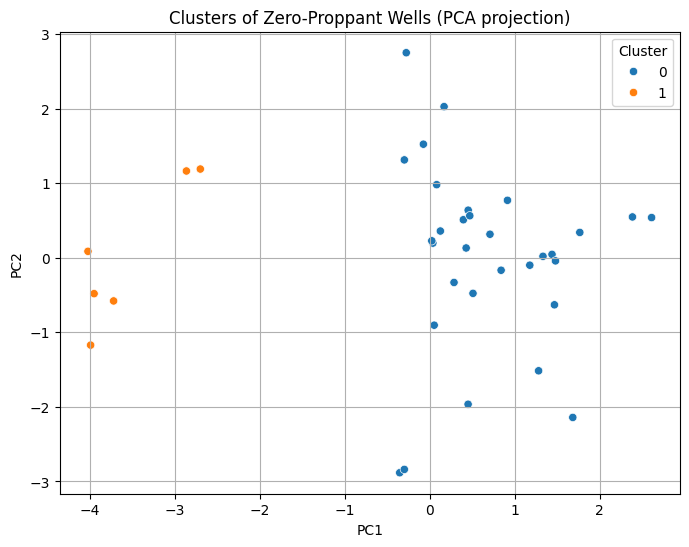

In [19]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Select zero proppant wells
zero_df = df_zero_proppant

zero_df['FormationAlias_num'] = zero_df['FormationAlias'].astype('category').cat.codes

cluster_features = ['TVD', 'NormalizedOilEUR', 'NormalizedGasEUR', 'NioGOR', 'CodGOR', 'FormationAlias_num']
X = zero_df[cluster_features].dropna()

# Scale
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(X_scaled)

zero_df.loc[X.index, 'Cluster'] = clusters

pca = PCA(n_components=2)
pca_proj = pca.fit_transform(X_scaled)

plt.figure(figsize=(8,6))
sns.scatterplot(x=pca_proj[:,0], y=pca_proj[:,1], hue=clusters, palette='tab10')
plt.title('Clusters of Zero-Proppant Wells (PCA projection)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()



In [20]:

df_with_clusters = df.copy()
df_with_clusters['cluster'] = -1
df_with_clusters.loc[df_zero_proppant.index, 'cluster'] = zero_df['Cluster']
df_with_clusters['cluster'] = df_with_clusters['cluster'].astype(str)
grouped = df_with_clusters[df_with_clusters['is_zero_proppant'] == 1].groupby('cluster')[['TVD', 'NormalizedOilEUR', 'FormationAlias', 'CodGOR']].describe()
print(grouped)

          TVD                                                              \
        count         mean          std     min      25%     50%      75%   
cluster                                                                     
0.0      31.0  7203.193548   324.803779  6396.0  7042.50  7228.0  7321.00   
1.0       6.0  7924.000000   158.937724  7618.0  7923.25  7970.5  7996.75   
nan       5.0  6755.800000  1387.854892  5676.0  5713.00  5842.0  8218.00   

                NormalizedOilEUR             ...                       CodGOR  \
            max            count       mean  ...        75%        max  count   
cluster                                      ...                                
0.0      7809.0             31.0  20.870434  ...  26.690704  41.339367   31.0   
1.0      8072.0              6.0  59.206223  ...  81.476019  96.959244    6.0   
nan      8330.0              5.0  32.286743  ...  53.931188  54.771204    0.0   

                                                  

In [21]:
zero_df['is_zero_proppant'] = (zero_df['ProppantPerFoot'] == 0).astype(int)
# Based on clustering
zero_df = zero_df[zero_df['is_zero_proppant'] == 1].copy()
zero_df['cluster'] = -1
zero_df.loc[df_zero_proppant.index, 'cluster'] = zero_df['Cluster']
cluster_counts = zero_df['cluster'].value_counts()

# Get the majority cluster
major_cluster = cluster_counts.idxmax()

# Wells in the majority cluster (trusted)
trusted_zeros = zero_df[zero_df['cluster'] == major_cluster]

# Wells outside (suspicious)
suspicious_zeros = zero_df[zero_df['cluster'] != major_cluster]

print(trusted_zeros.shape)
print(suspicious_zeros.shape)

original_indices_suspicious = suspicious_zeros.index
df.loc[original_indices_suspicious, 'ProppantPerFoot'] = np.nan






(31, 19)
(11, 19)


/tmp/ipython-input-21-1212264306.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zero_df['is_zero_proppant'] = (zero_df['ProppantPerFoot'] == 0).astype(int)


In [22]:
df[df['is_zero_proppant'] == 1]

,WellID,BVHH,FormationAlias,NioGOR,CodGOR,LateralLength,ProppantPerFoot,FluidPerFoot,LeftDistance,LeftNeighbourType,RightDistance,RightNeighbourType,TVD,NormalizedOilEUR,NormalizedGasEUR,is_zero_proppant
478,512332910,0.620725,NIOBRARA,3177.215621,1437.084643,3575.0,0.0,497.244755,NaN,NoNeighbour,NaN,NoNeighbour,6412.0,9.055944,26.368671,1
540,512333433,0.747648,NIOBRARA,3077.142521,2843.281884,3866.0,0.0,505.531816,NaN,NoNeighbour,NaN,NoNeighbour,6396.0,17.772375,87.363425,1
544,512333442,0.948539,NIOBRARA,8465.258083,5031.604760,4160.0,0.0,0.481010,NaN,NoNeighbour,NaN,NoNeighbour,6574.0,17.105288,194.262500,1
597,512333948,1.271226,NIOBRARA,3904.738329,3279.680926,3978.0,0.0,0.869784,1555.0,Codeveloped,1321.0,Codeveloped,6954.0,19.822273,116.389643,1
601,512333952,1.297202,NIOBRARA,3775.533014,3263.362368,4160.0,0.0,0.101202,NaN,NoNeighbour,1555.0,Codeveloped,6941.0,12.390385,70.679087,1
609,512334047,0.902555,CODELL,3866.690555,3405.271151,4355.0,0.0,0.002755,1620.0,Codeveloped,NaN,NoNeighbour,7805.0,35.682434,195.893685,1
610,512334048,0.883255,CODELL,4078.300816,3501.658144,4219.0,0.0,0.017303,NaN,NoNeighbour,1620.0,Codeveloped,7809.0,34.970372,190.278265,1
658,512334449,1.761488,NIOBRARA,5448.416363,8449.204759,4381.0,0.0,0.013239,659.0,Codeveloped,643.0,Codeveloped,7196.0,20.791828,150.863958,1
661,512334453,0.874275,CODELL,5461.304897,8060.420141,4086.0,0.0,0.008076,NaN,NoNeighbour,822.0,Codeveloped,7408.0,12.138277,106.189672,1
662,512334454,1.702183,NIOBRARA,5280.067817,7692.685370,4184.0,0.0,0.015535,NaN,NoNeighbour,791.0,Codeveloped,7214.0,15.555210,81.913480,1


In [23]:
# Count negative numbers in 'NioGOR'
negative_nio_gor_count = df[df['NioGOR'] < 0].shape[0]
print(f"Number of negative values in NioGOR: {negative_nio_gor_count}")

# Count negative numbers in 'CodGOR'
negative_cod_gor_count = df[df['CodGOR'] < 0].shape[0]
print(f"Number of negative values in CodGOR: {negative_cod_gor_count}")

Number of negative values in NioGOR: 0
Number of negative values in CodGOR: 0


## outliers and bad data for numerical values


In [24]:
# outliers in BVHH , TVD  , normalized oil , normalized gas , proppant per foot , fluid per foot


In [25]:
# remove the outlier
df['ProppantPerFoot_clibbed'] = df['ProppantPerFoot'].clip(lower=df['ProppantPerFoot'].quantile(0.004),
                                                    upper=df['ProppantPerFoot'].quantile(0.998))
df['FluidPerFoot_clibbed'] = df['FluidPerFoot'].clip(lower=df['FluidPerFoot'].quantile(0.004),
                                                    upper=df['FluidPerFoot'].quantile(0.998))




In [26]:
df['ProppantPerFoot'].describe()

,ProppantPerFoot
count,8963.000000
mean,1014.800938
std,528.892497
min,0.000000
25%,727.299890
50%,923.920820
75%,1153.514475
max,10217.314930


In [27]:
df['ProppantPerFoot_clibbed'].describe()

,ProppantPerFoot_clibbed
count,8963.000000
mean,1012.174268
std,506.493615
min,1.016444
25%,727.299890
50%,923.920820
75%,1153.514475
max,3365.229475


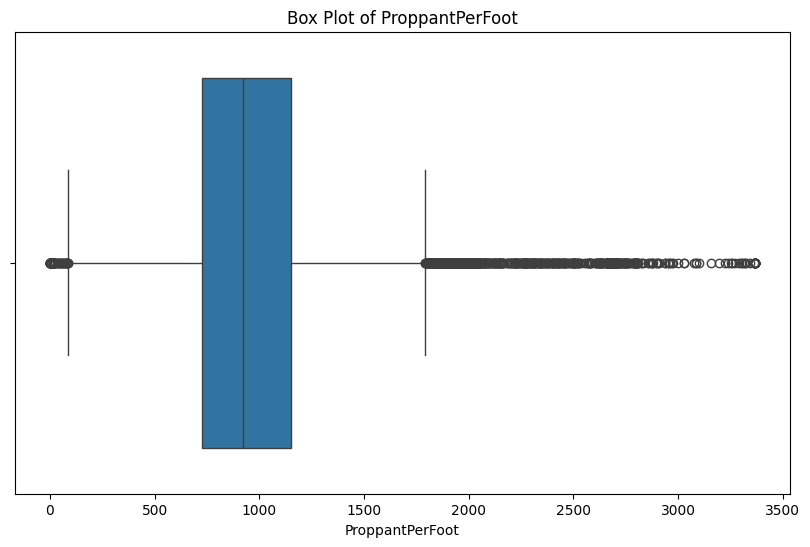

In [28]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['ProppantPerFoot_clibbed'])
plt.title('Box Plot of ProppantPerFoot')
plt.xlabel('ProppantPerFoot')
plt.show()

In [29]:
print(df['FluidPerFoot'].describe())
print(df['FluidPerFoot_clibbed'].describe())


count     8942.000000
mean      1035.336411
std        629.271011
min          0.001171
25%        703.318099
50%        862.066743
75%       1207.024954
max      20117.640690
Name: FluidPerFoot, dtype: float64
count    8942.000000
mean     1027.399972
std       530.542656
min         2.500396
25%       703.318099
50%       862.066743
75%      1207.024954
max      3878.709478
Name: FluidPerFoot_clibbed, dtype: float64


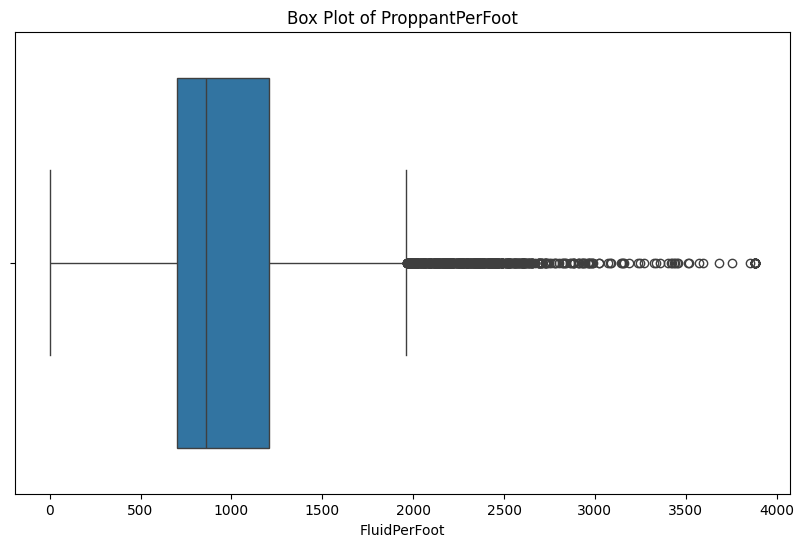

In [30]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['FluidPerFoot_clibbed'])
plt.title('Box Plot of ProppantPerFoot')
plt.xlabel('FluidPerFoot')
plt.show()

In [31]:
# df['TVD_clibbed'] = df['TVD'].clip(lower=df['TVD'].quantile(0.004),
#                                                     upper=df['TVD'].quantile(0.999))

# tvd could have these values up to 9000
# Shallow vertical wells or early exploration wells can have low TVD, especially:
# In older fields or unconventional formations (like shallow gas zones)
# When drilling test wells or pilot wells



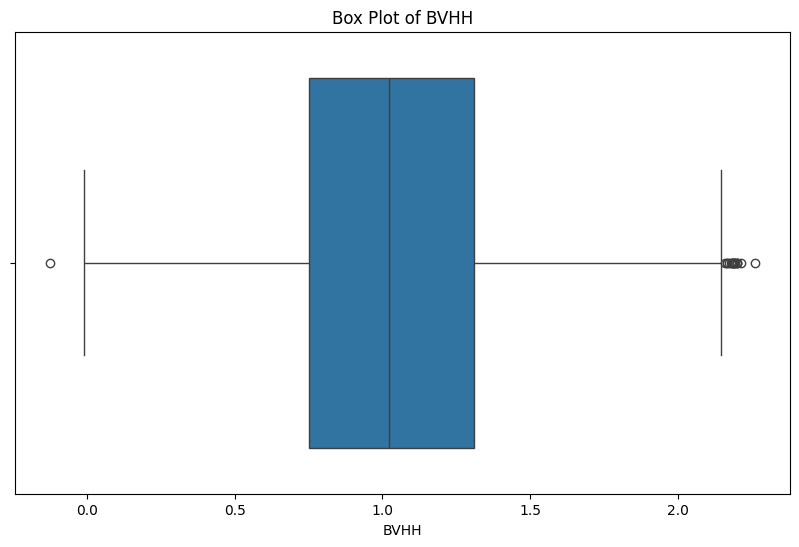

In [32]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['BVHH'])
plt.title('Box Plot of BVHH')
plt.xlabel('BVHH')
plt.show()

In [33]:
df['BVHH'].describe()


,BVHH
count,7565.000000
mean,1.031013
std,0.370794
min,-0.125405
25%,0.750481
50%,1.020468
75%,1.310162
max,2.260032


In [34]:
# to decide what to do either to clib the negative value or drop it
print(df[df['BVHH'] < 0])

          WellID      BVHH FormationAlias     NioGOR      CodGOR  \
448    512332368 -0.125405       NIOBRARA  242.33497  544.608451   
9120  4902125803 -0.009359         CODELL        NaN  431.828840   

      LateralLength  ProppantPerFoot  FluidPerFoot  LeftDistance  \
448          3765.0       445.152722    586.532271           NaN   
9120         9615.0      2124.695164   1091.331669           NaN   

     LeftNeighbourType  RightDistance RightNeighbourType     TVD  \
448        NoNeighbour            NaN        NoNeighbour  7882.0   
9120       NoNeighbour            NaN        NoNeighbour  8464.0   

      NormalizedOilEUR  NormalizedGasEUR  is_zero_proppant  \
448          13.541567          5.958831                 0   
9120         11.829745          8.921997                 0   

      ProppantPerFoot_clibbed  FluidPerFoot_clibbed  
448                445.152722            586.532271  
9120              2124.695164           1091.331669  


In [35]:
#only two rows with also a nan values in left distance so it more safe to drop them as imputing will introduce more noise
df = df[(df['BVHH'] >= 0) | (df['BVHH'].isnull())]
df

,WellID,BVHH,FormationAlias,NioGOR,CodGOR,LateralLength,ProppantPerFoot,FluidPerFoot,LeftDistance,LeftNeighbourType,RightDistance,RightNeighbourType,TVD,NormalizedOilEUR,NormalizedGasEUR,is_zero_proppant,ProppantPerFoot_clibbed,FluidPerFoot_clibbed
0,500109742,1.105028,NIOBRARA,1687.414535,NaN,8084.0,1256.308758,1234.370856,NaN,NoNeighbour,NaN,NoNeighbour,7501.0,15.234785,37.674048,0,1256.308758,1234.370856
1,500109753,0.644480,NIOBRARA,2267.667384,NaN,3912.0,742.842536,784.000000,NaN,NoNeighbour,1330.0,Codeveloped,7551.0,5.327198,11.627301,0,742.842536,784.000000
2,500109754,0.620268,NIOBRARA,2368.236087,NaN,4137.0,912.738700,1127.047136,1330.0,Codeveloped,NaN,NoNeighbour,7594.0,5.629925,14.544356,0,912.738700,1127.047136
3,500109760,0.649670,NIOBRARA,333.876618,NaN,4161.0,914.683970,691.026676,NaN,NoNeighbour,NaN,NoNeighbour,7391.0,8.240087,7.012257,0,914.683970,691.026676
4,500109772,1.423475,NIOBRARA,3608.065949,3199.962930,4418.0,747.271843,928.239928,NaN,NoNeighbour,NaN,NoNeighbour,7838.0,15.374830,51.169534,0,747.271843,928.239928
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9201,4902129125,NaN,CODELL,1190.578936,949.853322,8583.0,1393.493883,2462.864733,1325.0,Codeveloped,NaN,NoNeighbour,8613.0,18.513690,15.231737,0,1393.493883,2462.864733
9202,4902129224,NaN,CODELL,NaN,397.429199,9882.0,2758.550901,1364.672738,NaN,NoNeighbour,NaN,NoNeighbour,7631.0,33.791844,12.357013,0,2758.550901,1364.672738
9203,4902129225,NaN,CODELL,NaN,336.475960,9581.0,2531.677278,1290.361340,NaN,NoNeighbour,NaN,NoNeighbour,7592.0,27.725394,14.413422,0,2531.677278,1290.361340
9204,4902129416,NaN,CODELL,NaN,519.208816,9768.0,1536.333026,1992.940418,NaN,NoNeighbour,NaN,NoNeighbour,7783.0,36.654894,35.377252,0,1536.333026,1992.940418


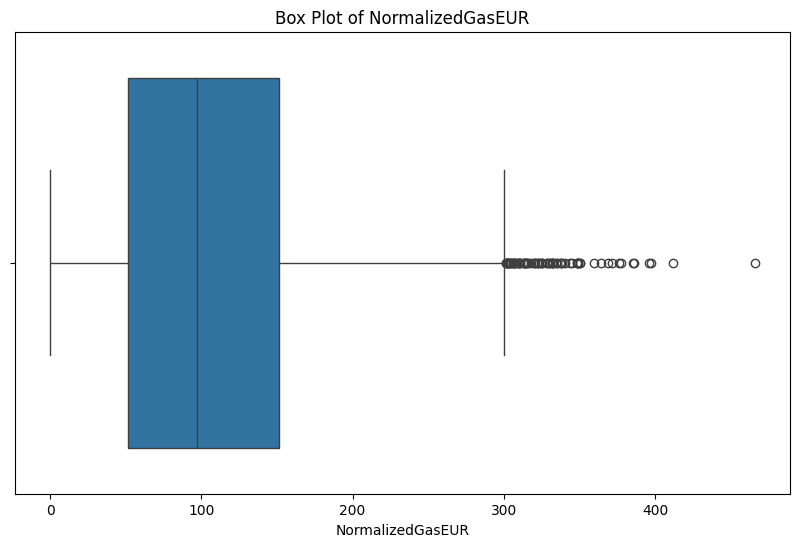

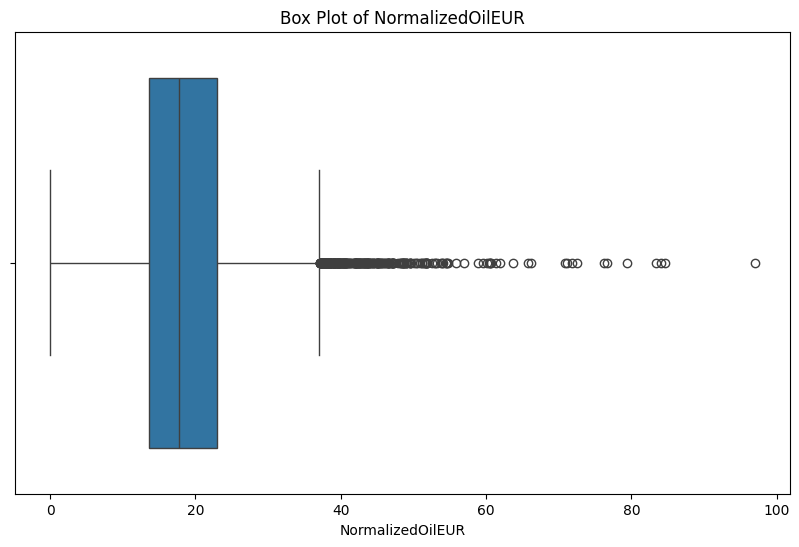

In [36]:
# for normalized gas and normalized oil
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['NormalizedGasEUR'])
plt.title('Box Plot of NormalizedGasEUR')
plt.xlabel('NormalizedGasEUR')
plt.show()

plt.figure(figsize=(10, 6))
sns.boxplot(x=df['NormalizedOilEUR'])
plt.title('Box Plot of NormalizedOilEUR')
plt.xlabel('NormalizedOilEUR')
plt.show()

In [37]:
print(df[df['NormalizedOilEUR'] > 95] )

          WellID      BVHH FormationAlias      NioGOR      CodGOR  \
8782  4902120451  0.202013       NIOBRARA  366.062911  681.767412   

      LateralLength  ProppantPerFoot  FluidPerFoot  LeftDistance  \
8782         3386.0              NaN           NaN           NaN   

     LeftNeighbourType  RightDistance RightNeighbourType     TVD  \
8782       NoNeighbour            NaN        NoNeighbour  8000.0   

      NormalizedOilEUR  NormalizedGasEUR  is_zero_proppant  \
8782         96.959244        120.660071                 1   

      ProppantPerFoot_clibbed  FluidPerFoot_clibbed  
8782                      NaN                   NaN  


In [38]:
# from scipy.stats import boxcox
# from scipy.special import inv_boxcox

# import matplotlib.pyplot as plt
# import seaborn as sns
# import numpy as np

# data = df['FluidPerFoot'].dropna()
# transformed_data, fitted_lambda = boxcox(data)

# print("Best lambda:", fitted_lambda)

# # Visualize the result
# original_value = inv_boxcox(transformed_data, fitted_lambda)
# sns.histplot(original_value, kde=True)


# plt.title("FluidPerFoot after Box-Cox Transformation")
# plt.show()

In [39]:
# check for dublicates in the wells
# Check for duplicate values in the 'id' column
duplicate_ids = df['WellID'].duplicated()

num_duplicate_ids = duplicate_ids.sum()
print(num_duplicate_ids)

0


## outliers and bad data for categorical values

In [40]:
df

,WellID,BVHH,FormationAlias,NioGOR,CodGOR,LateralLength,ProppantPerFoot,FluidPerFoot,LeftDistance,LeftNeighbourType,RightDistance,RightNeighbourType,TVD,NormalizedOilEUR,NormalizedGasEUR,is_zero_proppant,ProppantPerFoot_clibbed,FluidPerFoot_clibbed
0,500109742,1.105028,NIOBRARA,1687.414535,NaN,8084.0,1256.308758,1234.370856,NaN,NoNeighbour,NaN,NoNeighbour,7501.0,15.234785,37.674048,0,1256.308758,1234.370856
1,500109753,0.644480,NIOBRARA,2267.667384,NaN,3912.0,742.842536,784.000000,NaN,NoNeighbour,1330.0,Codeveloped,7551.0,5.327198,11.627301,0,742.842536,784.000000
2,500109754,0.620268,NIOBRARA,2368.236087,NaN,4137.0,912.738700,1127.047136,1330.0,Codeveloped,NaN,NoNeighbour,7594.0,5.629925,14.544356,0,912.738700,1127.047136
3,500109760,0.649670,NIOBRARA,333.876618,NaN,4161.0,914.683970,691.026676,NaN,NoNeighbour,NaN,NoNeighbour,7391.0,8.240087,7.012257,0,914.683970,691.026676
4,500109772,1.423475,NIOBRARA,3608.065949,3199.962930,4418.0,747.271843,928.239928,NaN,NoNeighbour,NaN,NoNeighbour,7838.0,15.374830,51.169534,0,747.271843,928.239928
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9201,4902129125,NaN,CODELL,1190.578936,949.853322,8583.0,1393.493883,2462.864733,1325.0,Codeveloped,NaN,NoNeighbour,8613.0,18.513690,15.231737,0,1393.493883,2462.864733
9202,4902129224,NaN,CODELL,NaN,397.429199,9882.0,2758.550901,1364.672738,NaN,NoNeighbour,NaN,NoNeighbour,7631.0,33.791844,12.357013,0,2758.550901,1364.672738
9203,4902129225,NaN,CODELL,NaN,336.475960,9581.0,2531.677278,1290.361340,NaN,NoNeighbour,NaN,NoNeighbour,7592.0,27.725394,14.413422,0,2531.677278,1290.361340
9204,4902129416,NaN,CODELL,NaN,519.208816,9768.0,1536.333026,1992.940418,NaN,NoNeighbour,NaN,NoNeighbour,7783.0,36.654894,35.377252,0,1536.333026,1992.940418


In [41]:
#categorical values : FormationAlias  , leftNeighbourType , RightNeighbourType
print(df['FormationAlias'].describe())
print(df['FormationAlias'].value_counts())

#NOTE niobrara is more than double the codell




count         9204
unique           2
top       NIOBRARA
freq          6916
Name: FormationAlias, dtype: object
FormationAlias
NIOBRARA    6916
CODELL      2288
Name: count, dtype: int64


In [42]:
print(df['LeftNeighbourType'].describe())
print(df['LeftNeighbourType'].value_counts())
# Codeveloped    6046
# NoNeighbour    2448
# Parent          712



count            9204
unique              3
top       Codeveloped
freq             6046
Name: LeftNeighbourType, dtype: object
LeftNeighbourType
Codeveloped    6046
NoNeighbour    2446
Parent          712
Name: count, dtype: int64


In [43]:
print(df['RightNeighbourType'].describe())
print(df['RightNeighbourType'].value_counts())

# the same ration as leftneighbour

count            9204
unique              3
top       Codeveloped
freq             6055
Name: RightNeighbourType, dtype: object
RightNeighbourType
Codeveloped    6055
NoNeighbour    2426
Parent          723
Name: count, dtype: int64


## deal with missing data


In [44]:
# get the missings
missing_values = df.isnull().sum()
print(missing_values)
missing_percentage = (missing_values / len(df)) * 100
print(missing_percentage.sort_values(ascending=True))

# importance of these features

# linear correlations
# Highest positive correlations with NormalizedOilEUR:
# NormalizedGasEUR    0.290420
# FluidPerFoot        0.228955
# ProppantPerFoot     0.222627


# Highest positive correlations with NormalizedGasEUR:
# CodGOR              0.617170
# BVHH                0.433283
# NormalizedOilEUR    0.290420

# non linearity with randomforest
# Importance due to randomforest for normalized oil:
#            Feature  Importance
# 3  ProppantPerFoot    0.171785
# 1           NioGOR    0.158648
# 7              TVD    0.157524
# 4     FluidPerFoot    0.146570
# 0             BVHH    0.126405
# 2           CodGOR    0.098821
# 6    RightDistance    0.072374
# 5     LeftDistance    0.067872


# Importance due to randomforest for normalized gas:
#            Feature  Importance
# 1           NioGOR    0.524799
# 2           CodGOR    0.145760
# 3  ProppantPerFoot    0.074313
# 4     FluidPerFoot    0.073270
# 7              TVD    0.064956
# 0             BVHH    0.055548
# 6    RightDistance    0.031020
# 5     LeftDistance    0.030333

# so proppant per foot and fluid per foot is very important specially for normalized oil







WellID                        0
BVHH                       1641
FormationAlias                0
NioGOR                      496
CodGOR                     1668
LateralLength                 0
ProppantPerFoot             243
FluidPerFoot                264
LeftDistance               2446
LeftNeighbourType             0
RightDistance              2426
RightNeighbourType            0
TVD                         313
NormalizedOilEUR              0
NormalizedGasEUR              0
is_zero_proppant              0
ProppantPerFoot_clibbed     243
FluidPerFoot_clibbed        264
dtype: int64
WellID                      0.000000
FormationAlias              0.000000
LateralLength               0.000000
is_zero_proppant            0.000000
NormalizedOilEUR            0.000000
NormalizedGasEUR            0.000000
RightNeighbourType          0.000000
LeftNeighbourType           0.000000
ProppantPerFoot             2.640156
ProppantPerFoot_clibbed     2.640156
FluidPerFoot_clibbed        2.868318
Flui

<Axes: >

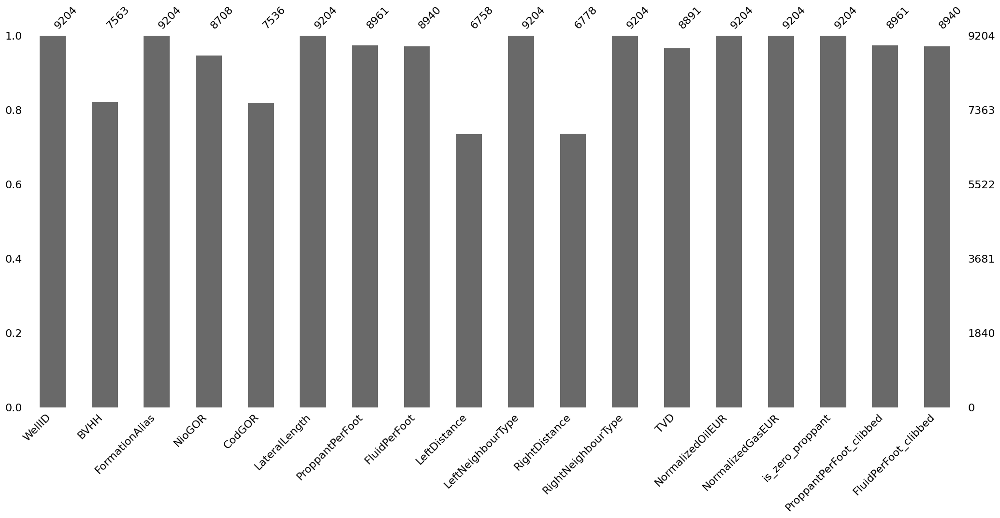

In [45]:
# know the types of missing values
# proppant_per_foot , fluid per foot , tvd , nio gor

import missingno as msno

msno.bar(df)


<Axes: >

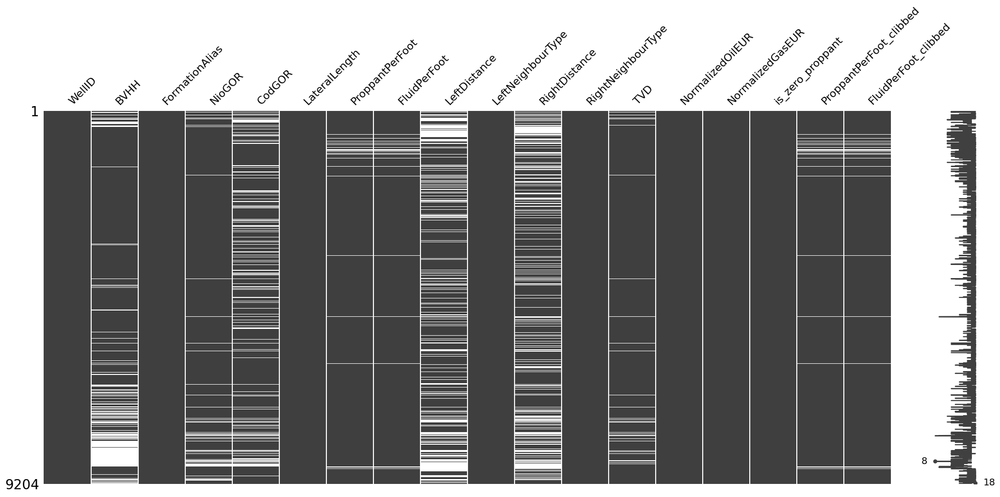

In [46]:
msno.matrix(df)

<Axes: >

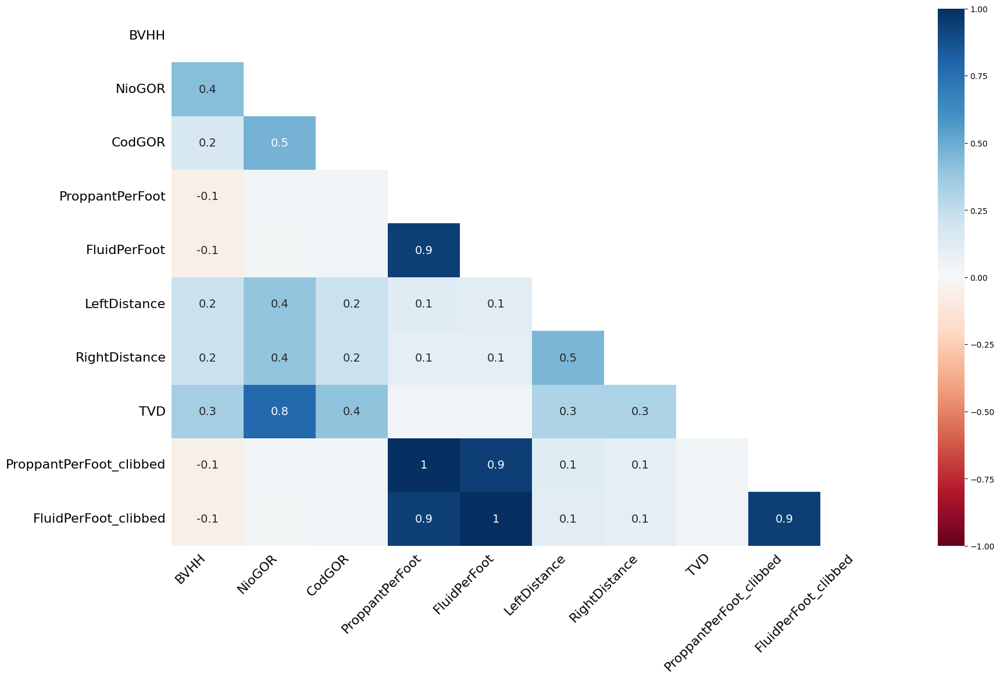

In [47]:
msno.heatmap(df)
# so proppant per foot and fluid per foot are highly correlated (0.9) (MAR), TVD and Nio Gor (0.8) (MAR), right distance and left distance (0.5)


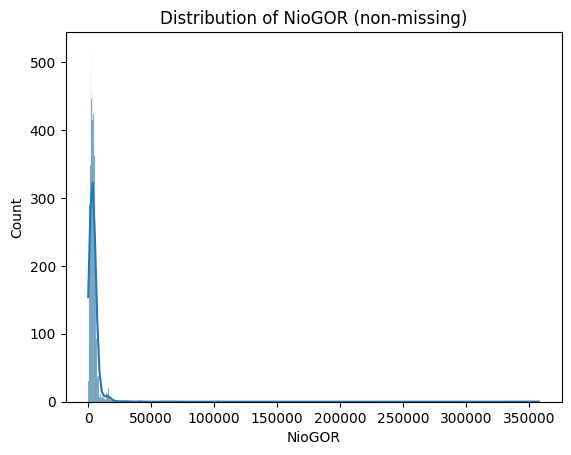

In [48]:
data = df.copy()
sns.histplot(data['NioGOR'].dropna(), kde=True)
plt.title('Distribution of NioGOR (non-missing)')
plt.show()
data['NioGOR_missing'] = data['NioGOR'].isnull().astype(int)




In [49]:
# Check overlap  missingness
both_missing = df[df['FluidPerFoot'].isnull() & df['ProppantPerFoot'].isnull()]
print(f"Rows where both are missing: {len(both_missing)}")




Rows where both are missing: 239


### missing data analysis with categorical data

In [50]:
# analyze missing by formation alias
formation_percentage = (df['FormationAlias'].value_counts())
print(formation_percentage)

missingness_by_formation = df.groupby('FormationAlias')[['NioGOR', 'CodGOR']].apply(lambda x: x.isnull().sum() / len(x) * 100)
print("Percentage of missing values by FormationAlias:")
print(missingness_by_formation)

missingness_p_f_by_formation = df.groupby('FormationAlias')[['ProppantPerFoot', 'FluidPerFoot']].apply(lambda x: x.isnull().sum() / len(x) * 100)
print("Percentage of missing values in proppant and fluid  by FormationAlias:")
print(missingness_p_f_by_formation)

missingness_BVHH_by_formation = df.groupby('FormationAlias')[['BVHH']].apply(lambda x: x.isnull().sum() / len(x) * 100)
print("Percentage of missing values in BVHH by FormationAlias:")
print(missingness_BVHH_by_formation)

missingness_TVD_by_formation = df.groupby('FormationAlias')[['TVD']].apply(lambda x: x.isnull().sum() / len(x) * 100)
print("Percentage of missing values in TVD by FormationAlias:")
print(missingness_TVD_by_formation)

missingness_distances_by_formation = df.groupby('FormationAlias')[['RightDistance' , 'LeftDistance']].apply(lambda x: x.isnull().sum() / len(x) * 100)
print("Percentage of missing values in left and right distance  by FormationAlias:")
print(missingness_distances_by_formation)

# insight : CodGOR  could have a MAR mechanisim with formation alias


FormationAlias
NIOBRARA    6916
CODELL      2288
Name: count, dtype: int64
Percentage of missing values by FormationAlias:
                  NioGOR     CodGOR
FormationAlias                     
CODELL          5.725524   6.250000
NIOBRARA        5.277617  22.050318
Percentage of missing values in proppant and fluid  by FormationAlias:
                ProppantPerFoot  FluidPerFoot
FormationAlias                               
CODELL                 1.267483      1.660839
NIOBRARA               3.094274      3.267785
Percentage of missing values in BVHH by FormationAlias:
                     BVHH
FormationAlias           
CODELL          16.958042
NIOBRARA        18.117409
Percentage of missing values in TVD by FormationAlias:
                     TVD
FormationAlias          
CODELL          2.797203
NIOBRARA        3.600347
Percentage of missing values in left and right distance  by FormationAlias:
                RightDistance  LeftDistance
FormationAlias                             

In [51]:
formation_percentage = (df['RightNeighbourType'].value_counts())
print(formation_percentage)
missingness_by_formation = df.groupby('RightNeighbourType')[['NioGOR', 'CodGOR']].apply(lambda x: x.isnull().sum() / len(x) * 100)
print("Percentage of missing values by RightNeighbourType:")
print(missingness_by_formation)

missingness_p_f_by_formation = df.groupby('RightNeighbourType')[['ProppantPerFoot', 'FluidPerFoot']].apply(lambda x: x.isnull().sum() / len(x) * 100)
print("Percentage of missing values in proppant and fluid  by RightNeighbourType:")
print(missingness_p_f_by_formation)

missingness_BVHH_by_formation = df.groupby('RightNeighbourType')[['BVHH']].apply(lambda x: x.isnull().sum() / len(x) * 100)
print("Percentage of missing values in BVHH by RightNeighbourType:")
print(missingness_BVHH_by_formation)

missingness_TVD_by_formation = df.groupby('RightNeighbourType')[['TVD']].apply(lambda x: x.isnull().sum() / len(x) * 100)
print("Percentage of missing values in TVD by RightNeighbourType:")
print(missingness_TVD_by_formation)

missingness_distances_by_formation = df.groupby('RightNeighbourType')[['RightDistance' , 'LeftDistance']].apply(lambda x: x.isnull().sum() / len(x) * 100)
print("Percentage of missing values in left and right distance  by RightNeighbourType:")
print(missingness_distances_by_formation)

RightNeighbourType
Codeveloped    6055
NoNeighbour    2426
Parent          723
Name: count, dtype: int64
Percentage of missing values by RightNeighbourType:
                       NioGOR     CodGOR
RightNeighbourType                      
Codeveloped          0.049546  12.089182
NoNeighbour         20.197857  32.316570
Parent               0.414938  21.023513
Percentage of missing values in proppant and fluid  by RightNeighbourType:
                    ProppantPerFoot  FluidPerFoot
RightNeighbourType                               
Codeveloped                1.734104      1.915772
NoNeighbour                5.358615      5.688376
Parent                     1.106501      1.383126
Percentage of missing values in BVHH by RightNeighbourType:
                         BVHH
RightNeighbourType           
Codeveloped         12.683732
NoNeighbour         31.904369
Parent              13.692946
Percentage of missing values in TVD by RightNeighbourType:
                          TVD
RightNeighbour

In [52]:
formation_percentage = (df['LeftNeighbourType'].value_counts())
print(formation_percentage)
missingness_by_formation = df.groupby('LeftNeighbourType')[['NioGOR', 'CodGOR']].apply(lambda x: x.isnull().sum() / len(x) * 100)
print("Percentage of missing values by LeftNeighbourType:")
print(missingness_by_formation)

missingness_p_f_by_formation = df.groupby('LeftNeighbourType')[['ProppantPerFoot', 'FluidPerFoot']].apply(lambda x: x.isnull().sum() / len(x) * 100)
print("Percentage of missing values in proppant and fluid  by LeftNeighbourType:")
print(missingness_p_f_by_formation)

missingness_BVHH_by_formation = df.groupby('LeftNeighbourType')[['BVHH']].apply(lambda x: x.isnull().sum() / len(x) * 100)
print("Percentage of missing values in BVHH by LeftNeighbourType:")
print(missingness_BVHH_by_formation)

missingness_TVD_by_formation = df.groupby('LeftNeighbourType')[['TVD']].apply(lambda x: x.isnull().sum() / len(x) * 100)
print("Percentage of missing values in TVD by LeftNeighbourType:")
print(missingness_TVD_by_formation)

missingness_distances_by_formation = df.groupby('LeftNeighbourType')[['RightDistance' , 'LeftDistance']].apply(lambda x: x.isnull().sum() / len(x) * 100)
print("Percentage of missing values in left and right distance  by LeftNeighbourType:")
print(missingness_distances_by_formation)

LeftNeighbourType
Codeveloped    6046
NoNeighbour    2446
Parent          712
Name: count, dtype: int64
Percentage of missing values by LeftNeighbourType:
                      NioGOR     CodGOR
LeftNeighbourType                      
Codeveloped         0.033080  12.189878
NoNeighbour        20.155356  32.338512
Parent              0.140449  19.662921
Percentage of missing values in proppant and fluid  by LeftNeighbourType:
                   ProppantPerFoot  FluidPerFoot
LeftNeighbourType                               
Codeveloped               1.438968      1.653986
NoNeighbour               5.764513      6.050695
Parent                    2.106742      2.247191
Percentage of missing values in BVHH by LeftNeighbourType:
                        BVHH
LeftNeighbourType           
Codeveloped        12.619914
NoNeighbour        32.052330
Parent             13.202247
Percentage of missing values in TVD by LeftNeighbourType:
                         TVD
LeftNeighbourType           
Codeve

/tmp/ipython-input-53-599221786.py:1: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  missing_percent = df.groupby('LeftNeighbourType').apply(lambda g: g.isnull().mean() * 100)


<Figure size 1200x600 with 0 Axes>

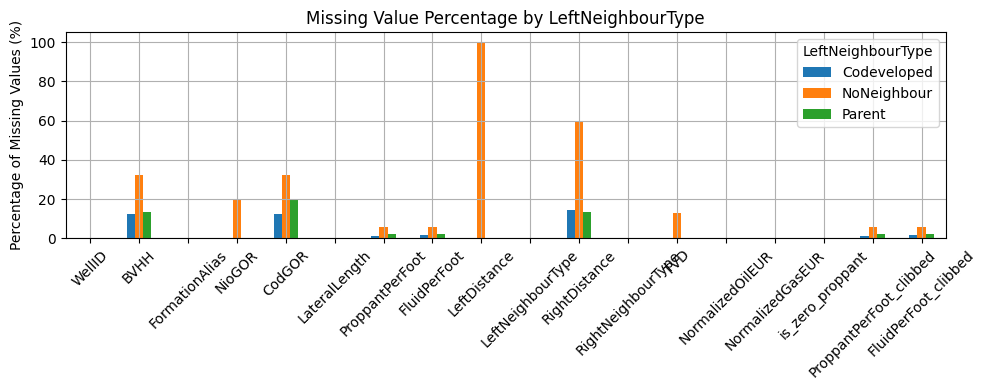

/tmp/ipython-input-53-599221786.py:13: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  missing_percent = df.groupby('RightNeighbourType').apply(lambda g: g.isnull().mean() * 100)


<Figure size 1200x600 with 0 Axes>

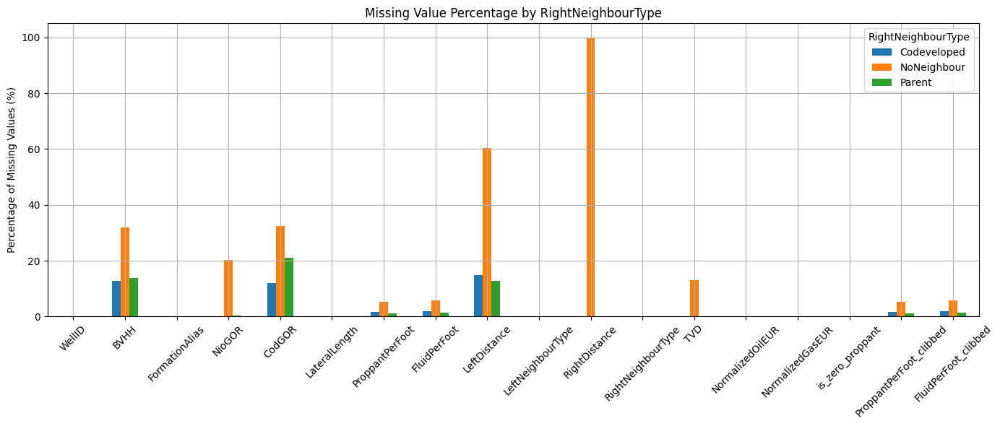

In [53]:
missing_percent = df.groupby('LeftNeighbourType').apply(lambda g: g.isnull().mean() * 100)
# Plotting
plt.figure(figsize=(12, 6))
missing_percent.T.plot(kind='bar', figsize=(10, 4))
plt.ylabel('Percentage of Missing Values (%)')
plt.title('Missing Value Percentage by LeftNeighbourType')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend(title='LeftNeighbourType')
plt.tight_layout()
plt.show()

missing_percent = df.groupby('RightNeighbourType').apply(lambda g: g.isnull().mean() * 100)

# Plotting
plt.figure(figsize=(12, 6))
missing_percent.T.plot(kind='bar', figsize=(14, 6))
plt.ylabel('Percentage of Missing Values (%)')
plt.title('Missing Value Percentage by RightNeighbourType')
plt.xticks(rotation=45)
plt.grid(True)
plt.legend(title='RightNeighbourType')
plt.tight_layout()
plt.show()


In [54]:
print(df[df['LeftDistance'] == 0].shape)
print(df[df['RightDistance'] == 0].shape)
# no rows

(0, 18)
(0, 18)


In [55]:
# fill when there are no neighbor with 0
df['RightDistance_filled'] = df['RightDistance']
df['LeftDistance_filled'] = df['LeftDistance']

df.loc[df['RightNeighbourType'] == 'NoNeighbour', 'RightDistance_filled'] = -1
df.loc[df['LeftNeighbourType'] == 'NoNeighbour', 'LeftDistance_filled'] = -1


# NOTE : inform model for high uncertainty when there is noneighbor as the data collecting in these cases is absent

In [56]:
df

,WellID,BVHH,FormationAlias,NioGOR,CodGOR,LateralLength,ProppantPerFoot,FluidPerFoot,LeftDistance,LeftNeighbourType,RightDistance,RightNeighbourType,TVD,NormalizedOilEUR,NormalizedGasEUR,is_zero_proppant,ProppantPerFoot_clibbed,FluidPerFoot_clibbed,RightDistance_filled,LeftDistance_filled
0,500109742,1.105028,NIOBRARA,1687.414535,NaN,8084.0,1256.308758,1234.370856,NaN,NoNeighbour,NaN,NoNeighbour,7501.0,15.234785,37.674048,0,1256.308758,1234.370856,-1.0,-1.0
1,500109753,0.644480,NIOBRARA,2267.667384,NaN,3912.0,742.842536,784.000000,NaN,NoNeighbour,1330.0,Codeveloped,7551.0,5.327198,11.627301,0,742.842536,784.000000,1330.0,-1.0
2,500109754,0.620268,NIOBRARA,2368.236087,NaN,4137.0,912.738700,1127.047136,1330.0,Codeveloped,NaN,NoNeighbour,7594.0,5.629925,14.544356,0,912.738700,1127.047136,-1.0,1330.0
3,500109760,0.649670,NIOBRARA,333.876618,NaN,4161.0,914.683970,691.026676,NaN,NoNeighbour,NaN,NoNeighbour,7391.0,8.240087,7.012257,0,914.683970,691.026676,-1.0,-1.0
4,500109772,1.423475,NIOBRARA,3608.065949,3199.962930,4418.0,747.271843,928.239928,NaN,NoNeighbour,NaN,NoNeighbour,7838.0,15.374830,51.169534,0,747.271843,928.239928,-1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9201,4902129125,NaN,CODELL,1190.578936,949.853322,8583.0,1393.493883,2462.864733,1325.0,Codeveloped,NaN,NoNeighbour,8613.0,18.513690,15.231737,0,1393.493883,2462.864733,-1.0,1325.0
9202,4902129224,NaN,CODELL,NaN,397.429199,9882.0,2758.550901,1364.672738,NaN,NoNeighbour,NaN,NoNeighbour,7631.0,33.791844,12.357013,0,2758.550901,1364.672738,-1.0,-1.0
9203,4902129225,NaN,CODELL,NaN,336.475960,9581.0,2531.677278,1290.361340,NaN,NoNeighbour,NaN,NoNeighbour,7592.0,27.725394,14.413422,0,2531.677278,1290.361340,-1.0,-1.0
9204,4902129416,NaN,CODELL,NaN,519.208816,9768.0,1536.333026,1992.940418,NaN,NoNeighbour,NaN,NoNeighbour,7783.0,36.654894,35.377252,0,1536.333026,1992.940418,-1.0,-1.0


In [57]:
print("Sum of NaN values in LeftDistance:", df['LeftDistance_filled'].isnull().sum())
print("Sum of NaN values in RightDistance:", df['RightDistance_filled'].isnull().sum())


Sum of NaN values in LeftDistance: 0
Sum of NaN values in RightDistance: 0


In [58]:
# nio and gor

df['TVD_missing_noneighbour'] = df['TVD'].isnull().astype(int)
df['NioGOR_missing_noneighbour'] = df['NioGOR'].isnull().astype(int)
df


,WellID,BVHH,FormationAlias,NioGOR,CodGOR,LateralLength,ProppantPerFoot,FluidPerFoot,LeftDistance,LeftNeighbourType,...,TVD,NormalizedOilEUR,NormalizedGasEUR,is_zero_proppant,ProppantPerFoot_clibbed,FluidPerFoot_clibbed,RightDistance_filled,LeftDistance_filled,TVD_missing_noneighbour,NioGOR_missing_noneighbour
0,500109742,1.105028,NIOBRARA,1687.414535,NaN,8084.0,1256.308758,1234.370856,NaN,NoNeighbour,...,7501.0,15.234785,37.674048,0,1256.308758,1234.370856,-1.0,-1.0,0,0
1,500109753,0.644480,NIOBRARA,2267.667384,NaN,3912.0,742.842536,784.000000,NaN,NoNeighbour,...,7551.0,5.327198,11.627301,0,742.842536,784.000000,1330.0,-1.0,0,0
2,500109754,0.620268,NIOBRARA,2368.236087,NaN,4137.0,912.738700,1127.047136,1330.0,Codeveloped,...,7594.0,5.629925,14.544356,0,912.738700,1127.047136,-1.0,1330.0,0,0
3,500109760,0.649670,NIOBRARA,333.876618,NaN,4161.0,914.683970,691.026676,NaN,NoNeighbour,...,7391.0,8.240087,7.012257,0,914.683970,691.026676,-1.0,-1.0,0,0
4,500109772,1.423475,NIOBRARA,3608.065949,3199.962930,4418.0,747.271843,928.239928,NaN,NoNeighbour,...,7838.0,15.374830,51.169534,0,747.271843,928.239928,-1.0,-1.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9201,4902129125,NaN,CODELL,1190.578936,949.853322,8583.0,1393.493883,2462.864733,1325.0,Codeveloped,...,8613.0,18.513690,15.231737,0,1393.493883,2462.864733,-1.0,1325.0,0,0
9202,4902129224,NaN,CODELL,NaN,397.429199,9882.0,2758.550901,1364.672738,NaN,NoNeighbour,...,7631.0,33.791844,12.357013,0,2758.550901,1364.672738,-1.0,-1.0,0,1
9203,4902129225,NaN,CODELL,NaN,336.475960,9581.0,2531.677278,1290.361340,NaN,NoNeighbour,...,7592.0,27.725394,14.413422,0,2531.677278,1290.361340,-1.0,-1.0,0,1
9204,4902129416,NaN,CODELL,NaN,519.208816,9768.0,1536.333026,1992.940418,NaN,NoNeighbour,...,7783.0,36.654894,35.377252,0,1536.333026,1992.940418,-1.0,-1.0,0,1


In [59]:
df[(df['LeftNeighbourType']=='NoNeighbour') & (df['NioGOR'].notnull())]

,WellID,BVHH,FormationAlias,NioGOR,CodGOR,LateralLength,ProppantPerFoot,FluidPerFoot,LeftDistance,LeftNeighbourType,...,TVD,NormalizedOilEUR,NormalizedGasEUR,is_zero_proppant,ProppantPerFoot_clibbed,FluidPerFoot_clibbed,RightDistance_filled,LeftDistance_filled,TVD_missing_noneighbour,NioGOR_missing_noneighbour
0,500109742,1.105028,NIOBRARA,1687.414535,NaN,8084.0,1256.308758,1234.370856,NaN,NoNeighbour,...,7501.0,15.234785,37.674048,0,1256.308758,1234.370856,-1.0,-1.0,0,0
1,500109753,0.644480,NIOBRARA,2267.667384,NaN,3912.0,742.842536,784.000000,NaN,NoNeighbour,...,7551.0,5.327198,11.627301,0,742.842536,784.000000,1330.0,-1.0,0,0
3,500109760,0.649670,NIOBRARA,333.876618,NaN,4161.0,914.683970,691.026676,NaN,NoNeighbour,...,7391.0,8.240087,7.012257,0,914.683970,691.026676,-1.0,-1.0,0,0
4,500109772,1.423475,NIOBRARA,3608.065949,3199.962930,4418.0,747.271843,928.239928,NaN,NoNeighbour,...,7838.0,15.374830,51.169534,0,747.271843,928.239928,-1.0,-1.0,0,0
5,500109773,1.368585,NIOBRARA,3899.971877,3133.110269,4246.0,709.373528,957.364578,NaN,NoNeighbour,...,7941.0,10.570419,43.056524,0,709.373528,957.364578,601.0,-1.0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9192,4902127626,NaN,NIOBRARA,637.916711,899.328117,9948.0,1062.726176,973.155408,NaN,NoNeighbour,...,8400.0,17.135505,17.081423,0,1062.726176,973.155408,2289.0,-1.0,0,0
9193,4902127768,NaN,CODELL,871.460363,456.216568,9879.0,972.011337,478.572123,NaN,NoNeighbour,...,9099.0,8.346088,6.457030,0,972.011337,478.572123,2593.0,-1.0,0,0
9196,4902127986,NaN,CODELL,648.373740,899.425411,9920.0,890.927419,659.332258,NaN,NoNeighbour,...,8444.0,20.237601,25.180444,0,890.927419,659.332258,1136.0,-1.0,0,0
9197,4902128000,NaN,CODELL,985.081875,361.115135,9940.0,956.712274,478.487324,NaN,NoNeighbour,...,9091.0,8.925755,7.706237,0,956.712274,478.487324,-1.0,-1.0,0,0


In [60]:
from sklearn.ensemble import RandomForestRegressor

# fill the missing in niogor and tvd with conditional imputaion
isolated_complete_mask = (
    ((df['LeftNeighbourType'] == 'NoNeighbour') |
    (df['RightNeighbourType'] == 'NoNeighbour')) &
    df['TVD'].notna() &
    df['NioGOR'].notna()
)
train_isolated = df.loc[isolated_complete_mask].copy()

# Drop rows where the target variable for TVD is missing in the training set
train_isolated_tvd = train_isolated.dropna(subset=['TVD'])
# Drop rows where the target variable for NioGOR is missing in the training set
train_isolated_niogor = train_isolated.dropna(subset=['NioGOR'])

features = ['FormationAlias', 'LateralLength', 'ProppantPerFoot', 'FluidPerFoot']
X_tvd = pd.get_dummies(train_isolated_tvd[features])
y_tvd = train_isolated_tvd['TVD']

X_niogor = pd.get_dummies(train_isolated_niogor[features])
y_niogor = train_isolated_niogor['NioGOR']

model_tvd = RandomForestRegressor(random_state=42)
model_niogor = RandomForestRegressor(random_state=42)

model_tvd.fit(X_tvd, y_tvd)
model_niogor.fit(X_niogor, y_niogor)



RandomForestRegressor(random_state=42)

In [61]:
missing_tvd_mask = (df['TVD'].isna()) & (
    (df['LeftNeighbourType'] == 'NoNeighbour') |
    (df['RightNeighbourType'] == 'NoNeighbour')
)

missing_niogor_mask = (df['NioGOR'].isna()) & (
    (df['LeftNeighbourType'] == 'NoNeighbour') |
    (df['RightNeighbourType'] == 'NoNeighbour')
)

X_tvd_missing = pd.get_dummies(df.loc[missing_tvd_mask, features])
X_niogor_missing = pd.get_dummies(df.loc[missing_niogor_mask, features])

X_tvd_missing = X_tvd_missing.reindex(columns=X_tvd.columns, fill_value=0)
X_niogor_missing = X_niogor_missing.reindex(columns=X_niogor.columns, fill_value=0)

df['TVD_imputed'] = df['TVD']
df['NioGOR_imputed'] = df['NioGOR']

df.loc[missing_tvd_mask, 'TVD_imputed'] = model_tvd.predict(X_tvd_missing)
df.loc[missing_niogor_mask, 'NioGOR_imputed'] = model_niogor.predict(X_niogor_missing)


from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

y_tvd_pred = model_tvd.predict(X_tvd)
print("TVD R² Score:", r2_score(y_tvd, y_tvd_pred))
print("TVD MAE:", mean_absolute_error(y_tvd, y_tvd_pred))
print("TVD RMSE:", np.sqrt(mean_squared_error(y_tvd, y_tvd_pred)))

y_niogor_pred = model_niogor.predict(X_niogor)
print("NioGOR R² Score:", r2_score(y_niogor, y_niogor_pred))
print("NioGOR MAE:", mean_absolute_error(y_niogor, y_niogor_pred))
print("NioGOR RMSE:", np.sqrt(mean_squared_error(y_niogor, y_niogor_pred)))



TVD R² Score: 0.9157219077121861
TVD MAE: 131.0010158866291
TVD RMSE: 187.7029835544208
NioGOR R² Score: 0.867002113584162
NioGOR MAE: 1247.8687261642146
NioGOR RMSE: 4217.123217826852


In [62]:
df

,WellID,BVHH,FormationAlias,NioGOR,CodGOR,LateralLength,ProppantPerFoot,FluidPerFoot,LeftDistance,LeftNeighbourType,...,NormalizedGasEUR,is_zero_proppant,ProppantPerFoot_clibbed,FluidPerFoot_clibbed,RightDistance_filled,LeftDistance_filled,TVD_missing_noneighbour,NioGOR_missing_noneighbour,TVD_imputed,NioGOR_imputed
0,500109742,1.105028,NIOBRARA,1687.414535,NaN,8084.0,1256.308758,1234.370856,NaN,NoNeighbour,...,37.674048,0,1256.308758,1234.370856,-1.0,-1.0,0,0,7501.0,1687.414535
1,500109753,0.644480,NIOBRARA,2267.667384,NaN,3912.0,742.842536,784.000000,NaN,NoNeighbour,...,11.627301,0,742.842536,784.000000,1330.0,-1.0,0,0,7551.0,2267.667384
2,500109754,0.620268,NIOBRARA,2368.236087,NaN,4137.0,912.738700,1127.047136,1330.0,Codeveloped,...,14.544356,0,912.738700,1127.047136,-1.0,1330.0,0,0,7594.0,2368.236087
3,500109760,0.649670,NIOBRARA,333.876618,NaN,4161.0,914.683970,691.026676,NaN,NoNeighbour,...,7.012257,0,914.683970,691.026676,-1.0,-1.0,0,0,7391.0,333.876618
4,500109772,1.423475,NIOBRARA,3608.065949,3199.962930,4418.0,747.271843,928.239928,NaN,NoNeighbour,...,51.169534,0,747.271843,928.239928,-1.0,-1.0,0,0,7838.0,3608.065949
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9201,4902129125,NaN,CODELL,1190.578936,949.853322,8583.0,1393.493883,2462.864733,1325.0,Codeveloped,...,15.231737,0,1393.493883,2462.864733,-1.0,1325.0,0,0,8613.0,1190.578936
9202,4902129224,NaN,CODELL,NaN,397.429199,9882.0,2758.550901,1364.672738,NaN,NoNeighbour,...,12.357013,0,2758.550901,1364.672738,-1.0,-1.0,0,1,7631.0,1439.732332
9203,4902129225,NaN,CODELL,NaN,336.475960,9581.0,2531.677278,1290.361340,NaN,NoNeighbour,...,14.413422,0,2531.677278,1290.361340,-1.0,-1.0,0,1,7592.0,1835.789444
9204,4902129416,NaN,CODELL,NaN,519.208816,9768.0,1536.333026,1992.940418,NaN,NoNeighbour,...,35.377252,0,1536.333026,1992.940418,-1.0,-1.0,0,1,7783.0,2864.722028


In [63]:
print(df[['TVD', 'TVD_imputed', 'NioGOR', 'NioGOR_imputed']].isna().sum())
df[df['NioGOR_imputed'].isna()]


TVD               313
TVD_imputed         0
NioGOR            496
NioGOR_imputed      2
dtype: int64


,WellID,BVHH,FormationAlias,NioGOR,CodGOR,LateralLength,ProppantPerFoot,FluidPerFoot,LeftDistance,LeftNeighbourType,...,NormalizedGasEUR,is_zero_proppant,ProppantPerFoot_clibbed,FluidPerFoot_clibbed,RightDistance_filled,LeftDistance_filled,TVD_missing_noneighbour,NioGOR_missing_noneighbour,TVD_imputed,NioGOR_imputed
4328,512341140,NaN,NIOBRARA,NaN,NaN,12165.0,1007.151665,423.977312,421.0,Codeveloped,...,260.512289,0,1007.151665,423.977312,317.0,421.0,0,1,6939.0,NaN
9134,4902126714,NaN,CODELL,NaN,568.849886,9756.0,1492.011275,850.831181,1767.0,Codeveloped,...,43.930197,0,1492.011275,850.831181,4307.0,1767.0,0,1,7736.0,NaN


In [64]:
# knn to impute the other features

from sklearn.impute import KNNImputer
import pandas as pd


features_for_impute = [
    'FormationAlias', 'LateralLength',
    'TVD_imputed', 'NioGOR_imputed',
    'FluidPerFoot_clibbed', 'ProppantPerFoot_clibbed', 'CodGOR' , 'BVHH'
]


encoded_df = pd.get_dummies(df[features_for_impute], drop_first=True)

knn_imputer = KNNImputer(n_neighbors=5)
imputed_array = knn_imputer.fit_transform(encoded_df)

imputed_df = pd.DataFrame(imputed_array, columns=encoded_df.columns, index=df.index)

df['FluidPerFoot_imputed'] = imputed_df['FluidPerFoot_clibbed']
df['ProppantPerFoot_imputed'] = imputed_df['ProppantPerFoot_clibbed']
df['CodGOR_imputed'] = imputed_df['CodGOR']
df['NioGOR_imputed']     = imputed_df['NioGOR_imputed']
df['BVHH_imputed']     = imputed_df['BVHH']




In [65]:
df

,WellID,BVHH,FormationAlias,NioGOR,CodGOR,LateralLength,ProppantPerFoot,FluidPerFoot,LeftDistance,LeftNeighbourType,...,RightDistance_filled,LeftDistance_filled,TVD_missing_noneighbour,NioGOR_missing_noneighbour,TVD_imputed,NioGOR_imputed,FluidPerFoot_imputed,ProppantPerFoot_imputed,CodGOR_imputed,BVHH_imputed
0,500109742,1.105028,NIOBRARA,1687.414535,NaN,8084.0,1256.308758,1234.370856,NaN,NoNeighbour,...,-1.0,-1.0,0,0,7501.0,1687.414535,1234.370856,1256.308758,1838.686753,1.105028
1,500109753,0.644480,NIOBRARA,2267.667384,NaN,3912.0,742.842536,784.000000,NaN,NoNeighbour,...,1330.0,-1.0,0,0,7551.0,2267.667384,784.000000,742.842536,1728.150821,0.644480
2,500109754,0.620268,NIOBRARA,2368.236087,NaN,4137.0,912.738700,1127.047136,1330.0,Codeveloped,...,-1.0,1330.0,0,0,7594.0,2368.236087,1127.047136,912.738700,2039.668224,0.620268
3,500109760,0.649670,NIOBRARA,333.876618,NaN,4161.0,914.683970,691.026676,NaN,NoNeighbour,...,-1.0,-1.0,0,0,7391.0,333.876618,691.026676,914.683970,666.640507,0.649670
4,500109772,1.423475,NIOBRARA,3608.065949,3199.962930,4418.0,747.271843,928.239928,NaN,NoNeighbour,...,-1.0,-1.0,0,0,7838.0,3608.065949,928.239928,747.271843,3199.962930,1.423475
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9201,4902129125,NaN,CODELL,1190.578936,949.853322,8583.0,1393.493883,2462.864733,1325.0,Codeveloped,...,-1.0,1325.0,0,0,8613.0,1190.578936,2462.864733,1393.493883,949.853322,0.943273
9202,4902129224,NaN,CODELL,NaN,397.429199,9882.0,2758.550901,1364.672738,NaN,NoNeighbour,...,-1.0,-1.0,0,1,7631.0,1439.732332,1364.672738,2758.550901,397.429199,0.629306
9203,4902129225,NaN,CODELL,NaN,336.475960,9581.0,2531.677278,1290.361340,NaN,NoNeighbour,...,-1.0,-1.0,0,1,7592.0,1835.789444,1290.361340,2531.677278,336.475960,0.721965
9204,4902129416,NaN,CODELL,NaN,519.208816,9768.0,1536.333026,1992.940418,NaN,NoNeighbour,...,-1.0,-1.0,0,1,7783.0,2864.722028,1992.940418,1536.333026,519.208816,1.268216


In [66]:
missing_values = df.isnull().sum()
print(missing_values)
# get the percentage of missing values
missing_percentage = (missing_values / len(df)) * 100
print(missing_percentage.sort_values(ascending=True))



WellID                           0
BVHH                          1641
FormationAlias                   0
NioGOR                         496
CodGOR                        1668
LateralLength                    0
ProppantPerFoot                243
FluidPerFoot                   264
LeftDistance                  2446
LeftNeighbourType                0
RightDistance                 2426
RightNeighbourType               0
TVD                            313
NormalizedOilEUR                 0
NormalizedGasEUR                 0
is_zero_proppant                 0
ProppantPerFoot_clibbed        243
FluidPerFoot_clibbed           264
RightDistance_filled             0
LeftDistance_filled              0
TVD_missing_noneighbour          0
NioGOR_missing_noneighbour       0
TVD_imputed                      0
NioGOR_imputed                   0
FluidPerFoot_imputed             0
ProppantPerFoot_imputed          0
CodGOR_imputed                   0
BVHH_imputed                     0
dtype: int64
WellID 

In [67]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

test_data = df[features_for_impute].dropna().copy()

true_values = test_data['FluidPerFoot_clibbed'].copy()

mask = np.random.rand(len(test_data)) < 0.2
test_data.loc[mask, 'FluidPerFoot_clibbed'] = np.nan

# One-hot encode
encoded_test = pd.get_dummies(test_data, drop_first=True)
encoded_test = encoded_test.reindex(columns=encoded_df.columns, fill_value=0)

# Apply imputer
test_imputed = knn_imputer.transform(encoded_test)

predicted_values = test_imputed[:, encoded_df.columns.get_loc('FluidPerFoot_clibbed')]

true_masked = true_values[mask]
predicted_masked = predicted_values[mask]

# Evaluation
print("FluidPerFoot Imputation Evaluation:")
print("R² Score:", r2_score(true_masked, predicted_masked))
print("MAE:", mean_absolute_error(true_masked, predicted_masked))
print("RMSE:", np.sqrt(mean_squared_error(true_masked, predicted_masked)))


FluidPerFoot Imputation Evaluation:
R² Score: 0.7343816062689723
MAE: 151.89425072959992
RMSE: 282.5389125205049


In [68]:
test_data = df[features_for_impute].dropna().copy()

true_values = test_data['ProppantPerFoot_clibbed'].copy()

mask = np.random.rand(len(test_data)) < 0.2
test_data.loc[mask, 'ProppantPerFoot_clibbed'] = np.nan

# One-hot encode
encoded_test = pd.get_dummies(test_data, drop_first=True)
encoded_test = encoded_test.reindex(columns=encoded_df.columns, fill_value=0)

# Apply imputer
test_imputed = knn_imputer.transform(encoded_test)

predicted_values = test_imputed[:, encoded_df.columns.get_loc('ProppantPerFoot_clibbed')]

true_masked = true_values[mask]
predicted_masked = predicted_values[mask]

# Evaluation
print("ProppantPerFoot Imputation Evaluation:")
print("R² Score:", r2_score(true_masked, predicted_masked))
print("MAE:", mean_absolute_error(true_masked, predicted_masked))
print("RMSE:", np.sqrt(mean_squared_error(true_masked, predicted_masked)))

ProppantPerFoot Imputation Evaluation:
R² Score: 0.7834226819123378
MAE: 130.20083392483832
RMSE: 214.12338504589533


In [69]:
test_data = df[features_for_impute].dropna().copy()

true_values = test_data['BVHH'].copy()
mask = np.random.rand(len(test_data)) < 0.3
test_data.loc[mask, 'BVHH'] = np.nan
# One-hot encode
encoded_test = pd.get_dummies(test_data, drop_first=True)
encoded_test = encoded_test.reindex(columns=encoded_df.columns, fill_value=0)

# Apply imputer
test_imputed = knn_imputer.transform(encoded_test)

predicted_values = test_imputed[:, encoded_df.columns.get_loc('BVHH')]

true_masked = true_values[mask]
predicted_masked = predicted_values[mask]
# Evaluation
print("BVHH Imputation Evaluation:")
print("R² Score:", r2_score(true_masked, predicted_masked))
print("MAE:", mean_absolute_error(true_masked, predicted_masked))
print("RMSE:", np.sqrt(mean_squared_error(true_masked, predicted_masked)))

BVHH Imputation Evaluation:
R² Score: 0.7096474195579261
MAE: 0.12438940869292825
RMSE: 0.19001540036658846


In [70]:
test_data = df[features_for_impute].dropna().copy()

true_values = test_data['CodGOR'].copy()

mask = np.random.rand(len(test_data)) < 0.3
test_data.loc[mask, 'CodGOR'] = np.nan

# One-hot encode
encoded_test = pd.get_dummies(test_data, drop_first=True)
encoded_test = encoded_test.reindex(columns=encoded_df.columns, fill_value=0)

# Apply imputer
test_imputed = knn_imputer.transform(encoded_test)

predicted_values = test_imputed[:, encoded_df.columns.get_loc('CodGOR')]

true_masked = true_values[mask]
predicted_masked = predicted_values[mask]

# Evaluation
print("CodGOR Imputation Evaluation:")
print("R² Score:", r2_score(true_masked, predicted_masked))
print("MAE:", mean_absolute_error(true_masked, predicted_masked))
print("RMSE:", np.sqrt(mean_squared_error(true_masked, predicted_masked)))


CodGOR Imputation Evaluation:
R² Score: 0.9239378318129404
MAE: 364.00116559603845
RMSE: 891.7131545714176


In [71]:
# check for outliers in the imputed values (extra )

## analyzing data

#### General analysis

In [ ]:
df

,WellID,BVHH,FormationAlias,NioGOR,CodGOR,LateralLength,ProppantPerFoot,FluidPerFoot,LeftDistance,LeftNeighbourType,...,RightDistance_filled,LeftDistance_filled,TVD_missing_noneighbour,NioGOR_missing_noneighbour,TVD_imputed,NioGOR_imputed,FluidPerFoot_imputed,ProppantPerFoot_imputed,CodGOR_imputed,BVHH_imputed
0,500109742,1.105028,NIOBRARA,1687.414535,NaN,8084.0,1256.308758,1234.370856,NaN,NoNeighbour,...,-1.0,-1.0,0,0,7501.0,1687.414535,1234.370856,1256.308758,1838.686753,1.105028
1,500109753,0.644480,NIOBRARA,2267.667384,NaN,3912.0,742.842536,784.000000,NaN,NoNeighbour,...,1330.0,-1.0,0,0,7551.0,2267.667384,784.000000,742.842536,1728.150821,0.644480
2,500109754,0.620268,NIOBRARA,2368.236087,NaN,4137.0,912.738700,1127.047136,1330.0,Codeveloped,...,-1.0,1330.0,0,0,7594.0,2368.236087,1127.047136,912.738700,2039.668224,0.620268
3,500109760,0.649670,NIOBRARA,333.876618,NaN,4161.0,914.683970,691.026676,NaN,NoNeighbour,...,-1.0,-1.0,0,0,7391.0,333.876618,691.026676,914.683970,666.640507,0.649670
4,500109772,1.423475,NIOBRARA,3608.065949,3199.962930,4418.0,747.271843,928.239928,NaN,NoNeighbour,...,-1.0,-1.0,0,0,7838.0,3608.065949,928.239928,747.271843,3199.962930,1.423475
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9201,4902129125,NaN,CODELL,1190.578936,949.853322,8583.0,1393.493883,2462.864733,1325.0,Codeveloped,...,-1.0,1325.0,0,0,8613.0,1190.578936,2462.864733,1393.493883,949.853322,0.943273
9202,4902129224,NaN,CODELL,NaN,397.429199,9882.0,2758.550901,1364.672738,NaN,NoNeighbour,...,-1.0,-1.0,0,1,7631.0,1439.732332,1364.672738,2758.550901,397.429199,0.629306
9203,4902129225,NaN,CODELL,NaN,336.475960,9581.0,2531.677278,1290.361340,NaN,NoNeighbour,...,-1.0,-1.0,0,1,7592.0,1835.789444,1290.361340,2531.677278,336.475960,0.721965
9204,4902129416,NaN,CODELL,NaN,519.208816,9768.0,1536.333026,1992.940418,NaN,NoNeighbour,...,-1.0,-1.0,0,1,7783.0,2864.722028,1992.940418,1536.333026,519.208816,1.268216


In [ ]:
# WellID , BVHH_imputed , FormationAlias , LateralLength, LeftNeighbourType , RightNeighborTypeWellID  ,CodGOR_imputed , is_zero_proppant  ,NormalizedOilEUR ,NormalizedGasEUR
#FluidPerFoot_imputed ,   ProppantPerFoot_imputed , NioGOR_imputed , TVD_missing_noneighbour  ,NioGOR_missing_noneighbour   ,RightDistance_filled   ,LeftDistance_filled
# Define the list of required columns
columns_to_keep = [
    'WellID', 'BVHH_imputed', 'FormationAlias', 'LateralLength',
    'LeftNeighbourType', 'RightNeighbourType', 'CodGOR_imputed', 'is_zero_proppant',
    'NormalizedOilEUR', 'NormalizedGasEUR', 'FluidPerFoot_imputed',
    'ProppantPerFoot_imputed', 'NioGOR_imputed', 'TVD_missing_noneighbour',
    'NioGOR_missing_noneighbour', 'RightDistance_filled', 'LeftDistance_filled' , 'TVD_imputed'
]

# Create a new DataFrame with the selected columns
df_analysis = df[columns_to_keep].copy()

# (Optional) Preview the result
df_analysis.head()


,WellID,BVHH_imputed,FormationAlias,LateralLength,LeftNeighbourType,RightNeighbourType,CodGOR_imputed,is_zero_proppant,NormalizedOilEUR,NormalizedGasEUR,FluidPerFoot_imputed,ProppantPerFoot_imputed,NioGOR_imputed,TVD_missing_noneighbour,NioGOR_missing_noneighbour,RightDistance_filled,LeftDistance_filled,TVD_imputed
0,500109742,1.105028,NIOBRARA,8084.0,NoNeighbour,NoNeighbour,1838.686753,0,15.234785,37.674048,1234.370856,1256.308758,1687.414535,0,0,-1.0,-1.0,7501.0
1,500109753,0.644480,NIOBRARA,3912.0,NoNeighbour,Codeveloped,1728.150821,0,5.327198,11.627301,784.000000,742.842536,2267.667384,0,0,1330.0,-1.0,7551.0
2,500109754,0.620268,NIOBRARA,4137.0,Codeveloped,NoNeighbour,2039.668224,0,5.629925,14.544356,1127.047136,912.738700,2368.236087,0,0,-1.0,1330.0,7594.0
3,500109760,0.649670,NIOBRARA,4161.0,NoNeighbour,NoNeighbour,666.640507,0,8.240087,7.012257,691.026676,914.683970,333.876618,0,0,-1.0,-1.0,7391.0
4,500109772,1.423475,NIOBRARA,4418.0,NoNeighbour,NoNeighbour,3199.962930,0,15.374830,51.169534,928.239928,747.271843,3608.065949,0,0,-1.0,-1.0,7838.0


In [ ]:
df_analysis.info()
df_analysis.describe()
df_analysis.isna().sum()


<class 'pandas.core.frame.DataFrame'>
Index: 9204 entries, 0 to 9205
Data columns (total 18 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   WellID                      9204 non-null   int64  
 1   BVHH_imputed                9204 non-null   float64
 2   FormationAlias              9204 non-null   object 
 3   LateralLength               9204 non-null   float64
 4   LeftNeighbourType           9204 non-null   object 
 5   RightNeighbourType          9204 non-null   object 
 6   CodGOR_imputed              9204 non-null   float64
 7   is_zero_proppant            9204 non-null   int64  
 8   NormalizedOilEUR            9204 non-null   float64
 9   NormalizedGasEUR            9204 non-null   float64
 10  FluidPerFoot_imputed        9204 non-null   float64
 11  ProppantPerFoot_imputed     9204 non-null   float64
 12  NioGOR_imputed              9204 non-null   float64
 13  TVD_missing_noneighbour     9204 non-n

,0
WellID,0
BVHH_imputed,0
FormationAlias,0
LateralLength,0
LeftNeighbourType,0
RightNeighbourType,0
CodGOR_imputed,0
is_zero_proppant,0
NormalizedOilEUR,0
NormalizedGasEUR,0


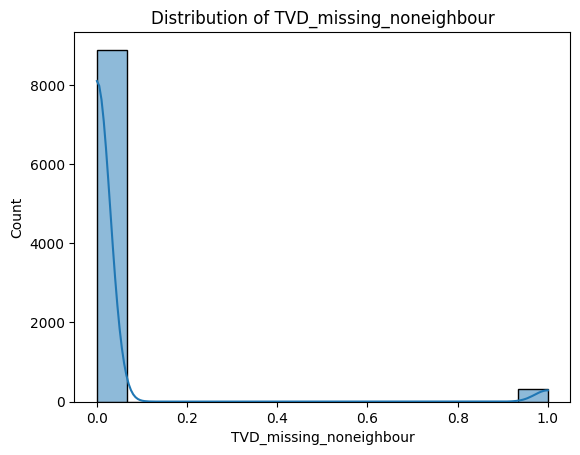

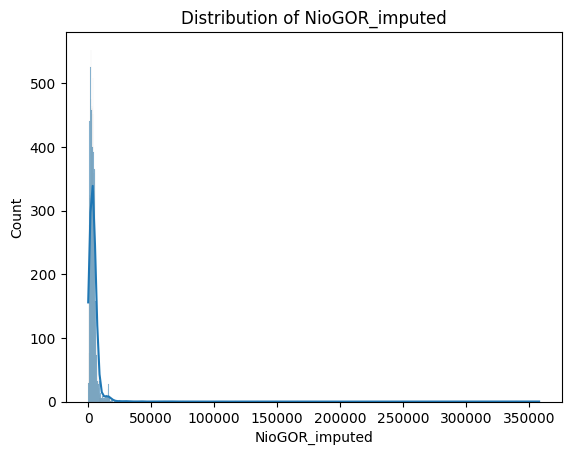

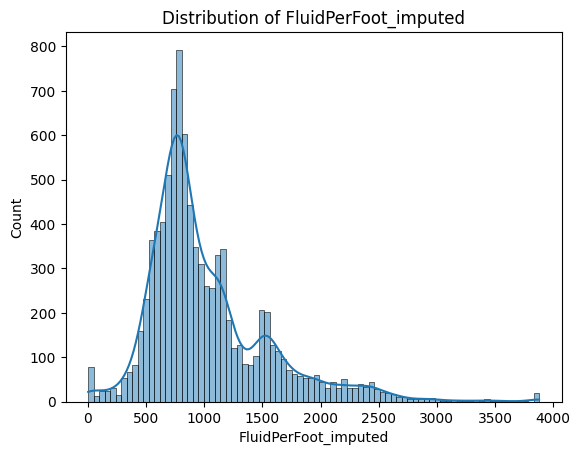

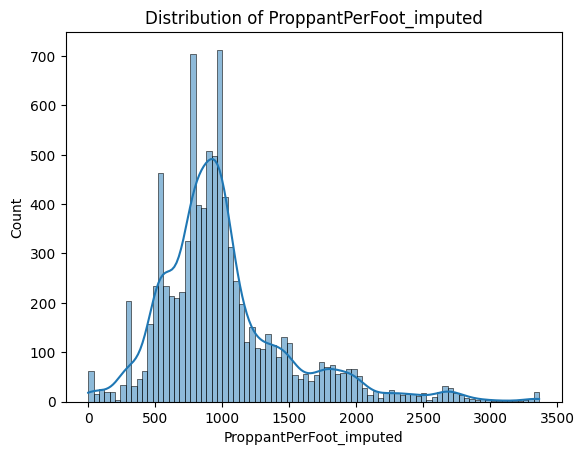

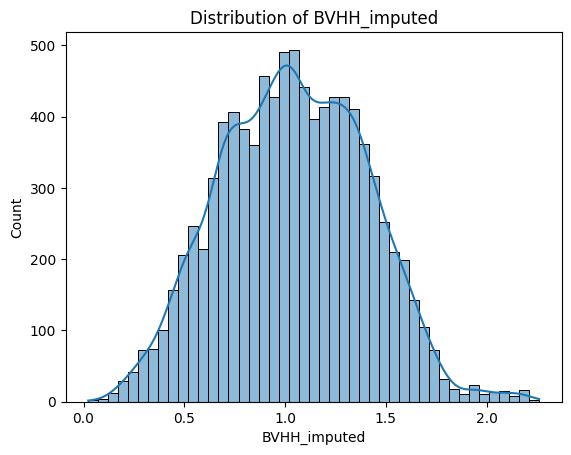

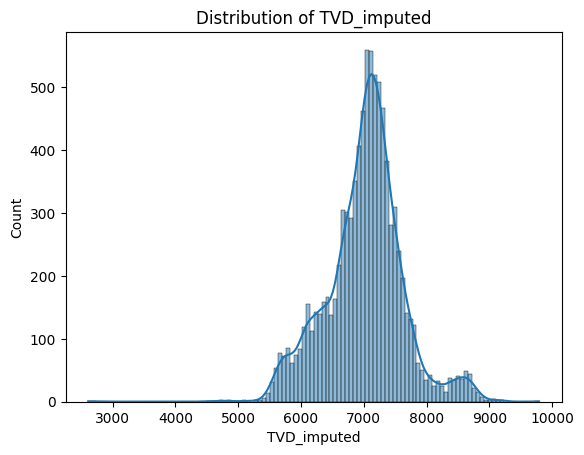

In [ ]:
for col in ['TVD_missing_noneighbour', 'NioGOR_imputed', 'FluidPerFoot_imputed', 'ProppantPerFoot_imputed', 'BVHH_imputed' , 'TVD_imputed']:
    sns.histplot(df_analysis[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.show()

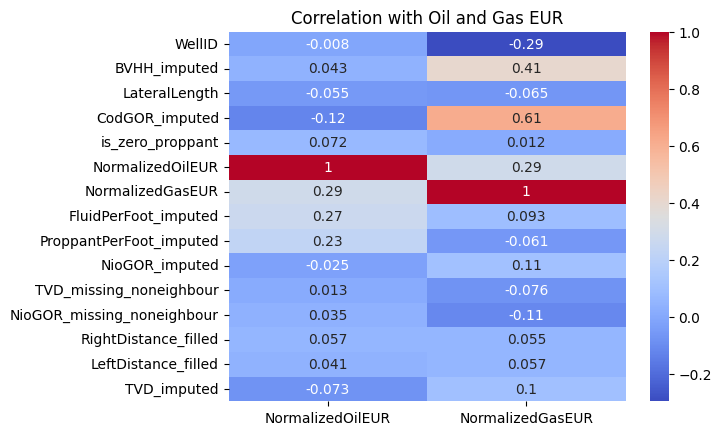

In [ ]:
# linear relationships with targets  (numerical)
correlation = df_analysis.corr(numeric_only=True)
sns.heatmap(correlation[['NormalizedOilEUR', 'NormalizedGasEUR']], annot=True, cmap='coolwarm')
plt.title("Correlation with Oil and Gas EUR")
plt.show()


* CodGOR has linear relationship with normalizedGas with correlation (0.61)

* fluid and proppant have moderate positive linear relationship with oil (0.29 and 0.27 )

* rock quality has positive linear relation with gas with (0.41)

* no feature has direct negative linear relationship


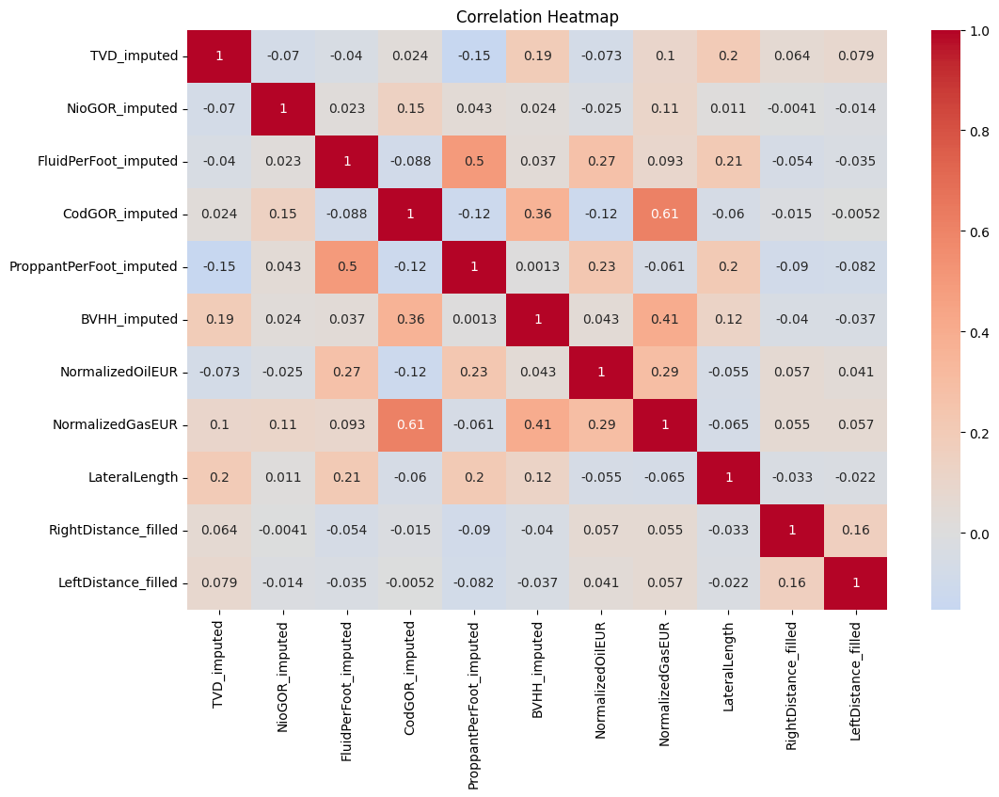

In [ ]:
# to know the affect of the column with nan values of target features
#with heat map


# Only include numeric features + targets
numerical_cols = ['TVD_imputed', 'NioGOR_imputed', 'FluidPerFoot_imputed','CodGOR_imputed', 'ProppantPerFoot_imputed', 'BVHH_imputed', 'NormalizedOilEUR', 'NormalizedGasEUR' ,'LateralLength' , 'RightDistance_filled' , 'LeftDistance_filled']

# Compute correlation matrix
corr = df_analysis[numerical_cols].corr()

# Plot
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Heatmap')
plt.show()



#### Rock analysis

##### BVHH



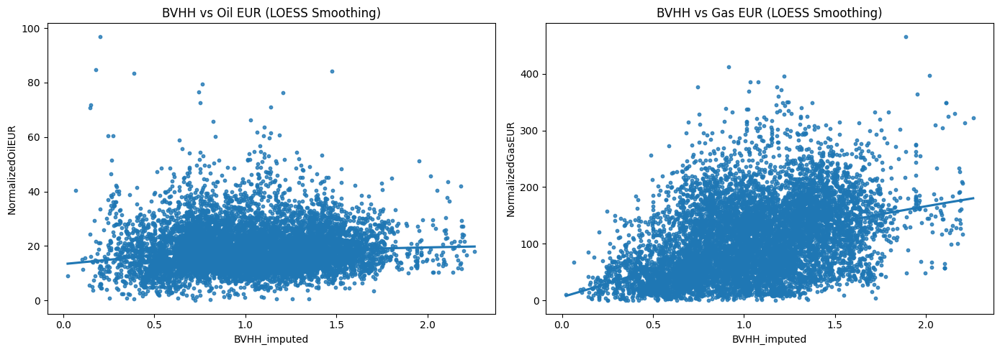

In [ ]:
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns

# Create the subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot 1: BVHH vs Oil EUR
sns.regplot(
    x='BVHH_imputed', y='NormalizedOilEUR',
    data=df_analysis, lowess=True,
    scatter_kws={'s': 10}, ax=axes[0]
)
axes[0].set_title("BVHH vs Oil EUR (LOESS Smoothing)")

# Plot 2: BVHH vs Gas EUR
sns.regplot(
    x='BVHH_imputed', y='NormalizedGasEUR',
    data=df_analysis, lowess=True,
    scatter_kws={'s': 10}, ax=axes[1]
)
axes[1].set_title("BVHH vs Gas EUR (LOESS Smoothing)")

plt.tight_layout()
plt.show()


#BVHH: nonllinear results : BVHH_imputed has a non-linear positive relationship with NormalizedGasEUR,
#  making it a valuable predictor for gas production, especially at higher BVHH values.


* BVHH has linear relationship with gas with 0.41 correlation

* BVHH: nonllinear results : BVHH_imputed has a non-linear positive relationship with NormalizedGasEUR making it a valuable predictor for gas production, especially at higher BVHH values.

* with oil a little bit slightly increase

* so the rock quality in general has a positive non linear relationship with normalized gas

##### NioGor (gas to oil in niobrara)

* has no direct effect on the oil or gas



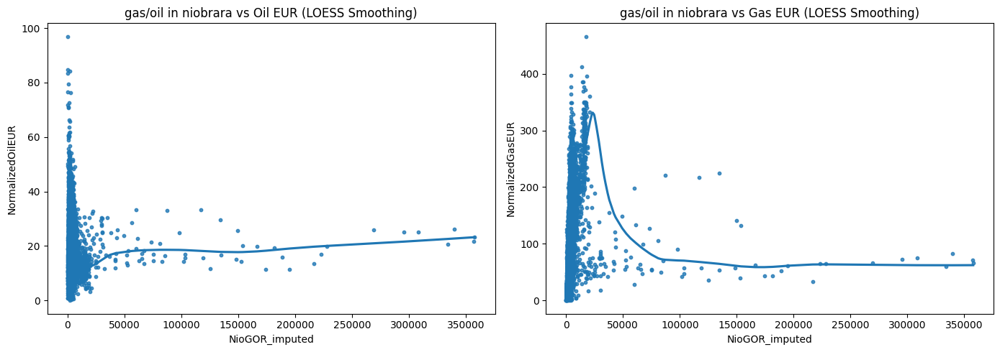

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

sns.regplot(
    x='NioGOR_imputed', y='NormalizedOilEUR',
    data=df_analysis, lowess=True,
    scatter_kws={'s': 10}, ax=axes[0]
)
axes[0].set_title("gas/oil in niobrara vs Oil EUR (LOESS Smoothing)")

# Plot 2: BVHH vs Gas EUR
sns.regplot(
    x='NioGOR_imputed', y='NormalizedGasEUR',
    data=df_analysis, lowess=True,
    scatter_kws={'s': 10}, ax=axes[1]
)
axes[1].set_title("gas/oil in niobrara vs Gas EUR (LOESS Smoothing)")

plt.tight_layout()
plt.show()

* NioGOR is not a strong predictor for oil, and the impact is minimal and nearly flat.

* Either the rock becomes less productive at very high GOR,

* Or it could be outliers or rare cases skewing the results.

##### CodGOR(gas to oil in codell)

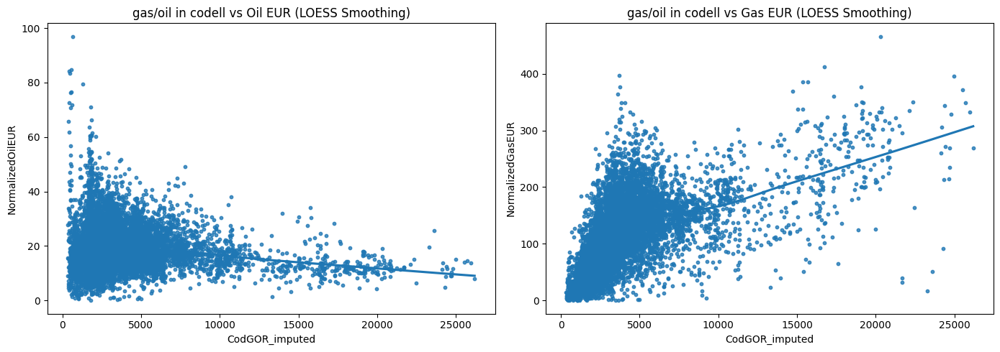

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))


sns.regplot(
    x='CodGOR_imputed', y='NormalizedOilEUR',
    data=df_analysis, lowess=True,
    scatter_kws={'s': 10}, ax=axes[0]
)
axes[0].set_title("gas/oil in codell vs Oil EUR (LOESS Smoothing)")

# Plot 2: BVHH vs Gas EUR
sns.regplot(
    x='CodGOR_imputed', y='NormalizedGasEUR',
    data=df_analysis, lowess=True,
    scatter_kws={'s': 10}, ax=axes[1]
)
axes[1].set_title("gas/oil in codell vs Gas EUR (LOESS Smoothing)")

plt.tight_layout()
plt.show()

* in general has a direct positive relation with gas produce and not very informative to oil

##### formation rocks


In [ ]:
# Group by FormationAlias and calculate mean oil/gas EUR
formation_summary = df_analysis.groupby('FormationAlias')[['NormalizedOilEUR', 'NormalizedGasEUR']].mean()
print(formation_summary)

formation_median = df_analysis.groupby('FormationAlias')[['NormalizedOilEUR', 'NormalizedGasEUR']].median()
print(formation_median)


                NormalizedOilEUR  NormalizedGasEUR
FormationAlias                                    
CODELL                 18.988724        101.860902
NIOBRARA               19.050589        107.134522
                NormalizedOilEUR  NormalizedGasEUR
FormationAlias                                    
CODELL                 17.791218         99.033849
NIOBRARA               17.699634         96.604486


In [ ]:
from scipy.stats import ttest_ind

# Filter each formation
niobrara_oil = df_analysis[df_analysis['FormationAlias'] == 'NIOBRARA']['NormalizedOilEUR']
codell_oil = df_analysis[df_analysis['FormationAlias'] == 'CODELL']['NormalizedOilEUR']

niobrara_gas = df_analysis[df_analysis['FormationAlias'] == 'NIOBRARA']['NormalizedGasEUR']
codell_gas = df_analysis[df_analysis['FormationAlias'] == 'CODELL']['NormalizedGasEUR']

# T-tests
oil_ttest = ttest_ind(niobrara_oil, codell_oil, nan_policy='omit')
gas_ttest = ttest_ind(niobrara_gas, codell_gas, nan_policy='omit')

print("Oil EUR t-test:", oil_ttest)
print("Gas EUR t-test:", gas_ttest)

Oil EUR t-test: TtestResult(statistic=np.float64(0.3132822396015127), pvalue=np.float64(0.7540733425068887), df=np.float64(9202.0))
Gas EUR t-test: TtestResult(statistic=np.float64(3.304018111757369), pvalue=np.float64(0.0009567374996205065), df=np.float64(9202.0))


* there is no insight than one is reach than the other in gas or the oil in general

#### proppant and fluid (stimulation process)

##### proppant

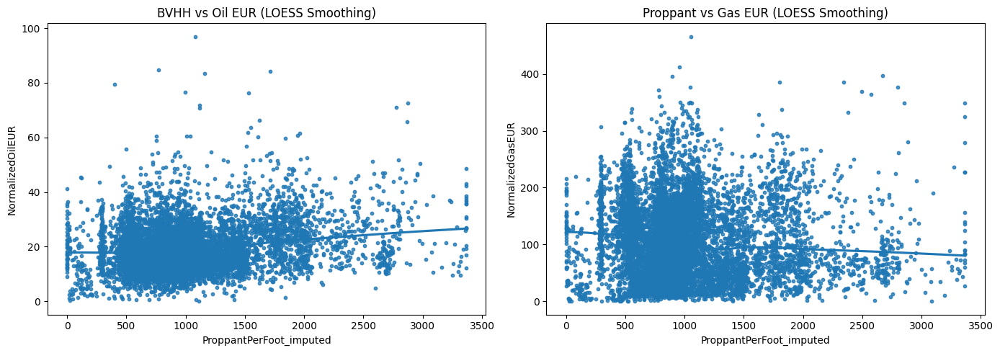

In [ ]:
# linear : proppant and fluid : 0.5 , (missing data from porppant and missing data from fluid = 0.9 ) , proppant with oil : 0.23 , proppant with gas : -0.061 ,

# for non linear
# Create the subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot 1: BVHH vs Oil EUR
sns.regplot(
    x='ProppantPerFoot_imputed', y='NormalizedOilEUR',
    data=df_analysis, lowess=True,
    scatter_kws={'s': 10}, ax=axes[0]
)
axes[0].set_title("BVHH vs Oil EUR (LOESS Smoothing)")

# Plot 2: BVHH vs Gas EUR
sns.regplot(
    x='ProppantPerFoot_imputed', y='NormalizedGasEUR',
    data=df_analysis, lowess=True,
    scatter_kws={'s': 10}, ax=axes[1]
)
axes[1].set_title("Proppant vs Gas EUR (LOESS Smoothing)")

plt.tight_layout()
plt.show()

* proppant has a slightly non linear effect on oil with positive
* has positive linearity effect on oil with 0.23
* and negative effect as it increases on gas


##### Fluid


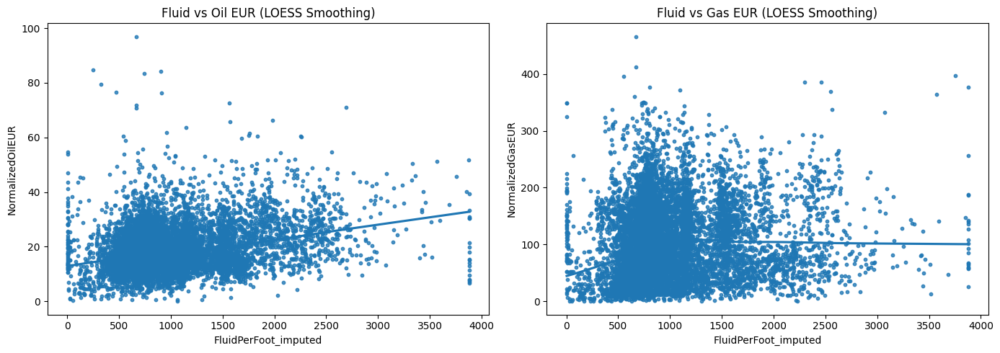

In [ ]:
# fluid with oil : 0.27 , fluid with gas : 0.093

# for non linear
# Create the subplots side by side
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot 1: BVHH vs Oil EUR
sns.regplot(
    x='FluidPerFoot_imputed', y='NormalizedOilEUR',
    data=df_analysis, lowess=True,
    scatter_kws={'s': 10}, ax=axes[0]
)
axes[0].set_title("Fluid vs Oil EUR (LOESS Smoothing)")

# Plot 2: BVHH vs Gas EUR
sns.regplot(
    x='FluidPerFoot_imputed', y='NormalizedGasEUR',
    data=df_analysis, lowess=True,
    scatter_kws={'s': 10}, ax=axes[1]
)
axes[1].set_title("Fluid vs Gas EUR (LOESS Smoothing)")

plt.tight_layout()
plt.show()

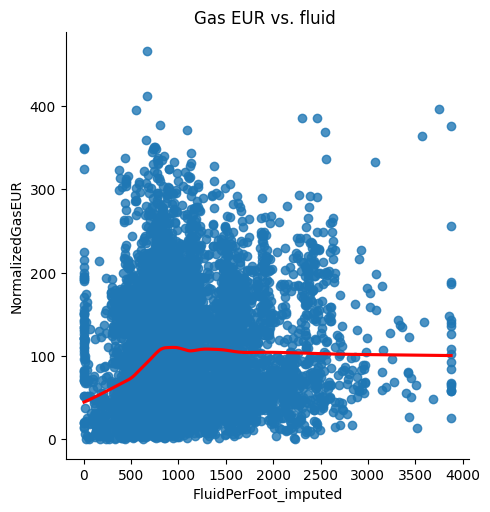

In [ ]:
sns.lmplot(
    df_analysis,
    x='FluidPerFoot_imputed',
    y='NormalizedGasEUR',
    lowess=True,
    line_kws={'color': 'red'}
)
plt.title('Gas EUR vs. fluid ')
plt.show()

* fluid has positive relationwith oil
* the gas increases as the fluid increase until a threshold at 1000 and then no change


##### fluid with proppant

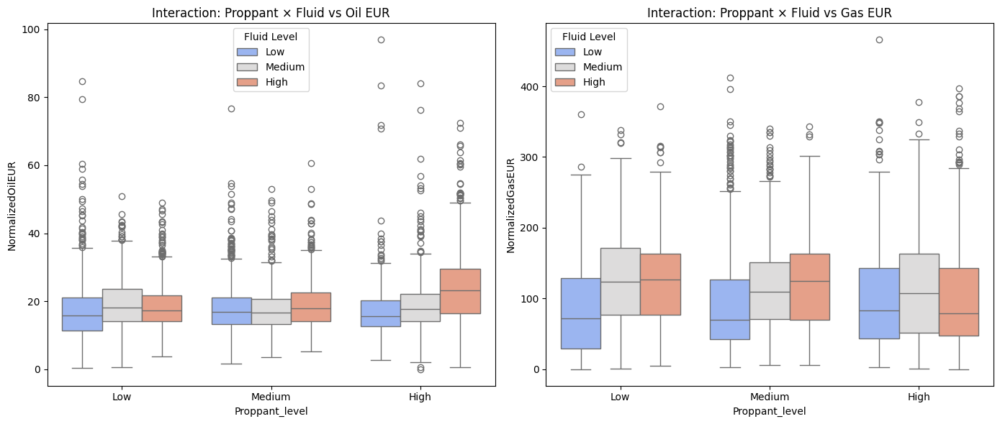

In [ ]:
df_analysis['Proppant_level'] = pd.qcut(df_analysis['ProppantPerFoot_imputed'], q=3, labels=['Low', 'Medium', 'High'])
df_analysis['Fluid_level'] = pd.qcut(df_analysis['FluidPerFoot_imputed'], q=3, labels=['Low', 'Medium', 'High'])

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot Oil EUR
sns.boxplot(
    data=df_analysis,
    x='Proppant_level',
    y='NormalizedOilEUR',
    hue='Fluid_level',
    ax=axes[0],
    palette='coolwarm'
)
axes[0].set_title('Interaction: Proppant × Fluid vs Oil EUR')
axes[0].legend(title='Fluid Level')

# Plot Gas EUR
sns.boxplot(
    data=df_analysis,
    x='Proppant_level',
    y='NormalizedGasEUR',
    hue='Fluid_level',
    ax=axes[1],
    palette='coolwarm'
)
axes[1].set_title('Interaction: Proppant × Fluid vs Gas EUR')
axes[1].legend(title='Fluid Level')

plt.tight_layout()
plt.show()

In [ ]:
interaction_summary = df_analysis.groupby(['Proppant_level', 'Fluid_level'])[['NormalizedOilEUR', 'NormalizedGasEUR']].mean().round(2)
print(interaction_summary)


                            NormalizedOilEUR  NormalizedGasEUR
Proppant_level Fluid_level                                    
Low            Low                     16.94             84.16
               Medium                  19.15            124.43
               High                    18.57            122.85
Medium         Low                     17.67             88.92
               Medium                  17.36            114.82
               High                    19.02            123.96
High           Low                     17.27             97.90
               Medium                  18.59            111.95
               High                    23.86            100.07


/tmp/ipython-input-177-2608870127.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  interaction_summary = df_analysis.groupby(['Proppant_level', 'Fluid_level'])[['NormalizedOilEUR', 'NormalizedGasEUR']].mean().round(2)


In [ ]:
# feature engineering
df_analysis['Proppant_x_Fluid'] = df_analysis['ProppantPerFoot_imputed'] * df_analysis['FluidPerFoot_imputed']
df_analysis['HighProppant_HighFluid'] = ((df_analysis['Proppant_level'] == 'High') & (df_analysis['Fluid_level'] == 'High')).astype(int)


for oil :
* Oil EUR increases with Proppant and Fluid, especially when both are High.

* There’s a non-linear effect: increasing just one of them doesn’t help as much.

* High Proppant needs enough Fluid to be fully effective.

for gas :
* Gas EUR doesn’t just increase with more proppant.

* Too much proppant may not help, especially when fluid is already high.

* Sweet spot: Low–Medium Proppant + Medium–High Fluid might be optimal.

suggestions :
- If cost matters, don’t overuse proppant unless fluid is also high.

- For gas production, moderate fluid with low proppant could be more cost-effective.

#### well paramters in general

##### TVD

* not direct linear relationship with gas or oil

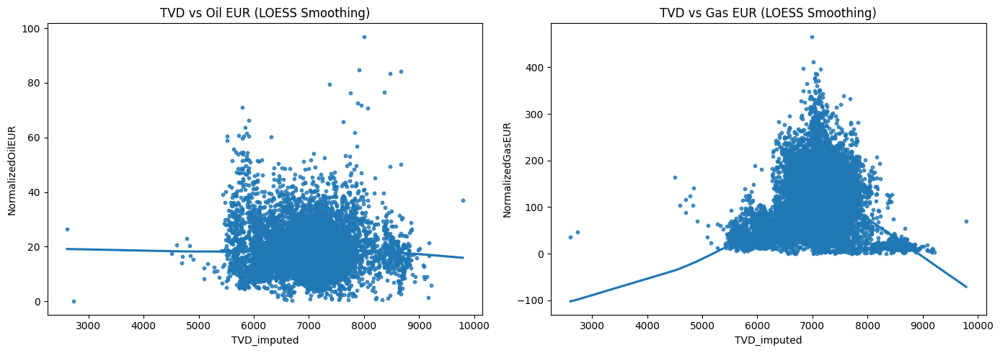

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot 1: BVHH vs Oil EUR
sns.regplot(
    x='TVD_imputed', y='NormalizedOilEUR',
    data=df_analysis, lowess=True,
    scatter_kws={'s': 10}, ax=axes[0]
)
axes[0].set_title("TVD vs Oil EUR (LOESS Smoothing)")

# Plot 2: BVHH vs Gas EUR
sns.regplot(
    x='TVD_imputed', y='NormalizedGasEUR',
    data=df_analysis, lowess=True,
    scatter_kws={'s': 10}, ax=axes[1]
)
axes[1].set_title("TVD vs Gas EUR (LOESS Smoothing)")

plt.tight_layout()
plt.show()

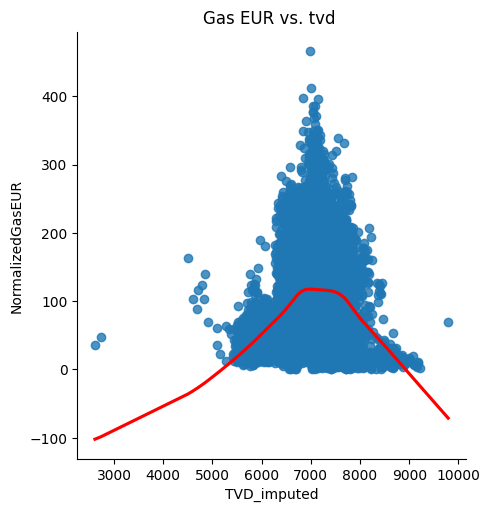

In [ ]:
sns.lmplot(
    df_analysis,
    x='TVD_imputed',
    y='NormalizedGasEUR',
    lowess=True,
    line_kws={'color': 'red'}
)
plt.title('Gas EUR vs. tvd ')
plt.show()

* Increasing Gas EUR with Depth (up to ~7500) Deeper wells often tap into more mature rock layers with more hydrocarbons.

*  Decreasing Gas EUR after 8000 ft After (sweet spot curve ) a certain point:
  * Reservoir quality may decline (tighter rock, less permeability).

  * Higher pressure & temperature can lead to gas migration, meaning gas may have escaped over geological time.

* needs more analysis with other feature related to the rocks

##### lateral length

* slightly positive linear relation with oil (0.29)

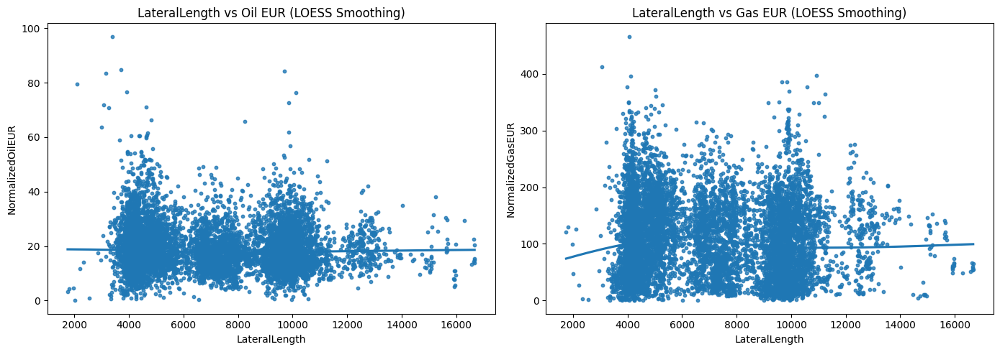

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot 1: BVHH vs Oil EUR
sns.regplot(
    x='LateralLength', y='NormalizedOilEUR',
    data=df_analysis, lowess=True,
    scatter_kws={'s': 10}, ax=axes[0]
)
axes[0].set_title("LateralLength vs Oil EUR (LOESS Smoothing)")

# Plot 2: BVHH vs Gas EUR
sns.regplot(
    x='LateralLength', y='NormalizedGasEUR',
    data=df_analysis, lowess=True,
    scatter_kws={'s': 10}, ax=axes[1]
)
axes[1].set_title("LateralLength vs Gas EUR (LOESS Smoothing)")

plt.tight_layout()
plt.show()

* in general has no relation either with oil or gas




#### neighbor'wells

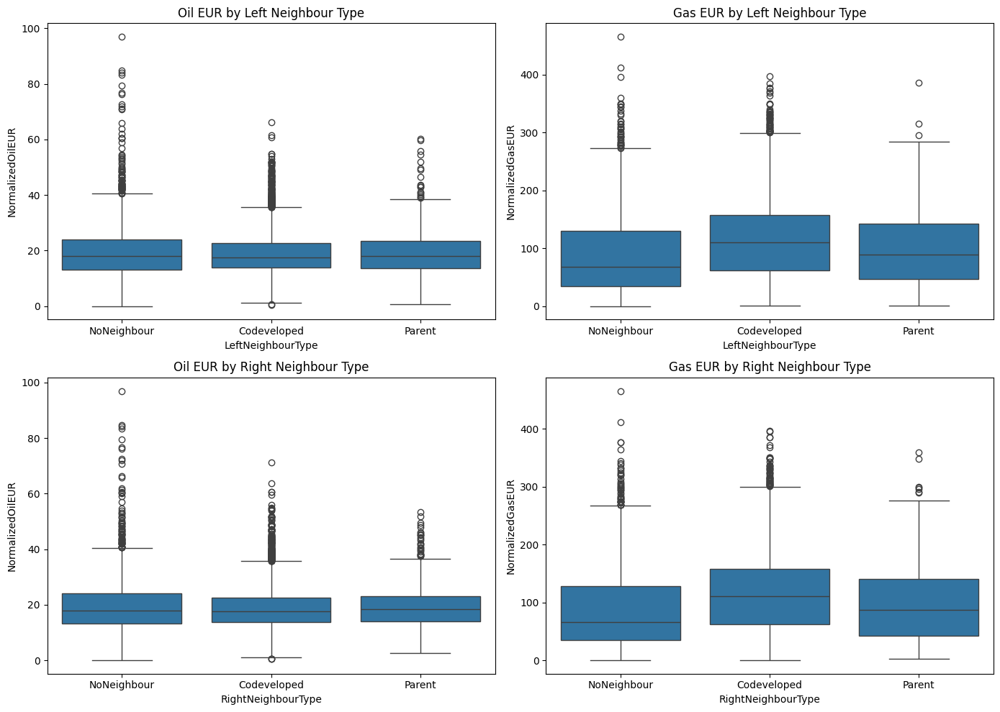

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt



fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Plot 1: Left Neighbour Type vs Oil EUR
sns.boxplot(ax=axes[0, 0], x='LeftNeighbourType', y='NormalizedOilEUR', data=df_analysis)
axes[0, 0].set_title("Oil EUR by Left Neighbour Type")

# Plot 2: Left Neighbour Type vs Gas EUR
sns.boxplot(ax=axes[0, 1], x='LeftNeighbourType', y='NormalizedGasEUR', data=df_analysis)
axes[0, 1].set_title("Gas EUR by Left Neighbour Type")

# Plot 3: Right Neighbour Type vs Oil EUR
sns.boxplot(ax=axes[1, 0], x='RightNeighbourType', y='NormalizedOilEUR', data=df_analysis)
axes[1, 0].set_title("Oil EUR by Right Neighbour Type")

# Plot 4: Right Neighbour Type vs Gas EUR
sns.boxplot(ax=axes[1, 1], x='RightNeighbourType', y='NormalizedGasEUR', data=df_analysis)
axes[1, 1].set_title("Gas EUR by Right Neighbour Type")

plt.tight_layout()
plt.show()


* in general more oil in the noneighbor
* more gas in wells that has codeveloped wells

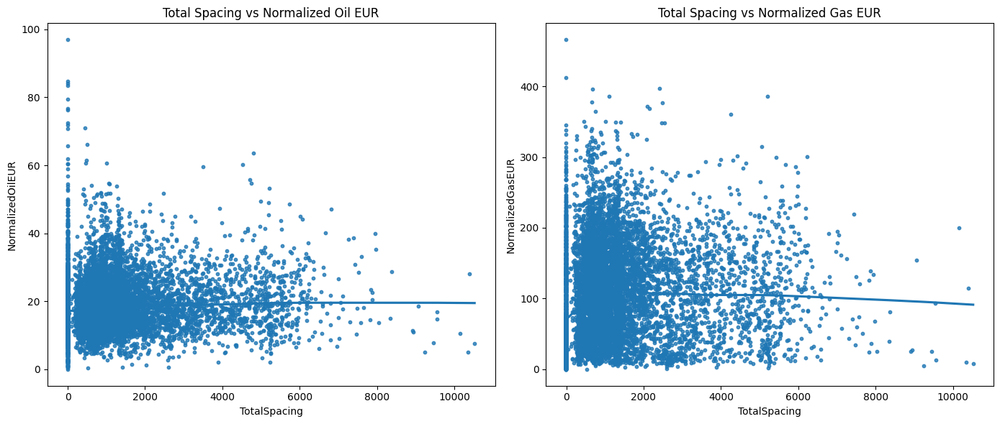

In [ ]:
# spacing
df_analysis['TotalSpacing'] = df_analysis['LeftDistance_filled'] + df_analysis['RightDistance_filled']



fig, axes = plt.subplots(1, 2, figsize=(14, 6))

sns.regplot(
    x='TotalSpacing', y='NormalizedOilEUR',
    data=df_analysis, lowess=True, scatter_kws={'s': 10}, ax=axes[0]
)
axes[0].set_title("Total Spacing vs Normalized Oil EUR")

sns.regplot(
    x='TotalSpacing', y='NormalizedGasEUR',
    data=df_analysis, lowess=True, scatter_kws={'s': 10}, ax=axes[1]
)
axes[1].set_title("Total Spacing vs Normalized Gas EUR")

plt.tight_layout()
plt.show()


* there is no relation with spacing at their one on oil and gas

#### feature importance

In [ ]:
df_analysis


,WellID,BVHH_imputed,FormationAlias,LateralLength,LeftNeighbourType,RightNeighbourType,CodGOR_imputed,is_zero_proppant,NormalizedOilEUR,NormalizedGasEUR,...,Proppant_x_BVHH,Proppant_sq_x_BVHH,HighBVHH_Codell_x_Proppant,HighBVHH_Niobrara_x_Proppant,Proppant_level,Fluid_level,Proppant_x_Fluid,HighProppant_HighFluid,NioGOR_bin,BVHH_imputed_sq
0,500109742,1.105028,NIOBRARA,8084.0,NoNeighbour,NoNeighbour,1838.686753,0,15.234785,37.674048,...,1388.256795,1.744079e+06,0.000000,0.000000,High,High,1.550751e+06,1,Low,1.221088
1,500109753,0.644480,NIOBRARA,3912.0,NoNeighbour,Codeveloped,1728.150821,0,5.327198,11.627301,...,478.747004,3.556336e+05,0.000000,0.000000,Low,Medium,5.823885e+05,0,Low,0.415354
2,500109754,0.620268,NIOBRARA,4137.0,Codeveloped,NoNeighbour,2039.668224,0,5.629925,14.544356,...,566.142175,5.167399e+05,0.000000,0.000000,Medium,High,1.028700e+06,0,Low,0.384732
3,500109760,0.649670,NIOBRARA,4161.0,NoNeighbour,NoNeighbour,666.640507,0,8.240087,7.012257,...,594.242545,5.435441e+05,0.000000,0.000000,Medium,Low,6.320710e+05,0,Low,0.422071
4,500109772,1.423475,NIOBRARA,4418.0,NoNeighbour,NoNeighbour,3199.962930,0,15.374830,51.169534,...,1063.722688,7.948900e+05,0.000000,747.271843,Low,Medium,6.936476e+05,0,Medium,2.026281
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9201,4902129125,0.943273,CODELL,8583.0,Codeveloped,NoNeighbour,949.853322,0,18.513690,15.231737,...,1314.445688,1.831672e+06,0.000000,0.000000,High,High,3.431987e+06,1,Low,0.889765
9202,4902129224,0.629306,CODELL,9882.0,NoNeighbour,NoNeighbour,397.429199,0,33.791844,12.357013,...,1735.971661,4.788766e+06,0.000000,0.000000,High,High,3.764519e+06,1,Low,0.396026
9203,4902129225,0.721965,CODELL,9581.0,NoNeighbour,NoNeighbour,336.475960,0,27.725394,14.413422,...,1827.782229,4.627355e+06,0.000000,0.000000,High,High,3.266778e+06,1,Low,0.521233
9204,4902129416,1.268216,CODELL,9768.0,NoNeighbour,NoNeighbour,519.208816,0,36.654894,35.377252,...,1948.401925,2.993394e+06,1536.333026,0.000000,High,High,3.061820e+06,1,Medium,1.608371


In [ ]:
!pip install catboost


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 4.8 MB/s eta 0:00:00


In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from catboost import CatBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
import shap


# in total spacing replace the -2 with 0
df_analysis['TotalSpacing'] = df_analysis['LeftDistance_filled'] + df_analysis['RightDistance_filled']

df_analysis['TotalSpacing'] = df_analysis['TotalSpacing'].replace(-2, 9999999)
# df_analysis['TotalSpacing'] = df_analysis['TotalSpacing'].replace(0, 99999999)
df_analysis['BVHH_imputed_sq'] = df_analysis['BVHH_imputed']**2


# Step 1: Encode categorical features
features = [
    'BVHH_imputed', 'CodGOR_imputed', 'NioGOR_imputed','Proppant_x_BVHH',
    'LateralLength', 'FluidPerFoot_imputed', 'ProppantPerFoot_imputed',
    'TotalSpacing','TVD_imputed',
    'FormationAlias',
]

df_encoded = pd.get_dummies(df_analysis[features], drop_first=True)

X = df_encoded.copy()

X = X.astype('float64')


# Targets
y_oil = df_analysis['NormalizedOilEUR']
y_gas = df_analysis['NormalizedGasEUR']

# Step 2: Split data
X_train, X_test, y_train_oil, y_test_oil = train_test_split(X, y_oil, test_size=0.2, random_state=42)
_, _, y_train_gas, y_test_gas = train_test_split(X, y_gas, test_size=0.2, random_state=42)

# Step 3: Train models
# model_oil = CatBoostRegressor(verbose=0, random_state=42)
# model_oil = GradientBoostingRegressor(random_state=42)
model_oil = RandomForestRegressor(n_estimators=500,max_depth =10, random_state=42)
model_gas = RandomForestRegressor(n_estimators=500,max_depth= 10, random_state=42)
# model_gas = CatBoostRegressor(verbose=0, random_state=42)
# model_gas = GradientBoostingRegressor(random_state=42)

model_oil.fit(X_train, y_train_oil)
model_gas.fit(X_train, y_train_gas)

# Step 4: Evaluate accuracy
def evaluate_model(model, X, y_true, label):
    y_pred = model.predict(X)
    print(f"\n {label} Model Performance:")
    print("R²:", round(r2_score(y_true, y_pred), 3))
    print("MAE:", round(mean_absolute_error(y_true, y_pred), 3))
    print("RMSE:", round(np.sqrt(mean_squared_error(y_true, y_pred)), 3))

evaluate_model(model_oil, X_test, y_test_oil, "Oil EUR")
evaluate_model(model_gas, X_test, y_test_gas, "Gas EUR")

# # Step 5: SHAP explanation
# print("\n Computing SHAP values for Oil model...")
# explainer_oil = shap.Explainer(model_oil, X_train)
# shap_values_oil = explainer_oil(X_train)

# shap.summary_plot(shap_values_oil, X_train, plot_type="bar")
# shap.summary_plot(shap_values_oil, X_train)

# # Optional: Top 10 feature importances from model directly
# print("\n Top 10 Features by XGBoost Importance (Oil):")
# importances = model_oil.feature_importances_
# importance_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': importances})
# importance_df.sort_values(by='Importance', ascending=False).head(10)



 Oil EUR Model Performance:
R²: 0.436
MAE: 4.477
RMSE: 6.254

 Gas EUR Model Performance:
R²: 0.715
MAE: 24.561
RMSE: 35.278


In [ ]:
import joblib

joblib.dump(model_gas, 'gas_model.pkl')
from google.colab import files
files.download('gas_model.pkl')



<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:

from lightgbm import LGBMRegressor

model_lgb = LGBMRegressor(random_state=42)
model_lgb.fit(X_train, y_train_oil)

evaluate_model(model_lgb, X_test, y_test_oil, "Oil EUR (LightGBM)")


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2552
[LightGBM] [Info] Number of data points in the train set: 7363, number of used features: 11
[LightGBM] [Info] Start training from score 19.006076

 Oil EUR (LightGBM) Model Performance:
R²: 0.461
MAE: 4.258
RMSE: 6.112


#### interactions and feature engineering


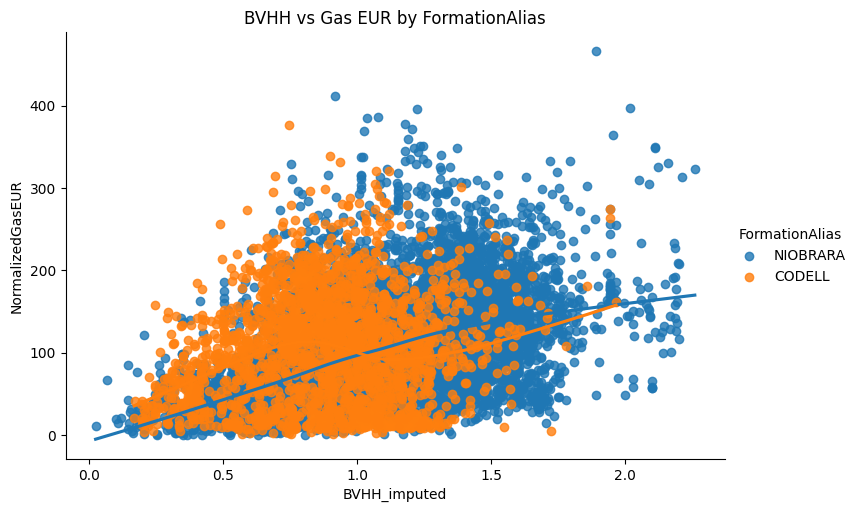

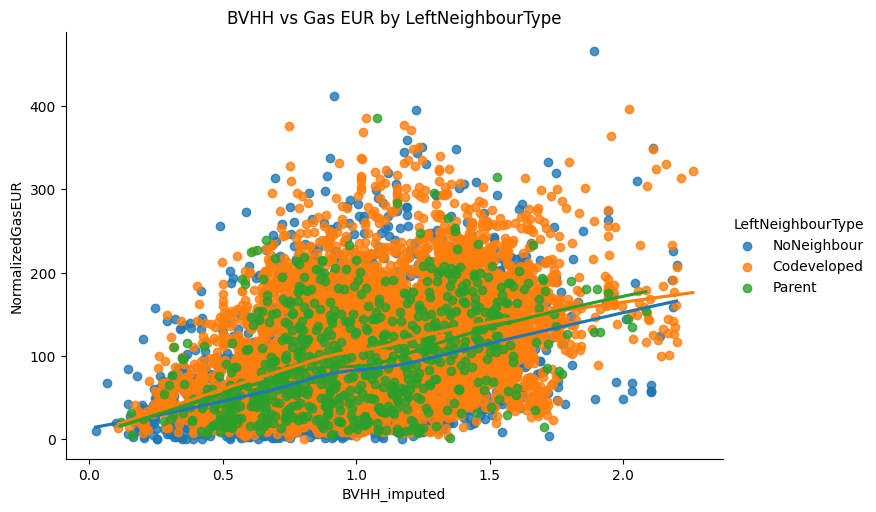

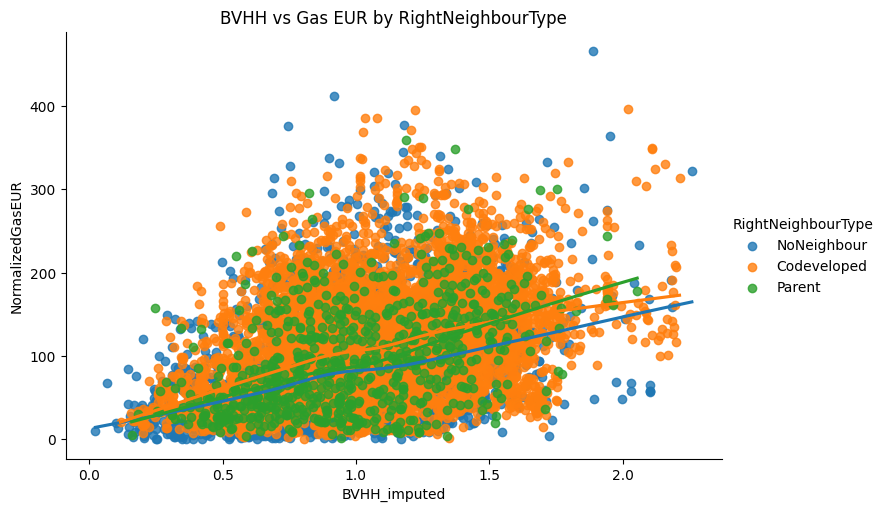

In [ ]:
# with categorical features
sns.lmplot(
    data=df_analysis,
    x="BVHH_imputed", y="NormalizedGasEUR",
    hue="FormationAlias",
    lowess=True,
    aspect=1.5
)
plt.title("BVHH vs Gas EUR by FormationAlias")
plt.show()

sns.lmplot(
    data=df_analysis,
    x="BVHH_imputed", y="NormalizedGasEUR",
    hue="LeftNeighbourType",
    lowess=True,
    aspect=1.5
)

plt.title("BVHH vs Gas EUR by LeftNeighbourType")
plt.show()

sns.lmplot(
    data=df_analysis,
    x="BVHH_imputed", y="NormalizedGasEUR",
    hue="RightNeighbourType",
    lowess=True,
    aspect=1.5
)

plt.title("BVHH vs Gas EUR by RightNeighbourType")
plt.show()


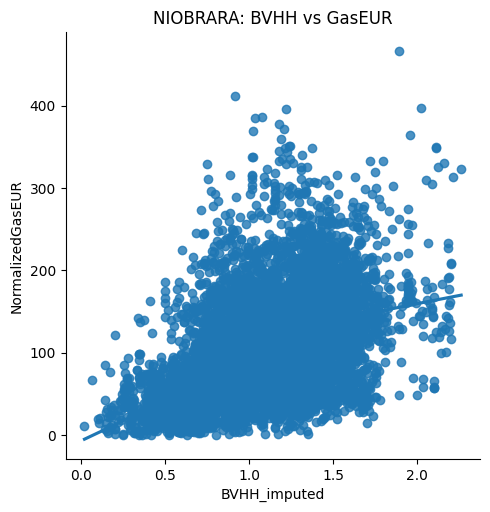

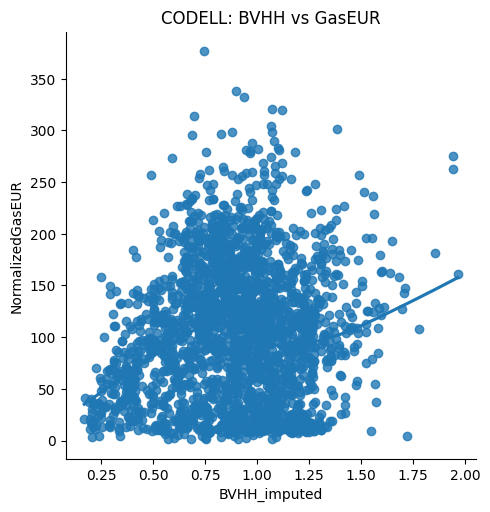

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

for formation in df_analysis['FormationAlias'].unique():
    subset = df_analysis[df_analysis['FormationAlias'] == formation]
    sns.lmplot(data=subset, x='BVHH_imputed', y='NormalizedGasEUR', lowess=True)
    plt.title(f'{formation}: BVHH vs GasEUR')
    plt.show()

In [ ]:
for formation in df_analysis['FormationAlias'].unique():
    subset = df_analysis[df_analysis['FormationAlias'] == formation]
    corr = subset['BVHH_imputed'].corr(subset['NormalizedGasEUR'])
    print(f"{formation} correlation: {corr:.3f}")

for formation in ['CODELL', 'NIOBRARA']:
    subset = df_analysis[df_analysis['FormationAlias'] == formation]
    corr = subset['BVHH_imputed'].corr(subset['NormalizedOilEUR'])
    print(f"{formation} correlation with oil EUR: {round(corr, 3)}")

for formation in df_analysis['LeftNeighbourType'].unique():
    subset = df_analysis[df_analysis['LeftNeighbourType'] == formation]
    corr = subset['BVHH_imputed'].corr(subset['NormalizedGasEUR'])
    print(f"{formation} correlation: {corr:.3f}")

for formation in df_analysis['RightNeighbourType'].unique():
    subset = df_analysis[df_analysis['RightNeighbourType'] == formation]
    corr = subset['BVHH_imputed'].corr(subset['NormalizedGasEUR'])
    print(f"{formation} correlation: {corr:.3f}")




NIOBRARA correlation: 0.492
CODELL correlation: 0.099
CODELL correlation with oil EUR: -0.038
NIOBRARA correlation with oil EUR: 0.065
NoNeighbour correlation: 0.368
Codeveloped correlation: 0.402
Parent correlation: 0.398
NoNeighbour correlation: 0.363
Codeveloped correlation: 0.394
Parent correlation: 0.446


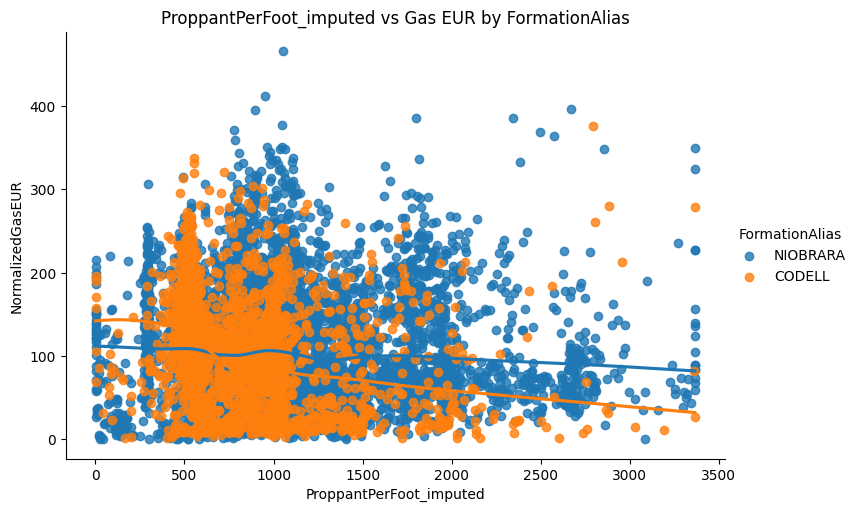

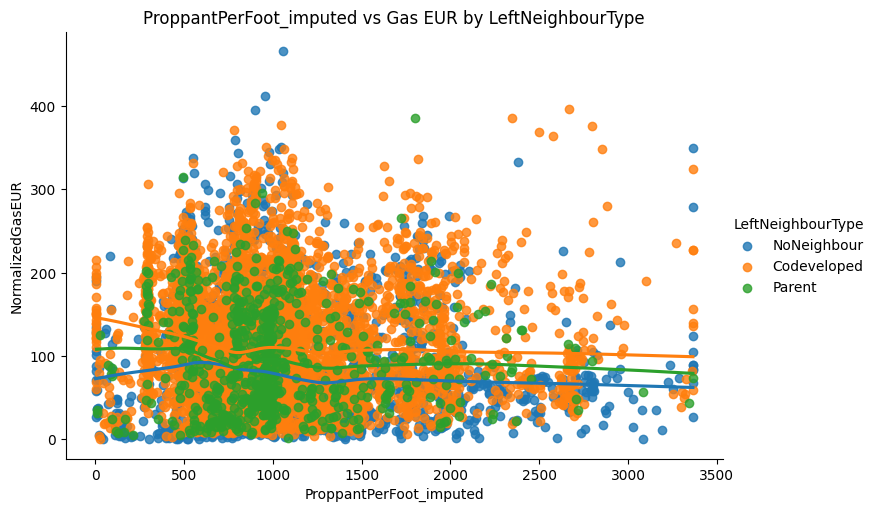

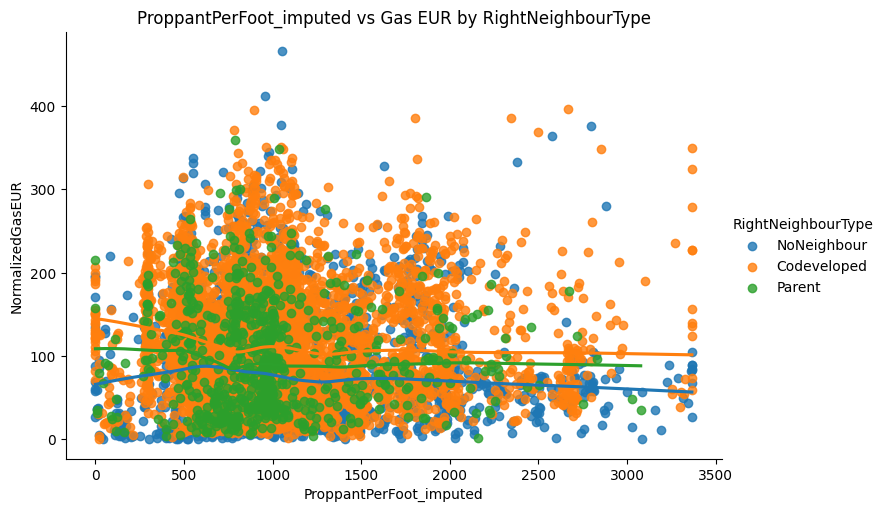

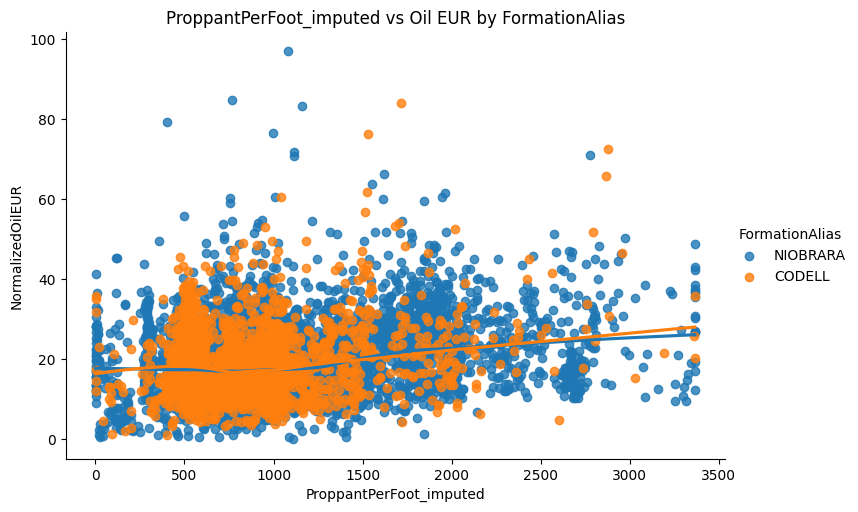

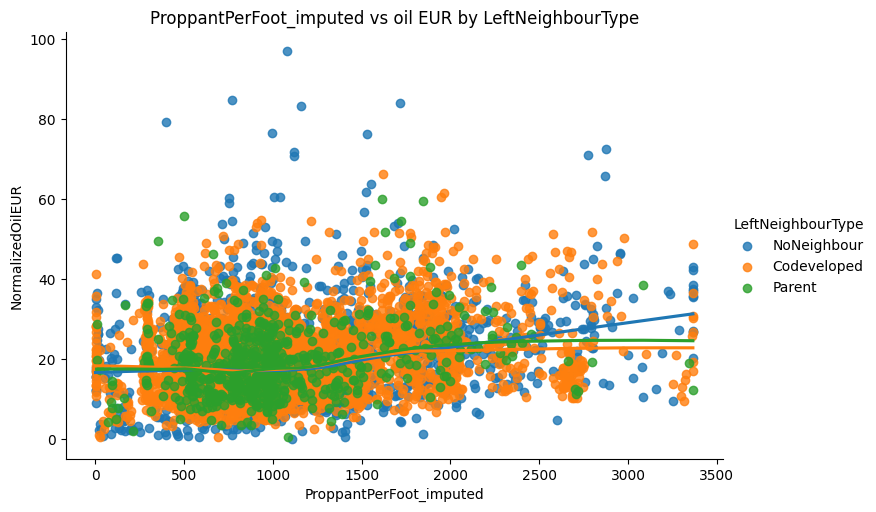

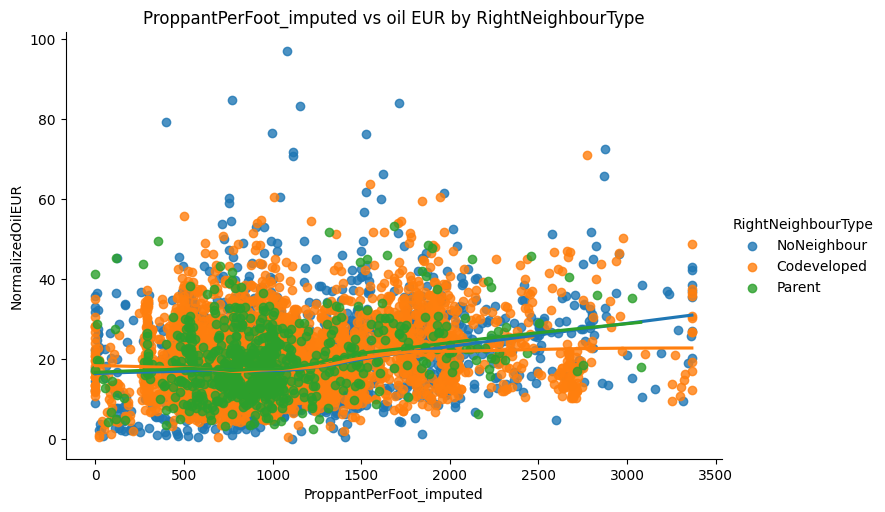

In [ ]:
# its interatcion with categorical data
# with categorical features
sns.lmplot(
    data=df_analysis,
    x="ProppantPerFoot_imputed", y="NormalizedGasEUR",
    hue="FormationAlias",
    lowess=True,
    aspect=1.5
)
plt.title("ProppantPerFoot_imputed vs Gas EUR by FormationAlias")
plt.show()

sns.lmplot(
    data=df_analysis,
    x="ProppantPerFoot_imputed", y="NormalizedGasEUR",
    hue="LeftNeighbourType",
    lowess=True,
    aspect=1.5
)

plt.title("ProppantPerFoot_imputed vs Gas EUR by LeftNeighbourType")
plt.show()

sns.lmplot(
    data=df_analysis,
    x="ProppantPerFoot_imputed", y="NormalizedGasEUR",
    hue="RightNeighbourType",
    lowess=True,
    aspect=1.5
)

plt.title("ProppantPerFoot_imputed vs Gas EUR by RightNeighbourType")
plt.show()


sns.lmplot(
    data=df_analysis,
    x="ProppantPerFoot_imputed", y="NormalizedOilEUR",
    hue="FormationAlias",
    lowess=True,
    aspect=1.5
)
plt.title("ProppantPerFoot_imputed vs Oil EUR by FormationAlias")
plt.show()

sns.lmplot(
    data=df_analysis,
    x="ProppantPerFoot_imputed", y="NormalizedOilEUR",
    hue="LeftNeighbourType",
    lowess=True,
    aspect=1.5
)

plt.title("ProppantPerFoot_imputed vs oil EUR by LeftNeighbourType")
plt.show()

sns.lmplot(
    data=df_analysis,
    x="ProppantPerFoot_imputed", y="NormalizedOilEUR",
    hue="RightNeighbourType",
    lowess=True,
    aspect=1.5
)

plt.title("ProppantPerFoot_imputed vs oil EUR by RightNeighbourType")
plt.show()


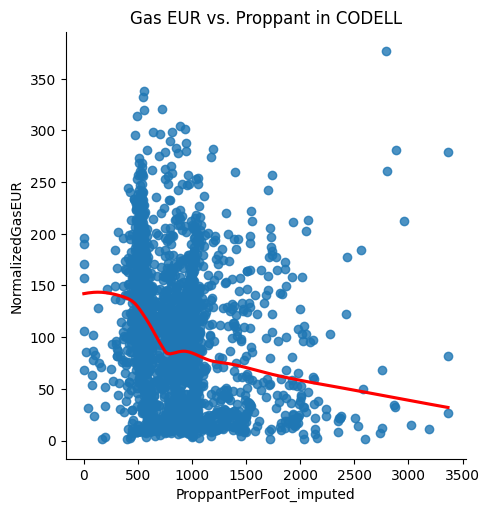

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.lmplot(
    data=df_analysis[df_analysis['FormationAlias'] == 'CODELL'],
    x='ProppantPerFoot_imputed',
    y='NormalizedGasEUR',
    lowess=True,
    line_kws={'color': 'red'}
)
plt.title('Gas EUR vs. Proppant in CODELL')
plt.show()


<Figure size 800x500 with 0 Axes>

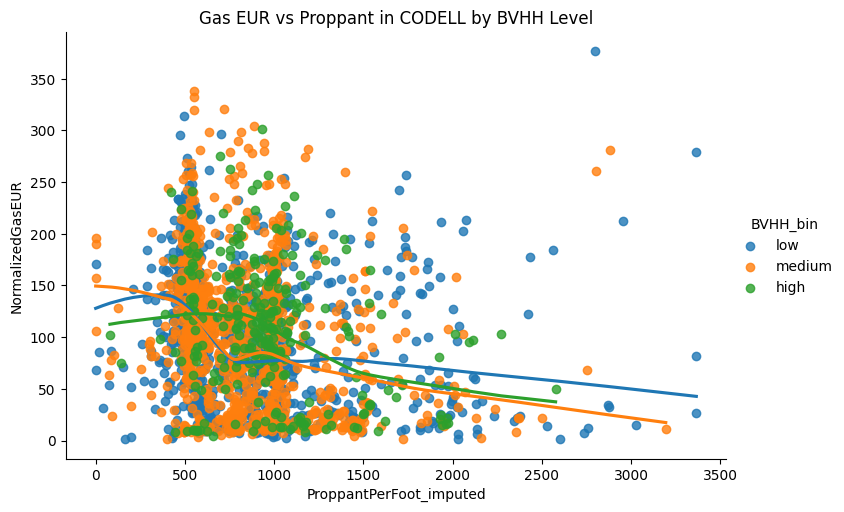

<Figure size 800x500 with 0 Axes>

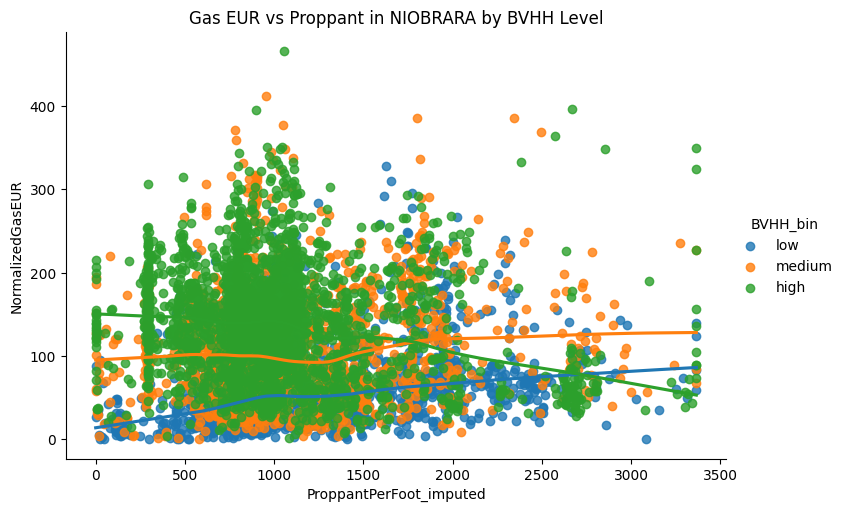

In [ ]:
for formation in ['CODELL', 'NIOBRARA']:
    subset = df_analysis[df_analysis['FormationAlias'] == formation]

    plt.figure(figsize=(8, 5))
    sns.lmplot(
        data=subset,
        x='ProppantPerFoot_imputed',
        y='NormalizedGasEUR',
        hue='BVHH_bin',
        lowess=True,
        height=5,
        aspect=1.5
    )
    plt.title(f'Gas EUR vs Proppant in {formation} by BVHH Level')
    plt.show()

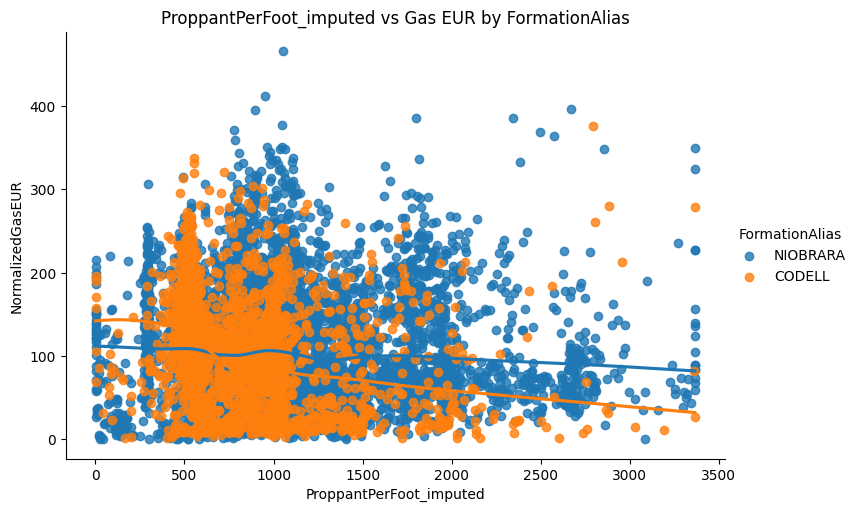

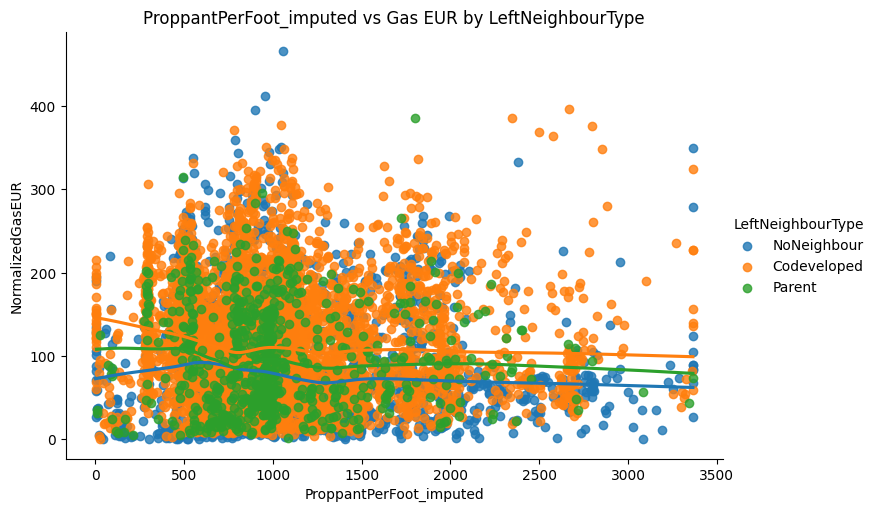

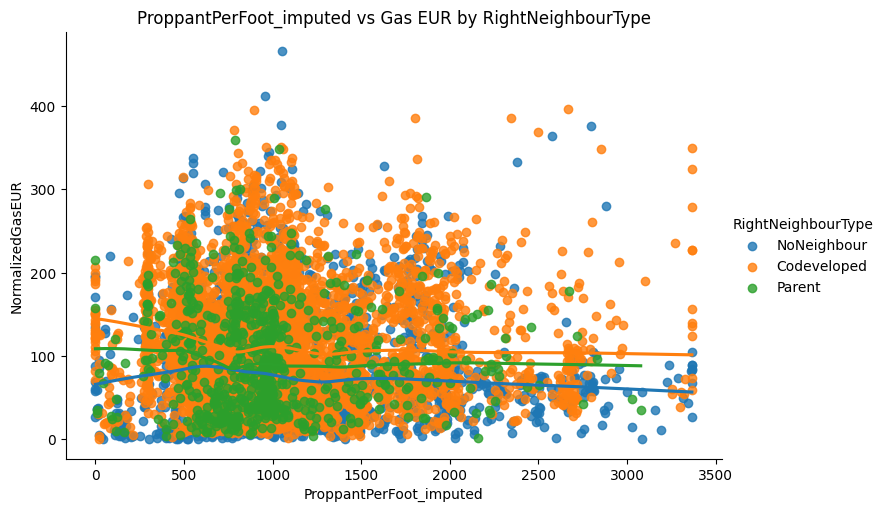

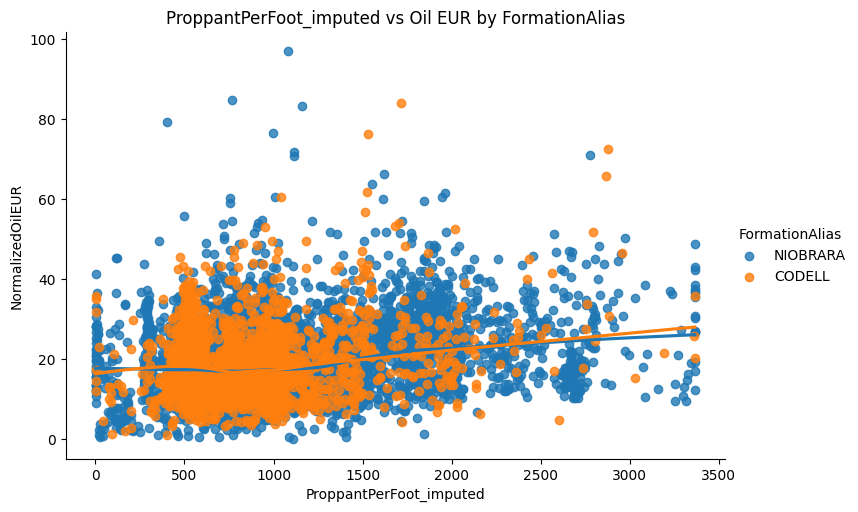

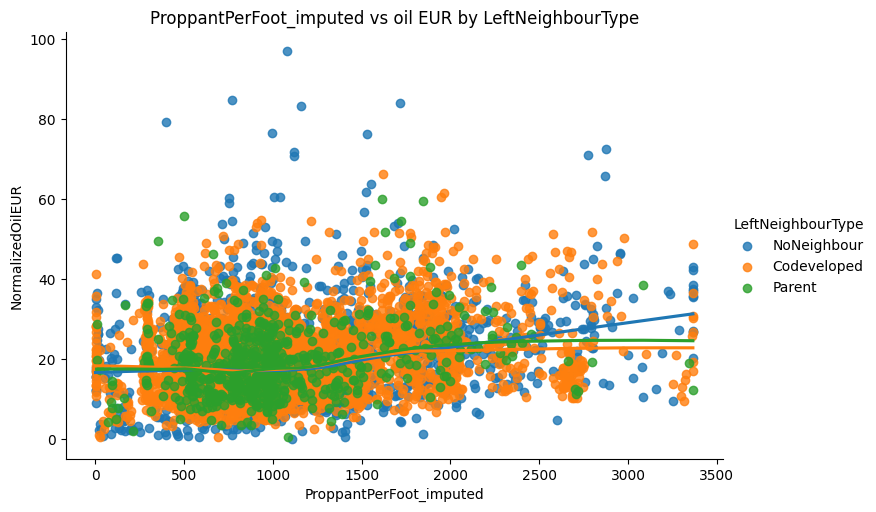

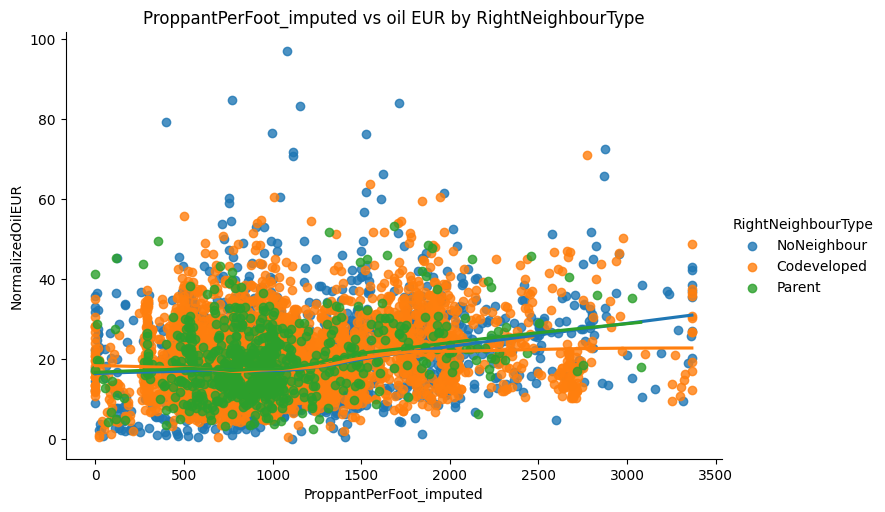

In [ ]:
# its interatcion with categorical data
# with categorical features
sns.lmplot(
    data=df_analysis,
    x="ProppantPerFoot_imputed", y="NormalizedGasEUR",
    hue="FormationAlias",
    lowess=True,
    aspect=1.5
)
plt.title("ProppantPerFoot_imputed vs Gas EUR by FormationAlias")
plt.show()

sns.lmplot(
    data=df_analysis,
    x="ProppantPerFoot_imputed", y="NormalizedGasEUR",
    hue="LeftNeighbourType",
    lowess=True,
    aspect=1.5
)

plt.title("ProppantPerFoot_imputed vs Gas EUR by LeftNeighbourType")
plt.show()

sns.lmplot(
    data=df_analysis,
    x="ProppantPerFoot_imputed", y="NormalizedGasEUR",
    hue="RightNeighbourType",
    lowess=True,
    aspect=1.5
)

plt.title("ProppantPerFoot_imputed vs Gas EUR by RightNeighbourType")
plt.show()


sns.lmplot(
    data=df_analysis,
    x="ProppantPerFoot_imputed", y="NormalizedOilEUR",
    hue="FormationAlias",
    lowess=True,
    aspect=1.5
)
plt.title("ProppantPerFoot_imputed vs Oil EUR by FormationAlias")
plt.show()

sns.lmplot(
    data=df_analysis,
    x="ProppantPerFoot_imputed", y="NormalizedOilEUR",
    hue="LeftNeighbourType",
    lowess=True,
    aspect=1.5
)

plt.title("ProppantPerFoot_imputed vs oil EUR by LeftNeighbourType")
plt.show()

sns.lmplot(
    data=df_analysis,
    x="ProppantPerFoot_imputed", y="NormalizedOilEUR",
    hue="RightNeighbourType",
    lowess=True,
    aspect=1.5
)

plt.title("ProppantPerFoot_imputed vs oil EUR by RightNeighbourType")
plt.show()

# the same in codell as proppant


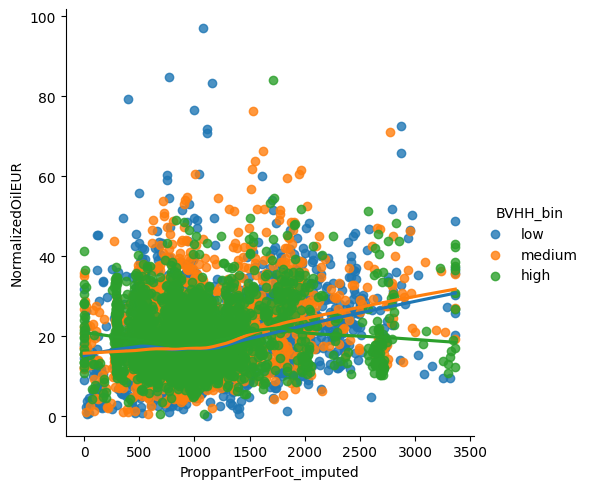

In [ ]:
df_analysis['BVHH_bin'] = pd.qcut(df_analysis['BVHH_imputed'], q=3, labels=['low', 'medium', 'high'])

sns.lmplot(data=df_analysis, x='ProppantPerFoot_imputed', y='NormalizedOilEUR', hue='BVHH_bin', lowess=True)

# same for oil be not differ either its in codell or niobrara

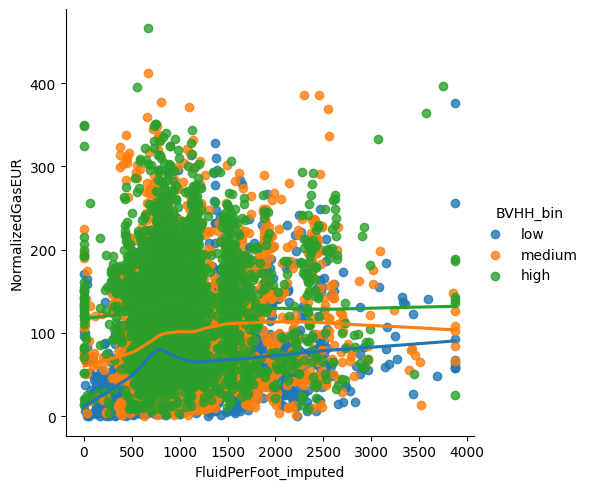

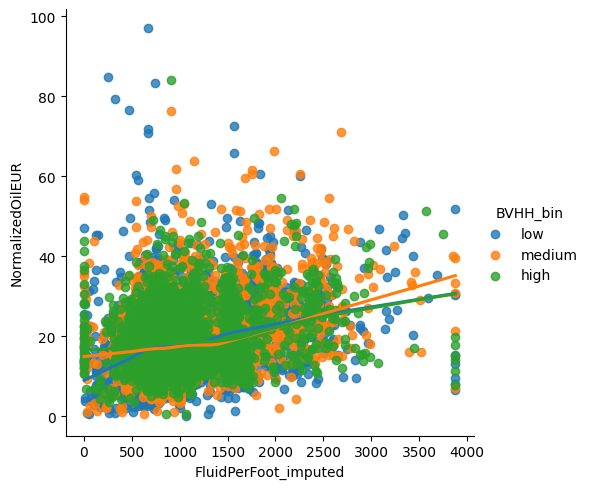

In [ ]:

sns.lmplot(data=df_analysis, x='FluidPerFoot_imputed', y='NormalizedGasEUR', hue='BVHH_bin', lowess=True)

sns.lmplot(data=df_analysis, x='FluidPerFoot_imputed', y='NormalizedOilEUR', hue='BVHH_bin', lowess=True)


##### Feature Engineering

In [ ]:
# This confirms that BVHH_imputed has the strongest impact on gas EUR within the NIOBRARA formation, and it's significantly stronger than in CODELL.

df_analysis['BVHH_x_NIOBRARA'] = df_analysis['BVHH_imputed'] * (df_analysis['FormationAlias'] == 'NIOBRARA').astype(int)
df_analysis

,WellID,BVHH_imputed,FormationAlias,LateralLength,LeftNeighbourType,RightNeighbourType,CodGOR_imputed,is_zero_proppant,NormalizedOilEUR,NormalizedGasEUR,FluidPerFoot_imputed,ProppantPerFoot_imputed,NioGOR_imputed,TVD_missing_noneighbour,NioGOR_missing_noneighbour,RightDistance_filled,LeftDistance_filled,TVD_imputed,TotalSpacing,BVHH_x_NIOBRARA
0,500109742,1.105028,NIOBRARA,8084.0,NoNeighbour,NoNeighbour,1838.686753,0,15.234785,37.674048,1234.370856,1256.308758,1687.414535,0,0,-1.0,-1.0,7501.0,-2.0,1.105028
1,500109753,0.644480,NIOBRARA,3912.0,NoNeighbour,Codeveloped,1728.150821,0,5.327198,11.627301,784.000000,742.842536,2267.667384,0,0,1330.0,-1.0,7551.0,1329.0,0.644480
2,500109754,0.620268,NIOBRARA,4137.0,Codeveloped,NoNeighbour,2039.668224,0,5.629925,14.544356,1127.047136,912.738700,2368.236087,0,0,-1.0,1330.0,7594.0,1329.0,0.620268
3,500109760,0.649670,NIOBRARA,4161.0,NoNeighbour,NoNeighbour,666.640507,0,8.240087,7.012257,691.026676,914.683970,333.876618,0,0,-1.0,-1.0,7391.0,-2.0,0.649670
4,500109772,1.423475,NIOBRARA,4418.0,NoNeighbour,NoNeighbour,3199.962930,0,15.374830,51.169534,928.239928,747.271843,3608.065949,0,0,-1.0,-1.0,7838.0,-2.0,1.423475
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9201,4902129125,0.943273,CODELL,8583.0,Codeveloped,NoNeighbour,949.853322,0,18.513690,15.231737,2462.864733,1393.493883,1190.578936,0,0,-1.0,1325.0,8613.0,1324.0,0.000000
9202,4902129224,0.629306,CODELL,9882.0,NoNeighbour,NoNeighbour,397.429199,0,33.791844,12.357013,1364.672738,2758.550901,1439.732332,0,1,-1.0,-1.0,7631.0,-2.0,0.000000
9203,4902129225,0.721965,CODELL,9581.0,NoNeighbour,NoNeighbour,336.475960,0,27.725394,14.413422,1290.361340,2531.677278,1835.789444,0,1,-1.0,-1.0,7592.0,-2.0,0.000000
9204,4902129416,1.268216,CODELL,9768.0,NoNeighbour,NoNeighbour,519.208816,0,36.654894,35.377252,1992.940418,1536.333026,2864.722028,0,1,-1.0,-1.0,7783.0,-2.0,0.000000


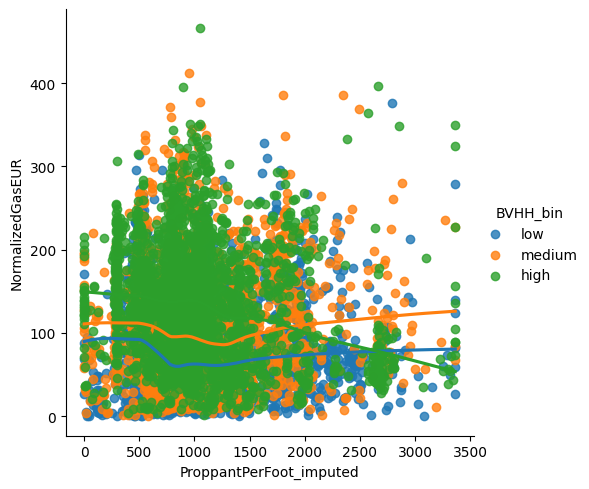

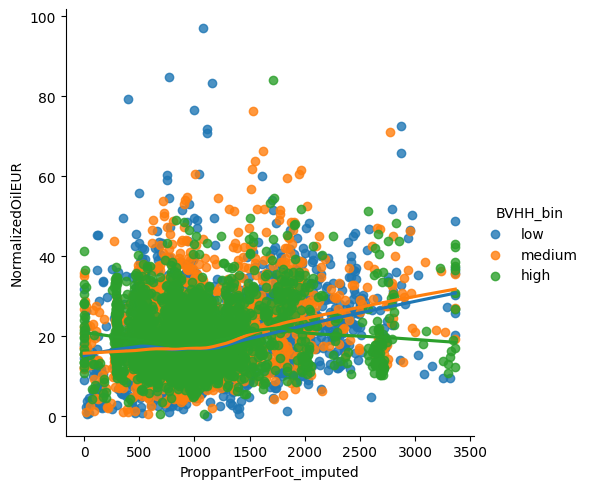

In [ ]:
# is it will differ depend on the rock quality
df_analysis['BVHH_bin'] = pd.qcut(df_analysis['BVHH_imputed'], q=3, labels=['low', 'medium', 'high'])

sns.lmplot(data=df_analysis, x='ProppantPerFoot_imputed', y='NormalizedGasEUR', hue='BVHH_bin', lowess=True)

sns.lmplot(data=df_analysis, x='ProppantPerFoot_imputed', y='NormalizedOilEUR', hue='BVHH_bin', lowess=True)


#“The effectiveness of proppant use depends heavily on rock quality. In high-quality rock (high BVHH), using too much proppant may be counterproductive.”
# BVHH_imputed (rock quality) shows a moderate positive correlation with gas.

# When grouped by BVHH level (low / medium / high):

# In low/medium BVHH groups: increasing proppant leads to higher gas EUR (as expected).

# In high BVHH: increasing proppant initially helps, but at higher levels it causes the curve to bend downward → gas production plateaus or decreases.

# Codell and high-BVHH zones may require less aggressive completion strategies. Excessive proppant  can lead to diminishing returns, or even lower gas EUR.

# adding proppant for oil in the low and medium quality rocks slightly increase the amount of oil



In [ ]:
# conclution
# In Codell formation, increasing ProppantPerFoot shows a consistent diminishing return across all rock quality levels (BVHH),
#  especially pronounced in high BVHH zones. In contrast, Niobrara only shows diminishing returns at high BVHH
# , indicating a more resilient response to stimulation at lower rock qualities.



In [ ]:
df_analysis['Proppant_x_BVHH'] = df_analysis['ProppantPerFoot_imputed'] * df_analysis['BVHH_imputed'] # just for gas and oil

df_analysis['Proppant_sq_x_BVHH'] = (df_analysis['ProppantPerFoot_imputed'] ** 2) * df_analysis['BVHH_imputed']  # just for gas and oil

# adding feature indicating for bvhh_high with codel and proppand for gas
high_bvhh_mask = df_analysis['BVHH_imputed'] > df_analysis['BVHH_imputed'].quantile(0.66)

df_analysis['HighBVHH_Codell_x_Proppant'] = (
    df_analysis['ProppantPerFoot_imputed'] *
    high_bvhh_mask.astype(int) *
    (df_analysis['FormationAlias'] == 'CODELL').astype(int)
)

df_analysis['HighBVHH_Niobrara_x_Proppant'] = (
    df_analysis['ProppantPerFoot_imputed'] *
    high_bvhh_mask.astype(int) *
    (df_analysis['FormationAlias'] == 'NIOBRARA').astype(int)
)



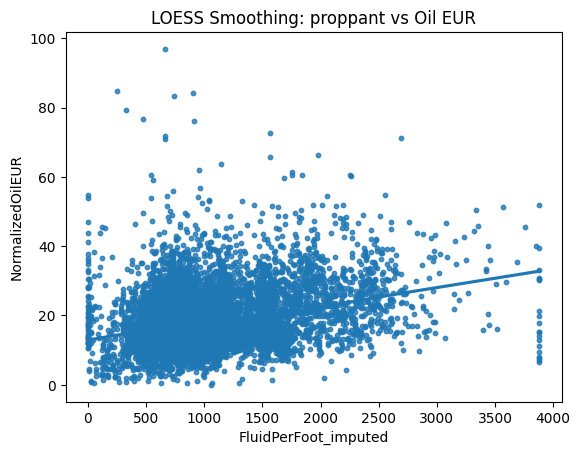

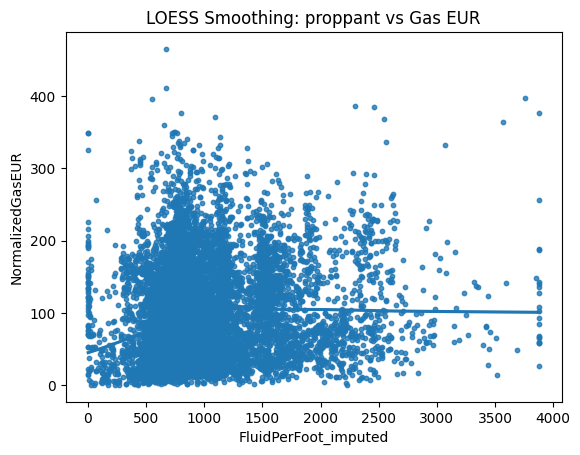

In [ ]:
sns.regplot(x='FluidPerFoot_imputed', y='NormalizedOilEUR', data=df_analysis, lowess=True, scatter_kws={'s': 10})
plt.title("LOESS Smoothing: proppant vs Oil EUR")
plt.show()

sns.regplot(x='FluidPerFoot_imputed', y='NormalizedGasEUR', data=df_analysis, lowess=True, scatter_kws={'s': 10})
plt.title("LOESS Smoothing: proppant vs Gas EUR")
plt.show()

# when fluid incrase the normailized oil increase in a straight line


In [ ]:
df_analysis

,WellID,BVHH_imputed,FormationAlias,LateralLength,LeftNeighbourType,RightNeighbourType,CodGOR_imputed,is_zero_proppant,NormalizedOilEUR,NormalizedGasEUR,...,RightDistance_filled,LeftDistance_filled,TVD_imputed,TotalSpacing,BVHH_x_NIOBRARA,BVHH_bin,Proppant_x_BVHH,Proppant_sq_x_BVHH,HighBVHH_Codell_x_Proppant,HighBVHH_Niobrara_x_Proppant
0,500109742,1.105028,NIOBRARA,8084.0,NoNeighbour,NoNeighbour,1838.686753,0,15.234785,37.674048,...,-1.0,-1.0,7501.0,-2.0,1.105028,medium,1388.256795,1.744079e+06,0.000000,0.000000
1,500109753,0.644480,NIOBRARA,3912.0,NoNeighbour,Codeveloped,1728.150821,0,5.327198,11.627301,...,1330.0,-1.0,7551.0,1329.0,0.644480,low,478.747004,3.556336e+05,0.000000,0.000000
2,500109754,0.620268,NIOBRARA,4137.0,Codeveloped,NoNeighbour,2039.668224,0,5.629925,14.544356,...,-1.0,1330.0,7594.0,1329.0,0.620268,low,566.142175,5.167399e+05,0.000000,0.000000
3,500109760,0.649670,NIOBRARA,4161.0,NoNeighbour,NoNeighbour,666.640507,0,8.240087,7.012257,...,-1.0,-1.0,7391.0,-2.0,0.649670,low,594.242545,5.435441e+05,0.000000,0.000000
4,500109772,1.423475,NIOBRARA,4418.0,NoNeighbour,NoNeighbour,3199.962930,0,15.374830,51.169534,...,-1.0,-1.0,7838.0,-2.0,1.423475,high,1063.722688,7.948900e+05,0.000000,747.271843
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9201,4902129125,0.943273,CODELL,8583.0,Codeveloped,NoNeighbour,949.853322,0,18.513690,15.231737,...,-1.0,1325.0,8613.0,1324.0,0.000000,medium,1314.445688,1.831672e+06,0.000000,0.000000
9202,4902129224,0.629306,CODELL,9882.0,NoNeighbour,NoNeighbour,397.429199,0,33.791844,12.357013,...,-1.0,-1.0,7631.0,-2.0,0.000000,low,1735.971661,4.788766e+06,0.000000,0.000000
9203,4902129225,0.721965,CODELL,9581.0,NoNeighbour,NoNeighbour,336.475960,0,27.725394,14.413422,...,-1.0,-1.0,7592.0,-2.0,0.000000,low,1827.782229,4.627355e+06,0.000000,0.000000
9204,4902129416,1.268216,CODELL,9768.0,NoNeighbour,NoNeighbour,519.208816,0,36.654894,35.377252,...,-1.0,-1.0,7783.0,-2.0,0.000000,high,1948.401925,2.993394e+06,1536.333026,0.000000


##### BVHH X GOR

/tmp/ipython-input-188-215719631.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  grouped = df_analysis.groupby(['BVHH_bin', 'NioGOR_bin'])[['NormalizedOilEUR', 'NormalizedGasEUR']].mean().round(2)


                     NormalizedOilEUR  NormalizedGasEUR
BVHH_bin NioGOR_bin                                    
Low      Low                    18.78             44.30
         Medium                 19.49            103.96
         High                   18.35            133.12
Medium   Low                    21.52             55.88
         Medium                 18.70            107.12
         High                   16.68            149.45
High     Low                    19.07             59.49
         Medium                 20.31            120.85
         High                   18.45            168.32


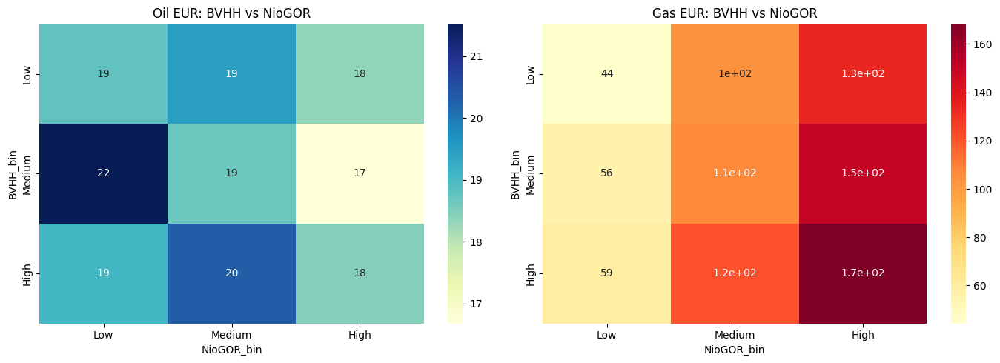

In [ ]:
df_analysis['BVHH_bin'] = pd.qcut(df_analysis['BVHH_imputed'], q=3, labels=['Low', 'Medium', 'High'])

df_analysis['NioGOR_bin'] = pd.qcut(df_analysis['NioGOR_imputed'], q=3, labels=['Low', 'Medium', 'High'])

grouped = df_analysis.groupby(['BVHH_bin', 'NioGOR_bin'])[['NormalizedOilEUR', 'NormalizedGasEUR']].mean().round(2)

print(grouped)

pivot_gas = grouped['NormalizedGasEUR'].unstack()
pivot_oil = grouped['NormalizedOilEUR'].unstack()

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

sns.heatmap(pivot_oil, annot=True, cmap='YlGnBu', ax=axes[0])
axes[0].set_title("Oil EUR: BVHH vs NioGOR")

sns.heatmap(pivot_gas, annot=True, cmap='YlOrRd', ax=axes[1])
axes[1].set_title("Gas EUR: BVHH vs NioGOR")

plt.tight_layout()
plt.show()


 Gas EUR
*  increases strongly with NioGOR, especially at higher BVHH:
As expected: NioGOR directly reflects gas richness.

* For all BVHH bins, as NioGOR increases, Gas EUR increases — especially dramatically at high BVHH.

* better rock + gas-rich formation = much more gas.

Oil EUR
* shows a complex trend:
Surprisingly, Oil EUR peaks at medium BVHH + low GOR (21.52), then decreases.

* In medium/high NioGOR, oil starts decreasing even in better rocks (e.g., 18.45 at High-High).

* Higher NioGOR = more gas-oriented well → oil production may decrease.

* Or: possibly fluid type (GOR) dominates what gets produced.



In [ ]:
df_analysis.to_csv('df_analysis.csv', index=False)
from google.colab import files
files.download('df_analysis.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

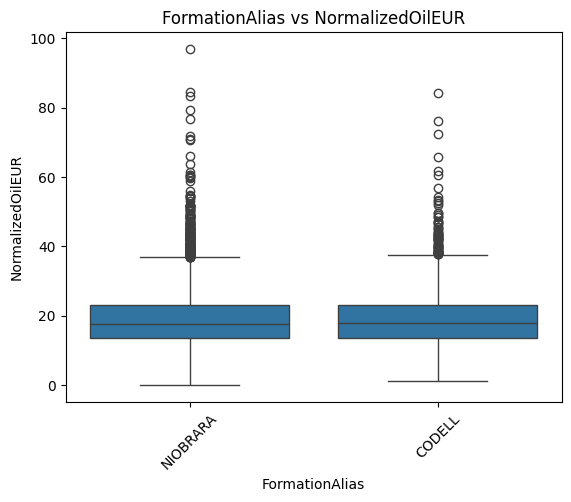

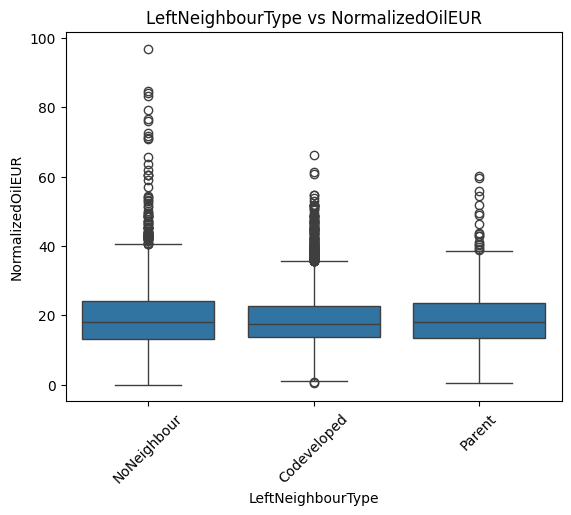

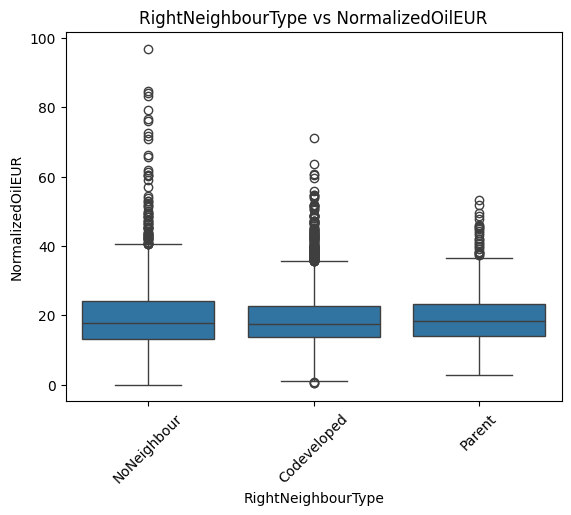

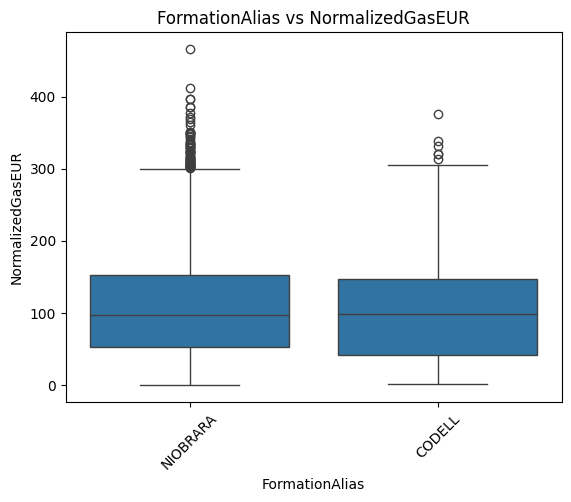

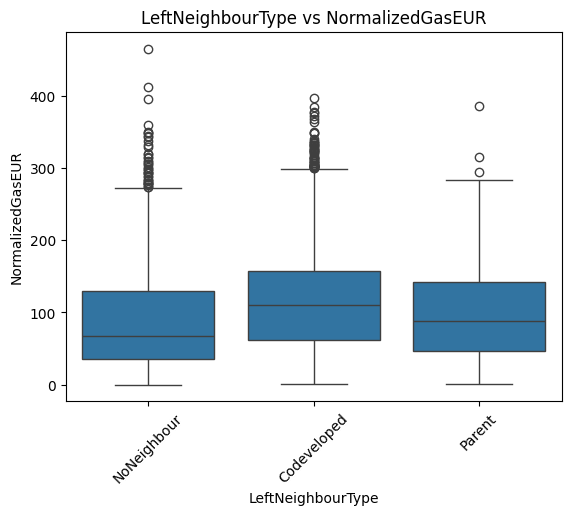

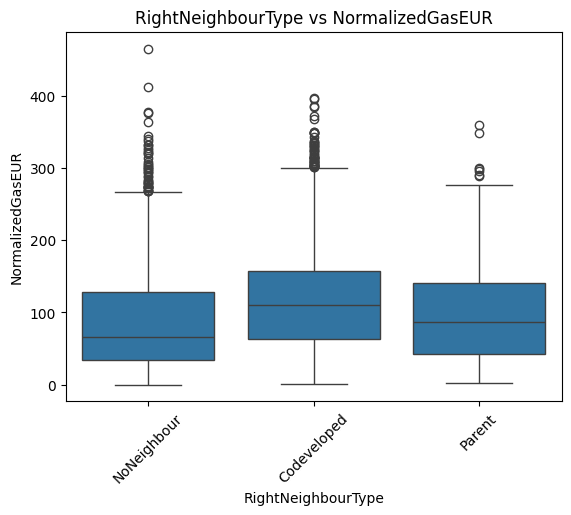